# Training on Multiple Lifeline 


In [11]:
import os
import pandas as pd
import numpy as np

folder_path = 'dFBA_Data_Frames_Lifelines - Small'
file_names = sorted(os.listdir(folder_path))

expected_timepoints = 376 # reduced timepoints by 10 for faster runs, just temporary 

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    # Select every 10th row and ensure there are exactly 376 timepoints
    reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
    reduced_df.to_csv(file_path, sep="\t")

data_list = []
filtered_reactions = None

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    if filtered_reactions is None:
        non_constant_fluxes_df = lifeline_df.loc[:, (lifeline_df != lifeline_df.iloc[0]).any()]
        unique_reactions_fluxes_df = non_constant_fluxes_df.loc[:, ~non_constant_fluxes_df.columns.duplicated()]
        filtered_reactions = unique_reactions_fluxes_df.columns

    filtered_lifeline_df = lifeline_df[filtered_reactions]

    if filtered_lifeline_df.shape != (expected_timepoints, len(filtered_reactions)):
        print(f"Shape mismatch for file: {file_name}. Expected ({expected_timepoints}, {len(filtered_reactions)}) but got {filtered_lifeline_df.shape}")

    data_list.append(filtered_lifeline_df.to_numpy())

data_3d = np.stack(data_list, axis=1)
print("Shape of the Big Matrix:", data_3d.shape)


C:\Users\elysi\AppData\Local\Temp\ipykernel_27696\3474851630.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_27696\3474851630.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_27696\3474851630.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expecte

Shape mismatch for file: lifeline_0_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_106_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_120_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_197_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_263_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_397_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_424_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_581_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_658_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_669_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_801_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismat

In [12]:
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming data_3d is original data with shape (n_timesteps, n_samples, n_features)
# Example: n_timesteps = 376, n_samples = 14, n_features = 48

n_timesteps, n_samples, n_features = data_3d.shape

# Initialize a StandardScaler for each feature for each sample
scalers = [[StandardScaler() for _ in range(n_features)] for _ in range(n_samples)]

# Normalized data will have the same shape as data_3d initially
normalized_data = np.empty_like(data_3d, dtype=float)

# Apply the scalers to each feature for each sample across all timesteps
for sample_index in range(n_samples):
    for feature_index in range(n_features):
        # Extract the feature data for the current sample
        feature_data = data_3d[:, sample_index, feature_index].reshape(-1, 1)
        
        # Fit and transform the data using the corresponding scaler
        normalized_feature_data = scalers[sample_index][feature_index].fit_transform(feature_data)
        
        # Assign the normalized data back to its position in the normalized_data array
        normalized_data[:, sample_index, feature_index] = normalized_feature_data.flatten()

# Transpose normalized_data to have the shape (n_samples, n_timesteps, n_features)
normalized_data = np.transpose(normalized_data, (1, 0, 2))

In [13]:
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.initializers import glorot_uniform, he_normal
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Assuming five_lifeline is a 3D array with the shape (1, 376, 48)
train_data = normalized_data
val_data = train_data  # Using the same data for validation as a placeholder

# Define the input layer with the shape (timesteps, features)
input_shape = (train_data.shape[1], train_data.shape[2])
inputs = Input(shape=input_shape)

# Encoder layers with glorot_uniform initializer
encoded = LSTM(300, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(inputs)
encoded = LSTM(200, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
encoded = LSTM(150, activation='tanh', return_sequences=False,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
# Latent space with he_normal initializer
latent_space = Dense(100, activation='tanh',
                     kernel_initializer=he_normal(seed=0))(encoded)

# Decoder layers, repeat the latent space at each timestep
decoded = RepeatVector(input_shape[0])(latent_space)
decoded = LSTM(150, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(200, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(300, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)

# Output layer, reconstruct the original input
outputs = TimeDistributed(Dense(input_shape[1]))(decoded)

# Create the autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the model
autoencoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 38, 48)]          0         
                                                                 
 lstm_6 (LSTM)               (None, 38, 300)           418800    
                                                                 
 lstm_7 (LSTM)               (None, 38, 200)           400800    
                                                                 
 lstm_8 (LSTM)               (None, 150)               210600    
                                                                 
 dense_2 (Dense)             (None, 100)               15100     
                                                                 
 repeat_vector_1 (RepeatVec  (None, 38, 100)           0         
 tor)                                                            
                                                           

In [14]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=20, min_lr=0.00001)
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Fit the model
history = autoencoder.fit(
    train_data,
    train_data,
    epochs = 500,
    batch_size=32,  # Adjust the batch size if necessary
    validation_data=(val_data, val_data),
    callbacks=[reduce_lr, early_stop]
)

# Predict on the validation set
val_predictions = autoencoder.predict(val_data)

# Compute mean squared error on the validation set
mean_squared_error = np.mean(np.square(val_data - val_predictions))

# Compute root mean squared error (RMSE)
reconstruction_loss = np.sqrt(mean_squared_error)
print(f"Validation RMSE: {reconstruction_loss}")


Epoch 1/500
1/1 [==============================] - 12s 12s/step - loss: 0.9927 - val_loss: 0.9903 - lr: 0.0010
Epoch 2/500
1/1 [==============================] - 0s 364ms/step - loss: 0.9903 - val_loss: 0.9857 - lr: 0.0010
Epoch 3/500
1/1 [==============================] - 0s 300ms/step - loss: 0.9857 - val_loss: 0.9808 - lr: 0.0010
Epoch 4/500
1/1 [==============================] - 0s 302ms/step - loss: 0.9808 - val_loss: 0.9714 - lr: 0.0010
Epoch 5/500
1/1 [==============================] - 0s 352ms/step - loss: 0.9714 - val_loss: 0.9561 - lr: 0.0010
Epoch 6/500
1/1 [==============================] - 0s 300ms/step - loss: 0.9561 - val_loss: 0.9492 - lr: 0.0010
Epoch 7/500
1/1 [==============================] - 0s 298ms/step - loss: 0.9492 - val_loss: 0.9857 - lr: 0.0010
Epoch 8/500
1/1 [==============================] - 0s 334ms/step - loss: 0.9857 - val_loss: 0.9788 - lr: 0.0010
Epoch 9/500
1/1 [==============================] - 0s 278ms/step - loss: 0.9788 - val_loss: 0.9701 - lr: 

1/1 [==============================] - 0s 111ms/step


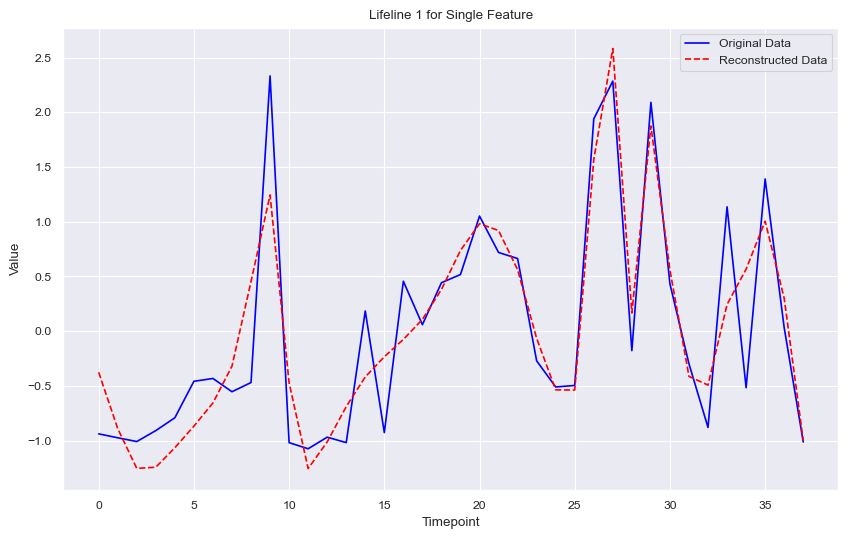

In [15]:
import matplotlib.pyplot as plt

# Assuming that one_lifeline is your data reshaped correctly for the model input
# Example: one_lifeline = np.random.rand(1, 376, 1)  # Use your actual reshaped data here

# Predict the reconstruction for the lifeline
reconstructed = autoencoder.predict(train_data)
lifeline = 5
feature = 6 

# Flatten the arrays to be able to plot them since they contain a single feature
scaled_series = train_data[lifeline,:,feature]
reconstructed_series = reconstructed[lifeline,:,feature]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title('Lifeline 1 for Single Feature')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


In [16]:
from tensorflow.keras.models import Model

# Assuming 'encoded' is the output of your last encoder layer and 'inputs' is your input layer
latent_model = Model(inputs, latent_space)
latent_representations = latent_model.predict(train_data)


1/1 [==============================] - 1s 921ms/step


In [18]:
import pandas as pd

# Convert the latent representations to a DataFrame
latent_df = pd.DataFrame(latent_representations)

# Specify your desired Excel file path
excel_file_path = 'D:/Desktop/Work/Multiple Lifelines/latent_representations_14_lifelines.csv'

# Save the DataFrame to an Excel file
latent_df.to_csv(excel_file_path, index=False)

print(f"Latent representations saved to {excel_file_path}")


Latent representations saved to D:/Desktop/Work/Multiple Lifelines/latent_representations_14_lifelines.csv


In [25]:
import optuna
from tensorflow.keras.layers import Input, LSTM, RepeatVector, Dense, TimeDistributed
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.initializers import glorot_uniform, he_normal
from sklearn.model_selection import train_test_split

# Assuming 'normalized_data' is defined elsewhere in your script
# normalized_data = ...

# Define the objective function to optimize
def objective(trial):
    # Hyperparameter setting
    lstm_units = trial.suggest_categorical('lstm_units', [200, 300, 350, 400])
    lstm_units_layer2 = trial.suggest_categorical('lstm_units_layer2', [200, 250, 275, 300])  # Key name changed
    dense_units = trial.suggest_categorical('dense_units', [50, 100, 150, 200])
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
    batch_size = trial.suggest_categorical('batch_size', [16, 32, 64])

    # Split the data
    train_data, val_data = train_test_split(normalized_data, test_size=0.2, random_state=42)

    # Define the input layer with the shape (timesteps, features)
    input_shape = (train_data.shape[1], train_data.shape[2])
    inputs = Input(shape=input_shape)

    # Encoder layers with glorot_uniform initializer
    encoded = LSTM(lstm_units, activation='tanh', return_sequences=True,
                   kernel_initializer=glorot_uniform(seed=0))(inputs)
    encoded = LSTM(lstm_units_layer2, activation='tanh', return_sequences=False,
                   kernel_initializer=glorot_uniform(seed=0))(encoded)

    # Latent space with he_normal initializer
    latent_space = Dense(dense_units, activation='tanh',
                         kernel_initializer=he_normal(seed=0))(encoded)

    # Decoder layers, repeat the latent space at each timestep
    decoded = RepeatVector(input_shape[0])(latent_space)
    decoded = LSTM(lstm_units_layer2, activation='tanh', return_sequences=True,
                   kernel_initializer=glorot_uniform(seed=0))(decoded)
    decoded = LSTM(lstm_units, activation='tanh', return_sequences=True,
                   kernel_initializer=glorot_uniform(seed=0))(decoded)

    # Output layer, reconstruct the original input
    outputs = TimeDistributed(Dense(input_shape[1]))(decoded)

    # Create the autoencoder model
    autoencoder = Model(inputs, outputs)
    autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse')

    # Early stopping and learning rate reduction
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.00001)

    # Model training
    history = autoencoder.fit(train_data, train_data, epochs=700, batch_size=batch_size,
                              validation_data=(val_data, val_data), callbacks=[early_stop, reduce_lr], verbose=0)

    # Retrieve the best score
    best_score = min(history.history['val_loss'])
    return best_score

# Create a study object and specify the direction is 'minimize'.
study = optuna.create_study(direction='minimize')

# Optimize the study, the objective function is passed in as the first argument.
study.optimize(objective, n_trials=10)  # You can change n_trials to the number of iterations you want to perform

# Print the result
print(study.best_params)


[I 2024-02-21 13:53:44,135] A new study created in memory with name: no-name-9527dc86-4666-4c77-bade-617d26e31c4c
C:\Users\elysi\AppData\Local\Temp\ipykernel_18092\577897805.py:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)
[I 2024-02-21 13:53:58,746] Trial 0 finished with value: 0.9940025210380554 and parameters: {'lstm_units': 200, 'lstm_units_layer2': 275, 'dense_units': 200, 'learning_rate': 4.57064882981988e-05, 'batch_size': 32}. Best is trial 0 with value: 0.9940025210380554.
[I 2024-02-21 13:54:25,044] Trial 1 finished with value: 0.807985782623291 and parameters: {'lstm_units': 400, 'lstm_units_layer2': 250, 'dense_units': 100, 'learning_rate': 0.00021939476012720676, 'batch_size': 64}. Best is trial 1 with value: 0.807985782623291.
[I 2024-02-21 

{'lstm_units': 400, 'lstm_units_layer2': 300, 'dense_units': 100, 'learning_rate': 0.00040225479094866155, 'batch_size': 16}


In [45]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, LSTM, RepeatVector, Dense, TimeDistributed
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Optimized hyperparameters
lstm_units = study.best_params['lstm_units'] # Optimized LSTM units for both encoder and decoder
lstm_units_layer2 = study.best_params['lstm_units_layer2']
dense_units = study.best_params['dense_units'] # Optimized Dense units for latent representation
learning_rate = study.best_params['learning_rate']  # Optimized learning rate
batch_size = study.best_params['batch_size']  # Optimized batch size

# Split the data
train_data, val_data = train_test_split(normalized_data, test_size=0.2, random_state=42)

# Define the input layer with the shape (timesteps, features)
input_shape = (train_data.shape[1], train_data.shape[2])
inputs = Input(shape=input_shape)

# Encoder layers with glorot_uniform initializer
encoded = LSTM(lstm_units, activation='tanh', return_sequences=True,
                   kernel_initializer=glorot_uniform(seed=0))(inputs)
encoded = LSTM(lstm_units_layer2, activation='tanh', return_sequences=False,
                   kernel_initializer=glorot_uniform(seed=0))(encoded)

# Latent space with he_normal initializer
latent_space = Dense(dense_units, activation='tanh',
                         kernel_initializer=he_normal(seed=0))(encoded)

# Decoder layers, repeat the latent space at each timestep
decoded = RepeatVector(input_shape[0])(latent_space)
decoded = LSTM(lstm_units_layer2, activation='tanh', return_sequences=True,
                   kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(lstm_units, activation='tanh', return_sequences=True,
                   kernel_initializer=glorot_uniform(seed=0))(decoded)

# Output layer, reconstruct the original input
outputs = TimeDistributed(Dense(input_shape[1]))(decoded)

# Create the autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse')

# Callbacks for training
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.00001)
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = autoencoder.fit(train_data, train_data, epochs=400, batch_size=batch_size,
                              validation_data=(val_data, val_data), callbacks=[early_stop, reduce_lr], verbose=0)
# Predict on the validation set
val_predictions = autoencoder.predict(val_data)

# Compute mean squared error on the validation set
mean_squared_error = np.mean(np.square(val_data - val_predictions))

# Compute root mean squared error (RMSE)
reconstruction_loss = np.sqrt(mean_squared_error)
print(f"Validation RMSE: {reconstruction_loss}")


1/1 [==============================] - 1s 1s/step
Validation RMSE: 0.8765563444114308


1/1 [==============================] - 0s 125ms/step


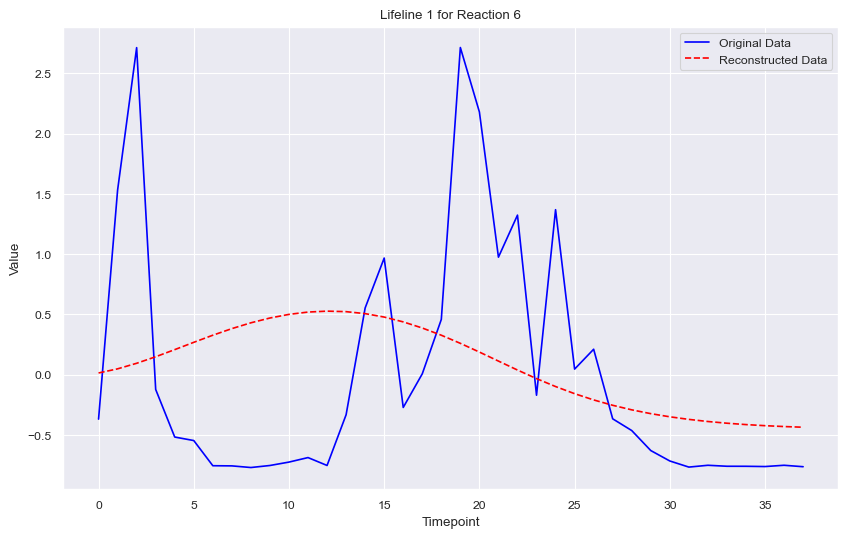

In [30]:
import matplotlib.pyplot as plt

# Choose a specific lifeline and reaction for plotting
lifeline_index = 12  # Index for lifeline 0 
reaction_index = 6 # Reaction index, biomass reaction

# Predict the reconstruction for the lifeline
reconstructed = autoencoder.predict(normalized_data)

# Extract series for plotting
scaled_series = normalized_data[lifeline_index, :, reaction_index]
reconstructed_series = reconstructed[lifeline_index, :, reaction_index]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title(f'Lifeline 1 for Reaction {reaction_index}')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()

In [ ]:
from tensorflow.keras.models import Model

# Assuming 'encoded' is the output of your last encoder layer and 'inputs' is your input layer
latent_model = Model(inputs, latent_space)
latent_representations = latent_model.predict(train_data)


In [ ]:
import pandas as pd

# Convert the latent representations to a DataFrame
latent_df = pd.DataFrame(latent_representations)

# Specify your desired Excel file path
excel_file_path = '/mnt/data/latent_representations_tuned.xlsx'

# Save the DataFrame to an Excel file
latent_df.to_excel(excel_file_path, index=False)

print(f"Latent representations saved to {excel_file_path}")


# Only used biomass reaction

In [39]:
import os
import pandas as pd
import numpy as np

folder_path = '100_dFBA_Lifelines'
file_names = sorted(os.listdir(folder_path))

expected_timepoints = 376 # reduced timepoints by 10 for faster runs, just temporary 

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    # Select every 10th row and ensure there are exactly 376 timepoints
    reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
    reduced_df.to_csv(file_path, sep="\t")

data_list = []
filtered_reactions = None

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    if filtered_reactions is None:
        non_constant_fluxes_df = lifeline_df.loc[:, (lifeline_df != lifeline_df.iloc[0]).any()]
        unique_reactions_fluxes_df = non_constant_fluxes_df.loc[:, ~non_constant_fluxes_df.columns.duplicated()]
        filtered_reactions = unique_reactions_fluxes_df.columns

    filtered_lifeline_df = lifeline_df[filtered_reactions]

    if filtered_lifeline_df.shape != (expected_timepoints, len(filtered_reactions)):
        print(f"Shape mismatch for file: {file_name}. Expected ({expected_timepoints}, {len(filtered_reactions)}) but got {filtered_lifeline_df.shape}")

    data_list.append(filtered_lifeline_df.to_numpy())

data_3d = np.stack(data_list, axis=1)
print("Shape of the Big Matrix:", data_3d.shape)


C:\Users\elysi\AppData\Local\Temp\ipykernel_27696\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_27696\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_27696\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_t

Shape mismatch for file: lifeline_0_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_100_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_10_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_11_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_12_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_13_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_14_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_15_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_16_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_17_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for file: lifeline_18_dFBA_pd_df.csv. Expected (376, 48) but got (38, 48)
Shape mismatch for fi

In [40]:
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming data_3d is original data with shape (n_timesteps, n_samples, n_features)
# Example: n_timesteps = 376, n_samples = 14, n_features = 48

n_timesteps, n_samples, n_features = data_3d.shape

# Initialize a StandardScaler for each feature for each sample
scalers = [[StandardScaler() for _ in range(n_features)] for _ in range(n_samples)]

# Normalized data will have the same shape as data_3d initially
normalized_data = np.empty_like(data_3d, dtype=float)

# Apply the scalers to each feature for each sample across all timesteps
for sample_index in range(n_samples):
    for feature_index in range(n_features):
        # Extract the feature data for the current sample
        feature_data = data_3d[:, sample_index, feature_index].reshape(-1, 1)
        
        # Fit and transform the data using the corresponding scaler
        normalized_feature_data = scalers[sample_index][feature_index].fit_transform(feature_data)
        
        # Assign the normalized data back to its position in the normalized_data array
        normalized_data[:, sample_index, feature_index] = normalized_feature_data.flatten()

# Transpose normalized_data to have the shape (n_samples, n_timesteps, n_features)
normalized_data = np.transpose(normalized_data, (1, 0, 2))

In [45]:
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.initializers import glorot_uniform, he_normal
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Assuming five_lifeline is a 3D array with the shape (1, 376, 48)
train_data = normalized_data
val_data = train_data  # Using the same data for validation as a placeholder

# Define the input layer with the shape (timesteps, features)
input_shape = (train_data.shape[1], train_data.shape[2])
inputs = Input(shape=input_shape)

# Encoder layers with glorot_uniform initializer
encoded = LSTM(400, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(inputs)
encoded = LSTM(300, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
encoded = LSTM(200, activation='tanh', return_sequences=False,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
# Latent space with he_normal initializer
latent_space = Dense(100, activation='tanh',
                     kernel_initializer=he_normal(seed=0))(encoded)

# Decoder layers, repeat the latent space at each timestep
decoded = RepeatVector(input_shape[0])(latent_space)
decoded = LSTM(200, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(300, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(400, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)

# Output layer, reconstruct the original input
outputs = TimeDistributed(Dense(input_shape[1]))(decoded)

# Create the autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the model
autoencoder.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 38, 1)]           0         
                                                                 
 lstm_30 (LSTM)              (None, 38, 400)           643200    
                                                                 
 lstm_31 (LSTM)              (None, 38, 300)           841200    
                                                                 
 lstm_32 (LSTM)              (None, 200)               400800    
                                                                 
 dense_10 (Dense)            (None, 100)               20100     
                                                                 
 repeat_vector_5 (RepeatVec  (None, 38, 100)           0         
 tor)                                                            
                                                           

In [46]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=20, min_lr=0.00001)
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Fit the model
history = autoencoder.fit(
    train_data,
    train_data,
    epochs = 500,
    batch_size=32,  # Adjust the batch size if necessary
    validation_data=(val_data, val_data),
    callbacks=[reduce_lr, early_stop]
)

# Predict on the validation set
val_predictions = autoencoder.predict(val_data)

# Compute mean squared error on the validation set
mean_squared_error = np.mean(np.square(val_data - val_predictions))

# Compute root mean squared error (RMSE)
reconstruction_loss = np.sqrt(mean_squared_error)
print(f"Validation RMSE: {reconstruction_loss}")


Epoch 1/500
4/4 [==============================] - 23s 4s/step - loss: 1.2687 - val_loss: 0.9953 - lr: 0.0010
Epoch 2/500
4/4 [==============================] - 12s 3s/step - loss: 0.9991 - val_loss: 0.9954 - lr: 0.0010
Epoch 3/500
4/4 [==============================] - 11s 3s/step - loss: 0.9908 - val_loss: 0.9740 - lr: 0.0010
Epoch 4/500
4/4 [==============================] - 11s 3s/step - loss: 0.9704 - val_loss: 0.9601 - lr: 0.0010
Epoch 5/500
4/4 [==============================] - 11s 3s/step - loss: 0.9608 - val_loss: 0.9573 - lr: 0.0010
Epoch 6/500
4/4 [==============================] - 11s 3s/step - loss: 0.9493 - val_loss: 0.9355 - lr: 0.0010
Epoch 7/500
4/4 [==============================] - 10s 3s/step - loss: 0.9302 - val_loss: 0.9250 - lr: 0.0010
Epoch 8/500
4/4 [==============================] - 11s 3s/step - loss: 0.9160 - val_loss: 0.8943 - lr: 0.0010
Epoch 9/500
4/4 [==============================] - 11s 3s/step - loss: 0.8892 - val_loss: 0.8696 - lr: 0.0010
Epoch 10/5

4/4 [==============================] - 2s 418ms/step


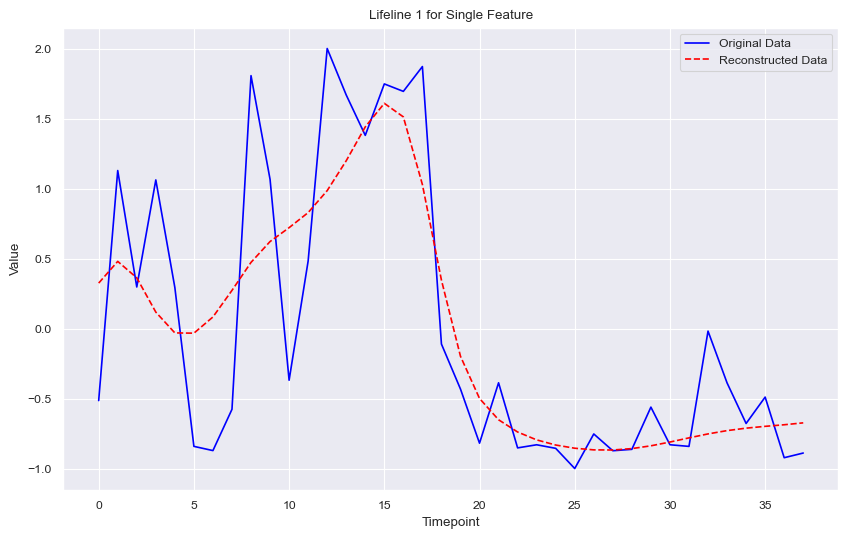

In [48]:
import matplotlib.pyplot as plt 

# Predict the reconstruction for the lifeline
reconstructed = autoencoder.predict(train_data)
lifeline = 5
feature = 0 

# Flatten the arrays to be able to plot them since they contain a single feature
scaled_series = train_data[lifeline,:,feature]
reconstructed_series = reconstructed[lifeline,:,feature]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title('Lifeline 1 for Single Feature')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


In [49]:
from tensorflow.keras.models import Model

# Assuming 'encoded' is the output of your last encoder layer and 'inputs' is your input layer
latent_model = Model(inputs, latent_space)
latent_representations = latent_model.predict(train_data)


4/4 [==============================] - 2s 287ms/step


In [50]:
import pandas as pd

# Convert the latent representations to a DataFrame
latent_df = pd.DataFrame(latent_representations)

# Specify your desired Excel file path
excel_file_path = 'D:/Desktop/Work/Multiple Lifelines/latent_representations_100_lifelines_just_biomass.csv'

# Save the DataFrame to an Excel file
latent_df.to_csv(excel_file_path, index=False)

print(f"Latent representations saved to {excel_file_path}")


Latent representations saved to D:/Desktop/Work/Multiple Lifelines/latent_representations_100_lifelines_just_biomass.csv


In [52]:
lifelines_to_clusters = pd.read_csv('lifelines_to_clusters.csv')

In [53]:
lifelines_to_clusters

,Unnamed: 0,cluster
0,28,1
1,80,2
2,22,2
3,9,3
4,5,4
...,...,...
96,61,1
97,59,1
98,83,1
99,101,2


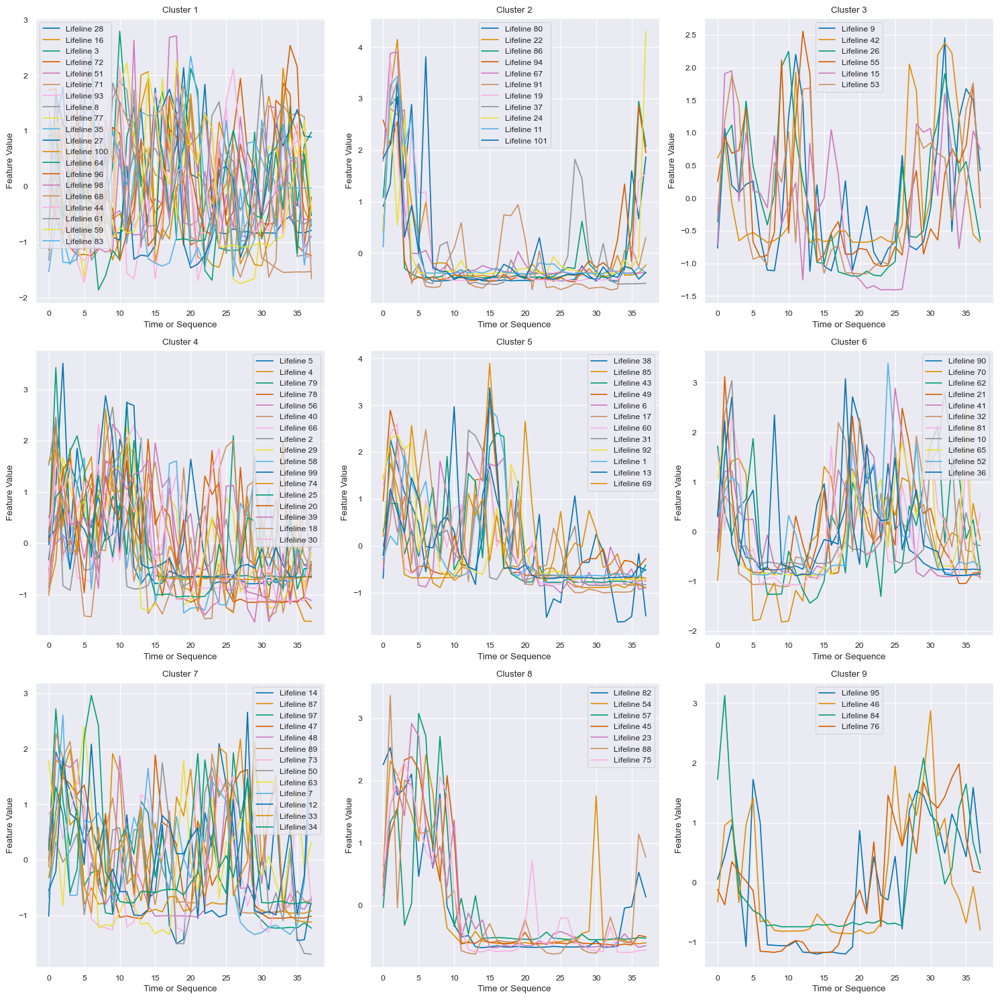

In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file with lifeline-cluster pairs
lifelines_to_clusters = pd.read_csv('lifelines_to_clusters.csv')
lifelines_to_clusters.columns = ['lifeline', 'cluster']

# Determine the number of clusters
num_clusters = lifelines_to_clusters['cluster'].nunique()

# Setup the figure and axes for a 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))  # Adjust the size as needed
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Create a plot for each cluster on its own subplot
for cluster_id in range(1, num_clusters + 1):
    # Find all lifelines belonging to the current cluster
    lifelines_in_cluster = lifelines_to_clusters[lifelines_to_clusters['cluster'] == cluster_id]['lifeline']
    
    # Get the corresponding subplot axis
    ax = axes[cluster_id - 1]
    
    # Plot each lifeline in the cluster
    for lifeline in lifelines_in_cluster:
        # Adjust lifeline index for zero-based indexing
        adjusted_lifeline_index = lifeline - 1
        
        # Extract the lifeline data from train_data
        # Replace 'feature' with the correct index for your feature
        lifeline_data = train_data[adjusted_lifeline_index, :, feature]  
        ax.plot(lifeline_data, label=f'Lifeline {lifeline}')
    
    # Set titles and labels for each subplot
    ax.set_title(f'Cluster {cluster_id}')
    ax.set_xlabel('Time or Sequence')
    ax.set_ylabel('Feature Value')
    ax.legend()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# Latent Space for Each Timestep

In [5]:
import os
import pandas as pd
import numpy as np

folder_path = '100_dFBA_Lifelines'
file_names = sorted(os.listdir(folder_path))

expected_timepoints = 376 # reduced timepoints by 10 for faster runs, just temporary 

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    # Select every 10th row and ensure there are exactly 376 timepoints
    reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
    reduced_df.to_csv(file_path, sep="\t")

data_list = []
filtered_reactions = None

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    if filtered_reactions is None:
        non_constant_fluxes_df = lifeline_df.loc[:, (lifeline_df != lifeline_df.iloc[0]).any()]
        unique_reactions_fluxes_df = non_constant_fluxes_df.loc[:, ~non_constant_fluxes_df.columns.duplicated()]
        filtered_reactions = unique_reactions_fluxes_df.columns

    filtered_lifeline_df = lifeline_df[filtered_reactions]

    if filtered_lifeline_df.shape != (expected_timepoints, len(filtered_reactions)):
        print(f"Shape mismatch for file: {file_name}. Expected ({expected_timepoints}, {len(filtered_reactions)}) but got {filtered_lifeline_df.shape}")

    data_list.append(filtered_lifeline_df.to_numpy())

data_3d = np.stack(data_list, axis=1)
print("Shape of the Big Matrix:", data_3d.shape)


C:\Users\elysi\AppData\Local\Temp\ipykernel_23580\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_23580\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_23580\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_t

Shape of the Big Matrix: (376, 101, 48)


In [6]:
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming data_3d is original data with shape (n_timesteps, n_samples, n_features)
# Example: n_timesteps = 376, n_samples = 14, n_features = 48

n_timesteps, n_samples, n_features = data_3d.shape

# Initialize a StandardScaler for each feature for each sample
scalers = [[StandardScaler() for _ in range(n_features)] for _ in range(n_samples)]

# Normalized data will have the same shape as data_3d initially
normalized_data = np.empty_like(data_3d, dtype=float)

# Apply the scalers to each feature for each sample across all timesteps
for sample_index in range(n_samples):
    for feature_index in range(n_features):
        # Extract the feature data for the current sample
        feature_data = data_3d[:, sample_index, feature_index].reshape(-1, 1)
        
        # Fit and transform the data using the corresponding scaler
        normalized_feature_data = scalers[sample_index][feature_index].fit_transform(feature_data)
        
        # Assign the normalized data back to its position in the normalized_data array
        normalized_data[:, sample_index, feature_index] = normalized_feature_data.flatten()

# Transpose normalized_data to have the shape (n_samples, n_timesteps, n_features)
normalized_data = np.transpose(normalized_data, (1, 0, 2))

In [7]:
normalized_data.shape

(101, 376, 48)

In [4]:
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, TimeDistributed
from tensorflow.keras.initializers import glorot_uniform, he_normal
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Assuming train_data is a 3D array with the shape (1, 376, 48)
train_data = normalized_data
val_data = train_data  # Using the same data for validation as a placeholder

# Define the input layer with the shape (timesteps, features)
input_shape = (train_data.shape[1], train_data.shape[2])
inputs = Input(shape=input_shape)

# Encoder layers with glorot_uniform initializer
encoded = LSTM(400, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(inputs)
encoded = LSTM(200, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
# This LSTM layer now returns sequences, providing a latent vector for each timestep
encoded = LSTM(10, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)

# Decoder layers
# No need for RepeatVector since we're returning sequences in the encoder
decoded = LSTM(10, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
decoded = LSTM(200, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(400, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)

# Output layer, reconstruct the original input at each timestep
outputs = TimeDistributed(Dense(input_shape[1]))(decoded)

# Create the autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the model
autoencoder.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 376, 48)]         0         
                                                                 
 lstm (LSTM)                 (None, 376, 400)          718400    
                                                                 
 lstm_1 (LSTM)               (None, 376, 200)          480800    
                                                                 
 lstm_2 (LSTM)               (None, 376, 10)           8440      
                                                                 
 lstm_3 (LSTM)               (None, 376, 10)           840       
                                                                 
 lstm_4 (LSTM)               (None, 376, 200)          168800    
                                                                 
 lstm_5 (LSTM)               (None, 376, 400)          961600

In [5]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=20, min_lr=0.00001)
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Fit the model
history = autoencoder.fit(
    train_data,
    train_data,
    epochs = 100,
    batch_size=32,  # Adjust the batch size if necessary
    validation_data=(val_data, val_data),
    callbacks=[reduce_lr, early_stop]
)

# Predict on the validation set
val_predictions = autoencoder.predict(val_data)

# Compute mean squared error on the validation set
mean_squared_error = np.mean(np.square(val_data - val_predictions))

# Compute root mean squared error (RMSE)
reconstruction_loss = np.sqrt(mean_squared_error)
print(f"Validation RMSE: {reconstruction_loss}")


Epoch 1/100
4/4 [==============================] - 44s 9s/step - loss: 0.9653 - val_loss: 0.8598 - lr: 0.0010
Epoch 2/100
4/4 [==============================] - 35s 9s/step - loss: 0.8182 - val_loss: 0.7891 - lr: 0.0010
Epoch 3/100
4/4 [==============================] - 34s 8s/step - loss: 0.7401 - val_loss: 0.6496 - lr: 0.0010
Epoch 4/100
4/4 [==============================] - 34s 9s/step - loss: 0.6186 - val_loss: 0.5855 - lr: 0.0010
Epoch 5/100
4/4 [==============================] - 36s 9s/step - loss: 0.5525 - val_loss: 0.5094 - lr: 0.0010
Epoch 6/100
4/4 [==============================] - 39s 9s/step - loss: 0.4848 - val_loss: 0.4139 - lr: 0.0010
Epoch 7/100
4/4 [==============================] - 40s 10s/step - loss: 0.3998 - val_loss: 0.3696 - lr: 0.0010
Epoch 8/100
4/4 [==============================] - 40s 10s/step - loss: 0.3459 - val_loss: 0.2934 - lr: 0.0010
Epoch 9/100
4/4 [==============================] - 43s 11s/step - loss: 0.2854 - val_loss: 0.2493 - lr: 0.0010
Epoch 1

4/4 [==============================] - 11s 3s/step


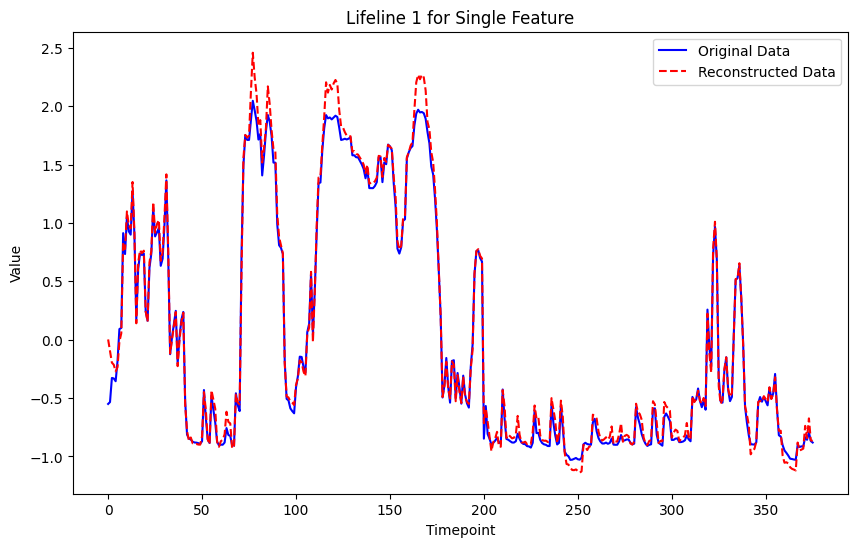

In [6]:
import matplotlib.pyplot as plt

# Assuming that one_lifeline is your data reshaped correctly for the model input
# Example: one_lifeline = np.random.rand(1, 376, 1)  # Use your actual reshaped data here

# Predict the reconstruction for the lifeline
reconstructed = autoencoder.predict(train_data)
lifeline = 5
feature = 0 

# Flatten the arrays to be able to plot them since they contain a single feature
scaled_series = train_data[lifeline,:,feature]
reconstructed_series = reconstructed[lifeline,:,feature]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title('Lifeline 1 for Single Feature')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


In [ ]:
# Create a model that includes the input and the output of the last LSTM layer you consider as the latent space
latent_model = Model(inputs=inputs, outputs=encoded)

# Checking the model summary to ensure it's capturing the correct layer
latent_model.summary()

latent_space_representations = latent_model.predict(train_data)

# latent_space_representations now contains the latent vectors for each timestep
# Calculate the average latent vector across timesteps for each sample
average_latent_vectors = np.mean(latent_space_representations, axis=1)

# Save to CSV using pandas
import pandas as pd

# Convert to DataFrame
df = pd.DataFrame(average_latent_vectors)

# Save DataFrame to CSV
csv_file_path = 'latent_space_representations.csv'
df.to_csv(csv_file_path, index=False)


In [75]:
lifelines_to_clusters_timesteps = pd.read_csv('lifelines_to_clusters_timesteps.csv')

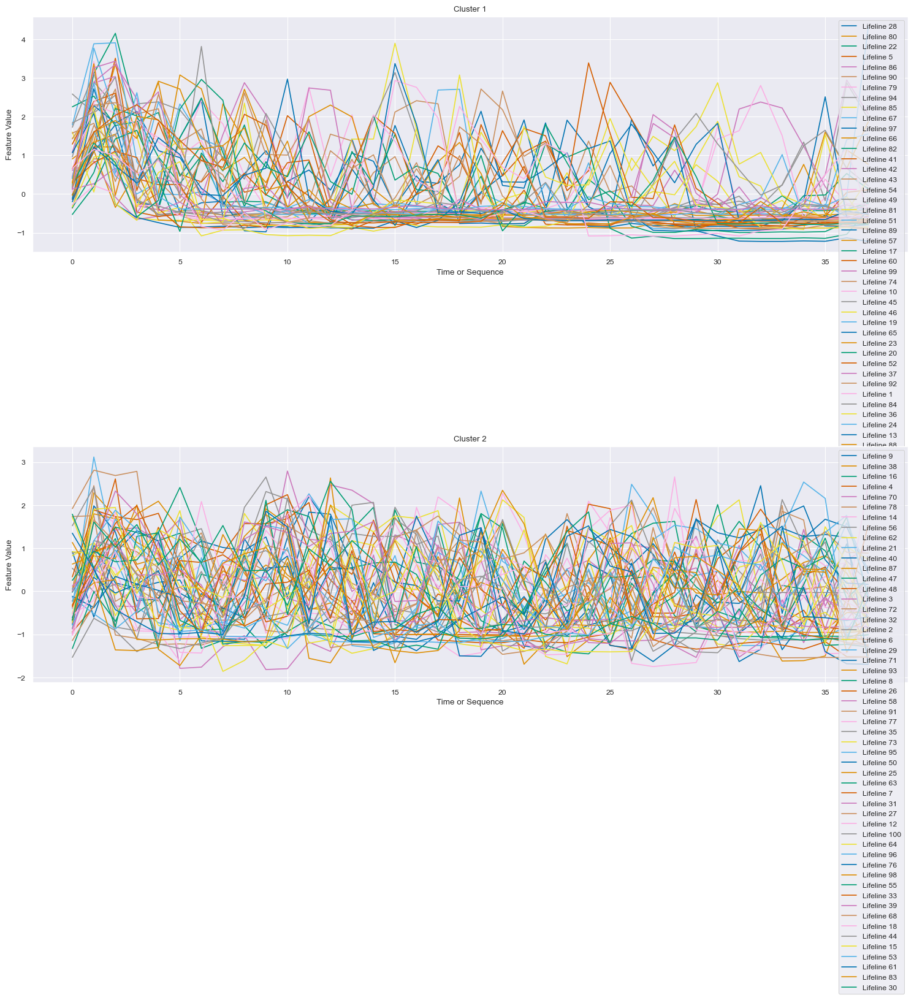

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file with lifeline-cluster pairs
lifelines_to_clusters_timesteps = pd.read_csv('lifelines_to_clusters_timesteps.csv')
lifelines_to_clusters_timesteps.columns = ['lifeline', 'cluster']

# Determine the number of clusters
num_clusters = lifelines_to_clusters_timesteps['cluster'].nunique()

# Setup the figure and axes for a 3x3 grid
fig, axes = plt.subplots(2, 1, figsize=(15, 15))  # Adjust the size as needed
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Create a plot for each cluster on its own subplot
for cluster_id in range(1, num_clusters + 1):
    # Find all lifelines belonging to the current cluster
    lifelines_in_cluster = lifelines_to_clusters_timesteps[lifelines_to_clusters_timesteps['cluster'] == cluster_id]['lifeline']
    
    # Get the corresponding subplot axis
    ax = axes[cluster_id - 1]
    
    # Plot each lifeline in the cluster
    for lifeline in lifelines_in_cluster:
        # Adjust lifeline index for zero-based indexing
        adjusted_lifeline_index = lifeline - 1
        
        # Extract the lifeline data from train_data
        # Replace 'feature' with the correct index for your feature
        lifeline_data = train_data[adjusted_lifeline_index, :, feature]  
        ax.plot(lifeline_data, label=f'Lifeline {lifeline}')
    
    # Set titles and labels for each subplot
    ax.set_title(f'Cluster {cluster_id}')
    ax.set_xlabel('Time or Sequence')
    ax.set_ylabel('Feature Value')
    ax.legend()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [88]:
# Get the weights of the first decoder LSTM layer
decoder_lstm1 = autoencoder.layers[-3]  # Assuming the last three LSTM layers are the decoder
kernel_weights_1, recurrent_weights_1, biases_1 = decoder_lstm1.get_weights()

# Get the weights of the second decoder LSTM layer
decoder_lstm2 = autoencoder.layers[-2]
kernel_weights_2, recurrent_weights_2, biases_2 = decoder_lstm2.get_weights()

# Get the weights of the output layer (TimeDistributed(Dense(...)))
# The TimeDistributed layer wraps the Dense layer, so you need to access the layer attribute
output_layer = autoencoder.layers[-1].layer
output_kernel_weights, output_biases = output_layer.get_weights()


# Function to find the highest absolute weights in a Dense layer
def find_highest_weights_dense(weights, top_n=5):
    # Take the absolute value of the weights
    abs_weights = np.abs(weights)
    # Find the indices of the top 'n' weights
    top_indices = np.unravel_index(np.argsort(abs_weights, axis=None)[-top_n:], weights.shape)
    # Get the top 'n' weights
    top_weights = weights[top_indices]
    return top_indices, top_weights

# Find the top 5 weights in the output dense layer
top_indices, top_weights = find_highest_weights_dense(output_kernel_weights, top_n=5)
print("Top 5 weights indices:", top_indices)
print("Top 5 weights:", top_weights)



Top 5 weights indices: (array([  9, 270, 254, 374,   9], dtype=int64), array([25, 37, 38, 37, 37], dtype=int64))
Top 5 weights: [-0.3988532  -0.47970894 -0.5011315   0.52769345  0.6915405 ]


In [40]:
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, TimeDistributed
from tensorflow.keras.initializers import glorot_uniform, he_normal
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Assuming train_data is a 3D array with the shape (1, 376, 48)
train_data = normalized_data
val_data = train_data  # Using the same data for validation as a placeholder

# Define the input layer with the shape (timesteps, features)
input_shape = (train_data.shape[1], train_data.shape[2])
inputs = Input(shape=input_shape)

# Encoder layers with glorot_uniform initializer
encoded = LSTM(150, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(inputs)
encoded = LSTM(100, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
# This LSTM layer now returns sequences, providing a latent vector for each timestep
encoded = LSTM(10, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)

# Decoder layers
# No need for RepeatVector since we're returning sequences in the encoder
decoded = LSTM(10, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
decoded = LSTM(100, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(150, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)

# Output layer, reconstruct the original input at each timestep
outputs = TimeDistributed(Dense(input_shape[1]))(decoded)

# Create the autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the model
autoencoder.summary()


Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 376, 48)]         0         
                                                                 
 lstm_114 (LSTM)             (None, 376, 150)          119400    
                                                                 
 lstm_115 (LSTM)             (None, 376, 100)          100400    
                                                                 
 lstm_116 (LSTM)             (None, 376, 10)           4440      
                                                                 
 lstm_117 (LSTM)             (None, 376, 10)           840       
                                                                 
 lstm_118 (LSTM)             (None, 376, 100)          44400     
                                                                 
 lstm_119 (LSTM)             (None, 376, 150)          150

In [41]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=20, min_lr=0.00001)
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Fit the model
history = autoencoder.fit(
    train_data,
    train_data,
    epochs = 50,
    batch_size=32,  # Adjust the batch size if necessary
    validation_data=(val_data, val_data),
    callbacks=[reduce_lr, early_stop]
)

# Predict on the validation set
val_predictions = autoencoder.predict(val_data)

# Compute mean squared error on the validation set
mean_squared_error = np.mean(np.square(val_data - val_predictions))

# Compute root mean squared error (RMSE)
reconstruction_loss = np.sqrt(mean_squared_error)
print(f"Validation RMSE: {reconstruction_loss}")


Epoch 1/50
4/4 [==============================] - 38s 7s/step - loss: 0.9962 - val_loss: 0.9664 - lr: 0.0010
Epoch 2/50
4/4 [==============================] - 27s 7s/step - loss: 0.9465 - val_loss: 0.8819 - lr: 0.0010
Epoch 3/50
4/4 [==============================] - 25s 6s/step - loss: 0.8555 - val_loss: 0.7895 - lr: 0.0010
Epoch 4/50
4/4 [==============================] - 26s 7s/step - loss: 0.7600 - val_loss: 0.7021 - lr: 0.0010
Epoch 5/50
4/4 [==============================] - 25s 6s/step - loss: 0.6830 - val_loss: 0.6267 - lr: 0.0010
Epoch 6/50
4/4 [==============================] - 25s 6s/step - loss: 0.6072 - val_loss: 0.5851 - lr: 0.0010
Epoch 7/50
4/4 [==============================] - 26s 6s/step - loss: 0.5567 - val_loss: 0.5005 - lr: 0.0010
Epoch 8/50
4/4 [==============================] - 26s 6s/step - loss: 0.4866 - val_loss: 0.4482 - lr: 0.0010
Epoch 9/50
4/4 [==============================] - 27s 7s/step - loss: 0.4345 - val_loss: 0.3955 - lr: 0.0010
Epoch 10/50
4/4 [==

In [ ]:
import matplotlib.pyplot as plt

# Assuming that one_lifeline is your data reshaped correctly for the model input
# Example: one_lifeline = np.random.rand(1, 376, 1)  # Use your actual reshaped data here

# Predict the reconstruction for the lifeline
reconstructed = autoencoder.predict(train_data)
lifeline = 5
feature = 0 

# Flatten the arrays to be able to plot them since they contain a single feature
scaled_series = train_data[lifeline,:,feature]
reconstructed_series = reconstructed[lifeline,:,feature]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title('Lifeline 1 for Single Feature')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


# Faster Training - Super Convergence - All Timesteps

In [2]:
import os
import pandas as pd
import numpy as np

folder_path = '100_dFBA_Lifelines'
file_names = sorted(os.listdir(folder_path))

expected_timepoints = 376 # reduced timepoints by 10 for faster runs, just temporary 

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    # Select every 10th row and ensure there are exactly 376 timepoints
    reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
    # reduced_df = lifeline_df.iloc[:expected_timepoints]
    reduced_df.to_csv(file_path, sep="\t")
    # lifeline_df.to_csv(file_path, sep="\t")

data_list = []
filtered_reactions = None

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    if filtered_reactions is None:
        non_constant_fluxes_df = lifeline_df.loc[:, (lifeline_df != lifeline_df.iloc[0]).any()]
        unique_reactions_fluxes_df = non_constant_fluxes_df.loc[:, ~non_constant_fluxes_df.columns.duplicated()]
        filtered_reactions = unique_reactions_fluxes_df.columns

    filtered_lifeline_df = lifeline_df[filtered_reactions]

    if filtered_lifeline_df.shape != (expected_timepoints, len(filtered_reactions)):
        print(f"Shape mismatch for file: {file_name}. Expected ({expected_timepoints}, {len(filtered_reactions)}) but got {filtered_lifeline_df.shape}")

    data_list.append(filtered_lifeline_df.to_numpy())

data_3d = np.stack(data_list, axis=1)
print("Shape of the Big Matrix:", data_3d.shape)


C:\Users\elysi\AppData\Local\Temp\ipykernel_40880\1586609819.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_40880\1586609819.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_40880\1586609819.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expecte

Shape of the Big Matrix: (376, 101, 48)


In [3]:
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming data_3d is original data with shape (n_timesteps, n_samples, n_features)

n_timesteps, n_samples, n_features = data_3d.shape

# Initialize a StandardScaler for each feature for each sample
scalers = [[StandardScaler() for _ in range(n_features)] for _ in range(n_samples)]

# Normalized data will have the same shape as data_3d initially
normalized_data = np.empty_like(data_3d, dtype=float)

# Apply the scalers to each feature for each sample across all timesteps
for sample_index in range(n_samples):
    for feature_index in range(n_features):
        # Extract the feature data for the current sample
        feature_data = data_3d[:, sample_index, feature_index].reshape(-1, 1)
        
        # Fit and transform the data using the corresponding scaler
        normalized_feature_data = scalers[sample_index][feature_index].fit_transform(feature_data)
        
        # Assign the normalized data back to its position in the normalized_data array
        normalized_data[:, sample_index, feature_index] = normalized_feature_data.flatten()

# Transpose normalized_data to have the shape (n_samples, n_timesteps, n_features)
normalized_data = np.transpose(normalized_data, (1, 0, 2))

In [4]:
normalized_data.shape

(101, 376, 48)

In [12]:
import numpy as np
import multiprocessing
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, TimeDistributed
from tensorflow.keras.initializers import glorot_uniform, he_normal
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, Callback
from tensorflow.keras.optimizers import Adam

# Define a model building function
def build_model(input_shape):
    inputs = Input(shape=input_shape)

    # Encoder layers
    encoded = LSTM(150, activation='tanh', return_sequences=True, kernel_initializer=glorot_uniform(seed=0))(inputs)
    encoded = LSTM(100, activation='tanh', return_sequences=True, kernel_initializer=glorot_uniform(seed=0))(encoded)
    encoded = LSTM(10, activation='tanh', return_sequences=True, kernel_initializer=glorot_uniform(seed=0))(encoded)

    # Decoder layers
    decoded = LSTM(10, activation='tanh', return_sequences=True, kernel_initializer=glorot_uniform(seed=0))(encoded)
    decoded = LSTM(100, activation='tanh', return_sequences=True, kernel_initializer=glorot_uniform(seed=0))(decoded)
    decoded = LSTM(150, activation='tanh', return_sequences=True, kernel_initializer=glorot_uniform(seed=0))(decoded)
    outputs = TimeDistributed(Dense(input_shape[1]))(decoded)
    
    autoencoder = Model(inputs, outputs)
    autoencoder.compile(optimizer=Adam(), loss='mse')
    return autoencoder


In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.callbacks import Callback
import tensorflow.keras.backend as K

class LRFinder(Callback):
    def __init__(self, base_lr, max_lr, steps):
        super(LRFinder, self).__init__()
        self.base_lr = base_lr
        self.max_lr = max_lr
        self.steps = steps
        self.lr_increment = (self.max_lr - self.base_lr) / self.steps
        self.lrs = []
        self.losses = []

    def on_batch_end(self, batch, logs=None):
        lr = self.base_lr + batch * self.lr_increment
        self.lrs.append(lr)
        self.losses.append(logs['loss'])
        K.set_value(self.model.optimizer.lr, lr)


def run_lr_finder(normalized_data, base_lr, max_lr, step_size):
    # Use the first sample shape as input_shape, assuming all samples have the same shape
    input_shape = (normalized_data.shape[1], normalized_data.shape[2])
    model = build_model(input_shape)
    lr_finder = LRFinder(base_lr=base_lr, max_lr=max_lr, steps=step_size)
    
    # Use the normalized_data directly
    model.fit(normalized_data, normalized_data, epochs=1, batch_size=32, callbacks=[lr_finder], verbose=0)
    
    return lr_finder.lrs, lr_finder.losses

# Assume normalized_data is already loaded and shaped as (samples, timesteps, features)
# Example shape, replace with your actual normalized_data shape
normalized_data_shape = (101, 376, 48)

learning_rate_ranges = [(1e-5, 1e-3), (1e-4, 1e-2), (1e-3, 1e-1), (1e-1, 8e-1)]
step_size = 100

for i, (base_lr, max_lr) in enumerate(learning_rate_ranges):
    lrs, losses = run_lr_finder(normalized_data, base_lr, max_lr, step_size)
    print(f"Learning Rate Test {i+1}: LR range {base_lr} to {max_lr}")
    print("Learning Rates:", lrs)
    print("Losses:", losses)
    print("-------")


In [11]:
import numpy as np
import tensorflow as tf

class OneCycleLRScheduler(tf.keras.callbacks.Callback):
    def __init__(self, max_lr, total_steps, div_factor=10, increase_fraction=0.3):
        super(OneCycleLRScheduler, self).__init__()
        self.max_lr = max_lr  # Maximum learning rate (upper bound)
        self.total_steps = total_steps  # Total steps in the cycle
        self.div_factor = div_factor  # Determines the lower bound of learning rate
        self.increase_fraction = increase_fraction  # Fraction of steps to increase the learning rate
        self.higher_lr = self.max_lr
        self.lower_lr = self.max_lr / self.div_factor
        self.step_size_up = self.total_steps * self.increase_fraction
        self.step_size_down = self.total_steps - self.step_size_up
        
    def on_train_batch_begin(self, batch, logs=None):
        progress = batch / self.total_steps
        if progress <= self.increase_fraction:
            # Increase phase
            lr = self.lower_lr + (self.higher_lr - self.lower_lr) * (progress / self.increase_fraction)
        else:
            # Decrease phase
            progress -= self.increase_fraction
            lr = self.higher_lr - (self.higher_lr - self.lower_lr) * (progress / (1 - self.increase_fraction))
        tf.keras.backend.set_value(self.model.optimizer.lr, lr)


In [29]:
epochs = 100  # Number of epochs to train
batch_size = 32  # Batch size

# Assuming `train_data` is your training dataset and is an numpy array
train_data = normalized_data
steps_per_epoch = len(train_data) // batch_size
total_steps = epochs * steps_per_epoch

# Assuming normalized_data is a numpy array, determine the input_shape
# This assumes normalized_data is shaped as (samples, timesteps, features)
input_shape = (train_data.shape[1], train_data.shape[2])

# Initialize the One-Cycle policy callback
one_cycle_lr = OneCycleLRScheduler(max_lr=0.114, total_steps=total_steps, div_factor=10, increase_fraction=0.3)

# Build and compile the model
model = build_model(input_shape)
model.compile(optimizer=Adam(), loss='mse')  # Ensure to compile the model, possibly was done inside build_model()

# Assuming you also have labels (y_train) that correspond to train_data
# If train_data is your input and output (for autoencoders), replace `y_train` with `train_data` in `model.fit()`
model.fit(train_data, train_data, epochs=epochs, batch_size=batch_size, callbacks=[one_cycle_lr])


Epoch 1/100
4/4 [==============================] - 39s 6s/step - loss: 0.9669
Epoch 2/100
4/4 [==============================] - 28s 6s/step - loss: 0.8345
Epoch 3/100
4/4 [==============================] - 32s 8s/step - loss: 0.6542
Epoch 4/100
4/4 [==============================] - 27s 6s/step - loss: 0.4850
Epoch 5/100
4/4 [==============================] - 28s 7s/step - loss: 0.2918
Epoch 6/100
4/4 [==============================] - 31s 7s/step - loss: 0.2261
Epoch 7/100
4/4 [==============================] - 26s 6s/step - loss: 0.1726
Epoch 8/100
4/4 [==============================] - 24s 6s/step - loss: 0.1289
Epoch 9/100
4/4 [==============================] - 34s 8s/step - loss: 0.1078
Epoch 10/100
4/4 [==============================] - 36s 8s/step - loss: 0.0966
Epoch 11/100
4/4 [==============================] - 31s 7s/step - loss: 0.0871
Epoch 12/100
4/4 [==============================] - 32s 8s/step - loss: 0.0766
Epoch 13/100
4/4 [==============================] - 27s 6s/st

4/4 [==============================] - 8s 893ms/step


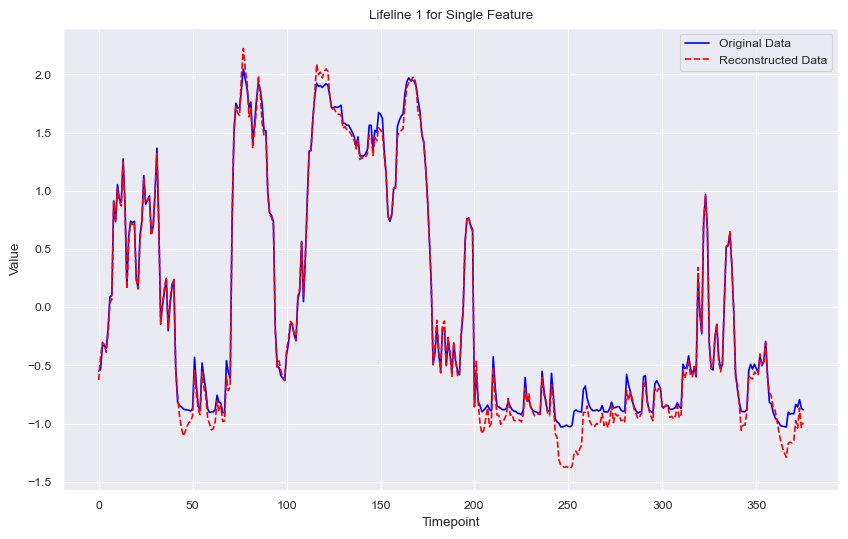

In [30]:
import matplotlib.pyplot as plt

# Assuming that one_lifeline is your data reshaped correctly for the model input
# Example: one_lifeline = np.random.rand(1, 376, 1)  # Use your actual reshaped data here

# Predict the reconstruction for the lifeline
reconstructed = model.predict(train_data)
lifeline = 5
feature = 6 

# Flatten the arrays to be able to plot them since they contain a single feature
scaled_series = train_data[lifeline,:,feature]
reconstructed_series = reconstructed[lifeline,:,feature]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title('Lifeline 1 for Single Feature')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


In [33]:
model.save('autoencoder_model_100lifelines_378timesteps.h5')

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [43]:
from tensorflow.keras.models import load_model

autoencoder = load_model('autoencoder_model_100lifelines_378timesteps.h5')

latent_space_model = Model(inputs=autoencoder.input, outputs=autoencoder.get_layer('lstm_98').output)
latent_representations = latent_space_model.predict(normalized_data)

# latent_space_representations now contains the latent vectors for each timestep
# Calculate the average latent vector across timesteps for each sample
average_latent_vectors = np.mean(latent_representations, axis=1)

# Save to CSV using pandas
import pandas as pd

# Convert to DataFrame
df = pd.DataFrame(average_latent_vectors)

# Save DataFrame to CSV
csv_file_path = 'latent_space_representations_100lifelines_378timesteps.csv'
df.to_csv(csv_file_path, index=False)


4/4 [==============================] - 3s 255ms/step


# Hyperparameter Tuning 

In [6]:
import optuna
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, TimeDistributed
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback

# Split the data into training and test sets
train_data, test_data = train_test_split(normalized_data, test_size=0.2, random_state=42)

def build_model(trial, input_shape):
    # Hyperparameters to be tuned
    lstm_units_layer1 = trial.suggest_categorical('lstm_units_layer1', [100, 125, 150, 175])
    lstm_units_layer2 = trial.suggest_categorical('lstm_units_layer2', [50, 60, 70, 80, 90, 100])
    lstm_units_layer3 = trial.suggest_categorical('lstm_units_layer3', [4, 5, 6, 7, 8, 9, 10])
    
    inputs = Input(shape=input_shape)
    x = LSTM(lstm_units_layer1, activation='tanh', return_sequences=True)(inputs)
    x = LSTM(lstm_units_layer2, activation='tanh', return_sequences=True)(x)
    x = LSTM(lstm_units_layer3, activation='tanh', return_sequences=True)(x)
    outputs = TimeDistributed(Dense(input_shape[1]))(x)
    
    model = Model(inputs, outputs)
    return model

In [7]:
def objective(trial):
    # Rebuild the model with different hyperparameters
    model = build_model(trial, input_shape=(train_data.shape[1], train_data.shape[2]))
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='mse')
    
    # Fit the model (you can add your one cycle scheduler here)
    model.fit(train_data, train_data, validation_data=(test_data, test_data), epochs=100, batch_size=32, verbose=0)
    
    # Evaluate the model
    loss = model.evaluate(test_data, test_data, verbose=0)
    return loss

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-03-25 23:45:57,983] A new study created in memory with name: no-name-45da7d37-65f2-4f79-a491-016f4d9e0245
[I 2024-03-25 23:56:37,910] Trial 0 finished with value: 0.12601222097873688 and parameters: {'lstm_units_layer1': 150, 'lstm_units_layer2': 100, 'lstm_units_layer3': 8}. Best is trial 0 with value: 0.12601222097873688.
[I 2024-03-26 00:02:11,658] Trial 1 finished with value: 0.18154273927211761 and parameters: {'lstm_units_layer1': 175, 'lstm_units_layer2': 70, 'lstm_units_layer3': 6}. Best is trial 0 with value: 0.12601222097873688.
[I 2024-03-26 00:06:35,285] Trial 2 finished with value: 0.24527359008789062 and parameters: {'lstm_units_layer1': 125, 'lstm_units_layer2': 90, 'lstm_units_layer3': 4}. Best is trial 0 with value: 0.12601222097873688.
[I 2024-03-26 00:10:06,938] Trial 3 finished with value: 0.09748346358537674 and parameters: {'lstm_units_layer1': 100, 'lstm_units_layer2': 50, 'lstm_units_layer3': 9}. Best is trial 3 with value: 0.09748346358537674.
[I 2024-0

Number of finished trials:  10
Best trial:
  Value:  0.0957569032907486
  Params: 
    lstm_units_layer1: 100
    lstm_units_layer2: 70
    lstm_units_layer3: 9


Epoch 1/100
3/3 [==============================] - 15s 2s/step - loss: 0.9873
Epoch 2/100
3/3 [==============================] - 7s 2s/step - loss: 0.9403
Epoch 3/100
3/3 [==============================] - 7s 2s/step - loss: 0.8791
Epoch 4/100
3/3 [==============================] - 7s 2s/step - loss: 0.8132
Epoch 5/100
3/3 [==============================] - 7s 2s/step - loss: 0.7391
Epoch 6/100
3/3 [==============================] - 7s 2s/step - loss: 0.6763
Epoch 7/100
3/3 [==============================] - 7s 2s/step - loss: 0.6142
Epoch 8/100
3/3 [==============================] - 7s 2s/step - loss: 0.5534
Epoch 9/100
3/3 [==============================] - 7s 2s/step - loss: 0.4926
Epoch 10/100
3/3 [==============================] - 7s 2s/step - loss: 0.4351
Epoch 11/100
3/3 [==============================] - 6s 2s/step - loss: 0.3846
Epoch 12/100
3/3 [==============================] - 7s 2s/step - loss: 0.3391
Epoch 13/100
3/3 [==============================] - 6s 2s/step - loss: 0

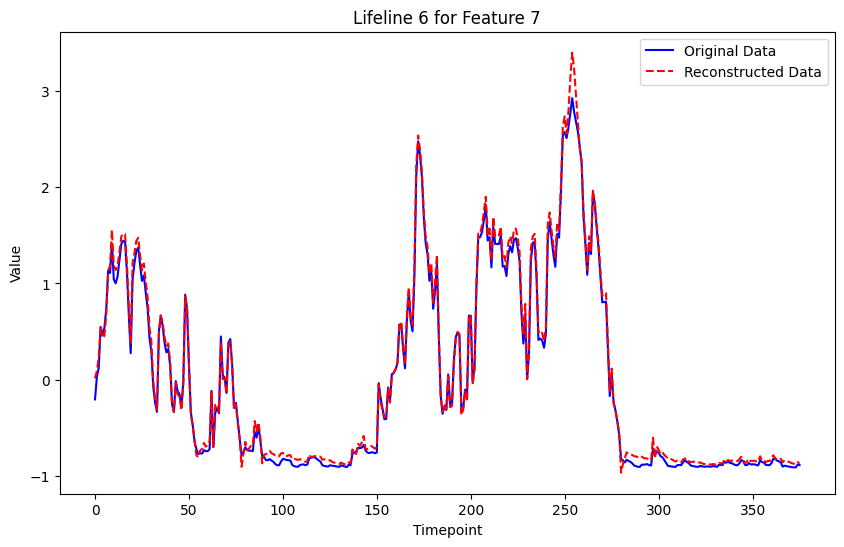

In [23]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, TimeDistributed
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

def build_model_final(input_shape, lstm_units_layer1, lstm_units_layer2, lstm_units_layer3):
    inputs = Input(shape=input_shape)

    # Encoder layers
    encoded = LSTM(lstm_units_layer1, activation='tanh', return_sequences=True)(inputs)
    encoded = LSTM(lstm_units_layer2, activation='tanh', return_sequences=True)(encoded)
    encoded = LSTM(lstm_units_layer3, activation='tanh', return_sequences=True)(encoded)

    # Decoder layers
    decoded = LSTM(lstm_units_layer2, activation='tanh', return_sequences=True)(encoded)
    decoded = LSTM(lstm_units_layer1, activation='tanh', return_sequences=True)(decoded)
    outputs = TimeDistributed(Dense(input_shape[1]))(decoded)
    
    model = Model(inputs, outputs)
    return model

# Assuming normalized_data is correctly loaded as a numpy array
input_shape = (normalized_data.shape[1], normalized_data.shape[2])

# Use the best parameters from Optuna
best_params = {'lstm_units_layer1': 100, 'lstm_units_layer2': 70, 'lstm_units_layer3': 9}

# Building and compiling the model
model = build_model_final(input_shape, **best_params)
model.compile(optimizer=Adam(), loss='mse')

# Assuming you've already split your data into train_data and possibly test_data
model.fit(train_data, train_data, epochs=100, batch_size=32)

# Predict the reconstruction for the dataset
reconstructed = model.predict(train_data)

# Plot for a specific lifeline and feature
lifeline = 5
feature = 6

scaled_series = train_data[lifeline, :, feature]
reconstructed_series = reconstructed[lifeline, :, feature]

plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title(f'Lifeline {lifeline + 1} for Feature {feature + 1}')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


With Dropout

In [32]:
model.save('autoencoder_model_tuned_mar_25.h5')

In [77]:
from tensorflow.keras.models import Model

# Assuming `autoencoder` is your previously built and compiled autoencoder model
autoencoder = load_model('autoencoder_model_tuned_mar_25.h5')

latent_layer_index = 3  # Example index, please replace with the actual index

# Now build the encoder model
encoder_input = autoencoder.input  # This is the input of your autoencoder model
latent_output = autoencoder.layers[latent_layer_index].output  # This is the latent layer output

# Create the encoder model
encoder = Model(inputs=encoder_input, outputs=latent_output)

latent_representations = encoder.predict(train_data)

# And then you can save it to CSV as shown previously
pd.DataFrame(latent_representations.reshape(-1, latent_representations.shape[-1])).to_csv('latent_space.csv', index=False)

print("Encoder model built and latent space representations saved to 'latent_space.csv'.")


4/4 [==============================] - 3s 439ms/step
Encoder model built and latent space representations saved to 'latent_space.csv'.


# Perturbation Analysis Zeroing out Latent Space

1/1 [==============================] - 0s 38ms/step


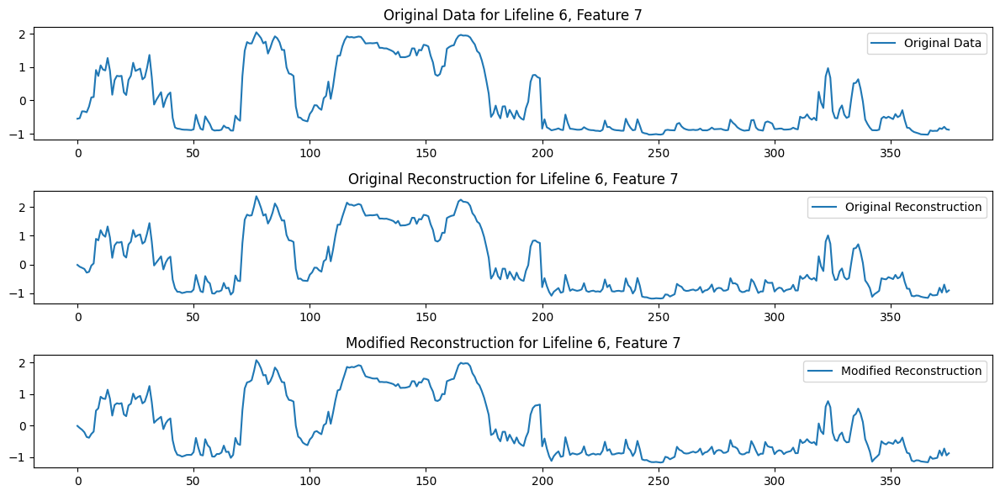

In [43]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input
from tensorflow.keras.initializers import glorot_uniform

# Load the autoencoder model
# autoencoder = load_model('autoencoder_model_100lifelines_378timesteps.h5')
autoencoder = load_model('autoencoder_model_tuned_mar_25.h5')

# Assuming normalized_data is shaped as (101, 376, 48)
# Assuming latent_representations are shaped as (101, 376, 9)

# Create a new input layer for the decoder model
decoder_input = Input(shape=(376, 9))  # This should match the shape of the encoder's output

# Rebuild the decoder assuming the last 3 layers are the decoder layers
x = decoder_input
for layer in autoencoder.layers[-3:]:  # Modify the range according to your decoder architecture
    x = layer(x)
decoder = Model(inputs=decoder_input, outputs=x)

# Select a specific lifeline to analyze
lifeline_index = 5  # Index for lifeline 6
feature_index = 6  # Index for feature 7

latent_space_model = Model(inputs=autoencoder.input, outputs=autoencoder.get_layer('lstm_57').output)
latent_space = latent_space_model.predict(normalized_data)

# Original latent space for the selected lifeline
original_latent_sample = latent_space[lifeline_index]

# Predict the reconstruction for the original latent space
original_reconstruction = decoder.predict(np.expand_dims(original_latent_sample, axis=0))

# Modify the latent representation by zeroing out one neuron across all timesteps
modified_latent_sample = np.copy(original_latent_sample)
modified_latent_sample[:, 0] = 0  # Zero out the specific feature

# Predict the reconstruction for the modified latent space
modified_reconstruction = decoder.predict(np.expand_dims(modified_latent_sample, axis=0))

# Plotting the original data and the reconstructions
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot original data for the selected feature
plt.subplot(3, 1, 1)
plt.plot(normalized_data[lifeline_index, :, feature_index], label='Original Data')
plt.title(f'Original Data for Lifeline {lifeline_index+1}, Feature {feature_index+1}')
plt.legend()

# Plot reconstruction from original latent space for the selected feature
plt.subplot(3, 1, 2)
plt.plot(original_reconstruction[0, :, feature_index], label='Original Reconstruction')
plt.title(f'Original Reconstruction for Lifeline {lifeline_index+1}, Feature {feature_index+1}')
plt.legend()

# Plot reconstruction from modified latent space for the selected feature
plt.subplot(3, 1, 3)
plt.plot(modified_reconstruction[0, :, feature_index], label='Modified Reconstruction')
plt.title(f'Modified Reconstruction for Lifeline {lifeline_index+1}, Feature {feature_index+1}')
plt.legend()

plt.tight_layout()
plt.show()


1/1 [==============================] - 0s 51ms/step


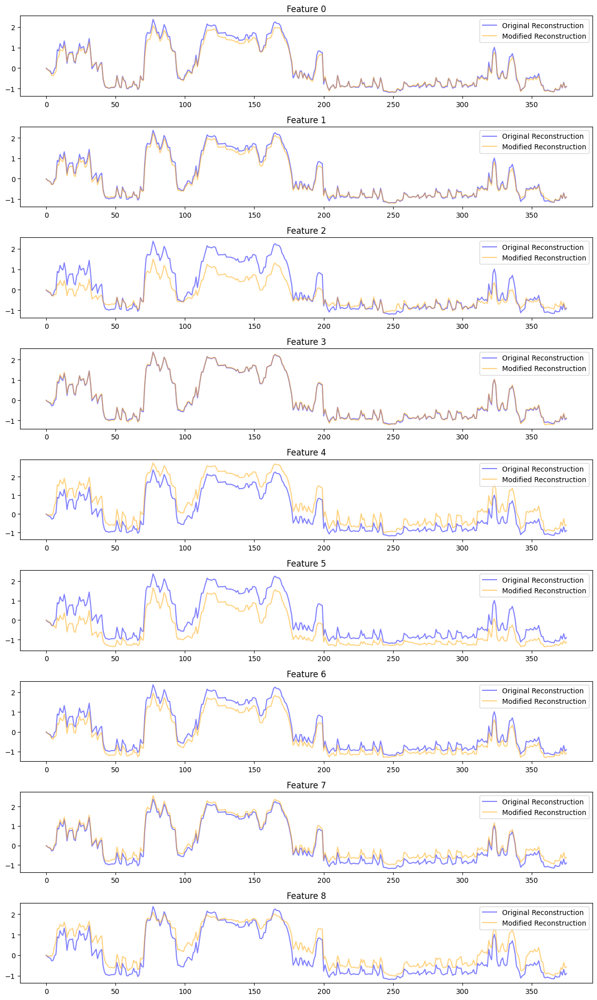

In [47]:

# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input

# Load the autoencoder model
autoencoder = load_model('autoencoder_model_tuned_mar_25.h5')

# Create a new input layer for the decoder model
decoder_input = Input(shape=(376, 9))  # This should match the shape of the encoder's output

# Rebuild the decoder assuming the last 3 layers are the decoder layers
x = decoder_input
for layer in autoencoder.layers[-3:]:  # Modify the range according to your decoder architecture
    x = layer(x)
decoder = Model(decoder_input, x)

# Select a specific lifeline to analyze
lifeline_index = 5  # Index for lifeline 6
feature_index = 6

# Original latent space for the selected lifeline
original_latent_sample = latent_space[lifeline_index]

# Predict the reconstruction for the original latent space
original_reconstruction = decoder.predict(np.expand_dims(original_latent_sample, axis=0))

# Set up the plot
fig, axes = plt.subplots(9, 1, figsize=(12, 20))  # 10 subplots for each feature

# Loop over each feature, zero it out, predict, and plot
for i in range(9):
    # Copy the original latent sample and zero out the current feature across all timesteps
    modified_latent_sample = np.copy(original_latent_sample)
    modified_latent_sample[:, i] = 0

    # Predict the reconstruction for the modified latent sample
    modified_reconstruction = decoder.predict(np.expand_dims(modified_latent_sample, axis=0))

    # Plot the original and modified reconstructions
    axes[i].plot(original_reconstruction[0, :, feature_index], label='Original Reconstruction', color='blue', alpha=0.5)
    axes[i].plot(modified_reconstruction[0, :, feature_index], label='Modified Reconstruction', color='orange', alpha=0.5)
    axes[i].set_title(f'Feature {i}')
    axes[i].legend()

plt.tight_layout()
plt.show()


1/1 [==============================] - 0s 136ms/step


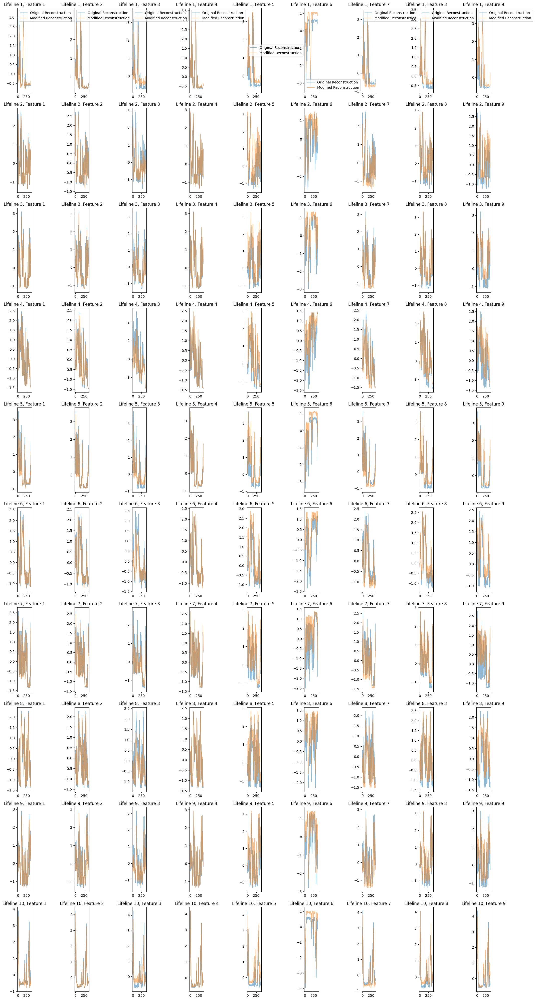

In [50]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input

# Load the autoencoder model
autoencoder = load_model('autoencoder_model_tuned_mar_25.h5')

# Plot the first 10 lifelines for each of the 9 features
num_lifelines = 10  # Number of lifelines to plot
num_features = 9    # Assuming 9 features in the latent space

# Create subplots
fig, axes = plt.subplots(num_lifelines, num_features, figsize=(20, 40))

for lifeline_index in range(num_lifelines):
    for feature_index in range(num_features):
        # Original latent space for the selected lifeline
        original_latent_sample = latent_space[lifeline_index]

        # Predict the reconstruction for the original latent space
        original_reconstruction = decoder.predict(np.expand_dims(original_latent_sample, axis=0))

        # Modify the latent representation by zeroing out one neuron
        modified_latent_sample = np.copy(original_latent_sample)
        modified_latent_sample[:, feature_index] = 0  # Zero out the specific feature

        # Predict the reconstruction for the modified latent space
        modified_reconstruction = decoder.predict(np.expand_dims(modified_latent_sample, axis=0))

        # Plot the original and modified reconstructions for the current feature of the current lifeline
        ax = axes[lifeline_index][feature_index]
        ax.plot(original_reconstruction[0, :, feature_index], label='Original Reconstruction', alpha=0.5)
        ax.plot(modified_reconstruction[0, :, feature_index], label='Modified Reconstruction', alpha=0.5)
        ax.set_title(f'Lifeline {lifeline_index+1}, Feature {feature_index+1}')
        if lifeline_index == 0:
            ax.legend()

plt.tight_layout()
plt.show()


In [51]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input
import os

# Load the autoencoder model
autoencoder = load_model('autoencoder_model_tuned_mar_25.h5')

# Assuming the decoder is correctly rebuilt as per your existing code

# Assuming latent_space is available with the shape [101, 376, 9]

# For illustration, let's plot and save the first 10 lifelines for each of the 9 features
num_lifelines = 101  # Number of lifelines to plot
num_features = 9    # Assuming 9 features in the latent space

# Create the directory for saving figures if it does not exist
save_dir = "latent space perturbation"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for lifeline_index in range(num_lifelines):
    fig, axes = plt.subplots(1, num_features, figsize=(20, 4))  # One row per lifeline, 9 features

    for feature_index in range(num_features):
        # Original latent space for the selected lifeline
        original_latent_sample = latent_space[lifeline_index]

        # Predict the reconstruction for the original latent space
        original_reconstruction = decoder.predict(np.expand_dims(original_latent_sample, axis=0))

        # Modify the latent representation by zeroing out one neuron
        modified_latent_sample = np.copy(original_latent_sample)
        modified_latent_sample[:, feature_index] = 0  # Zero out the specific feature

        # Predict the reconstruction for the modified latent space
        modified_reconstruction = decoder.predict(np.expand_dims(modified_latent_sample, axis=0))

        # Plot the original and modified reconstructions for the current feature of the current lifeline
        ax = axes[feature_index]
        ax.plot(original_reconstruction[0, :, feature_index], label='Original Reconstruction', alpha=0.5)
        ax.plot(modified_reconstruction[0, :, feature_index], label='Modified Reconstruction', alpha=0.5)
        ax.set_title(f'Feature {feature_index+1}')
        if feature_index == 0:
            ax.legend()

    plt.tight_layout()
    # Save the figure
    plt.savefig(f'lifeline_{lifeline_index+1}_reconstructions.png')
    plt.close()  # Close the figure to free up memory


1/1 [==============================] - 0s 143ms/step


In [56]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input

# Assuming you have the model and data ready
autoencoder = load_model('autoencoder_model_tuned_mar_25.h5')
decoder_input = Input(shape=(376, 9))  # Adjust this shape as necessary

# Parameters
num_lifelines = 10
num_features = 48
latent_dimensions = 9
discrepancy_threshold = 0.00  # Example threshold

# Create directory for saving figures
save_dir = "latent_space_perturbation"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

discrepancy_results = []

# Processing each lifeline
for lifeline_index in range(num_lifelines):
    print(f"Processing lifeline {lifeline_index + 1}/{num_lifelines}")

    for feature_index in range(num_features):
        original_data = normalized_data[lifeline_index, :, feature_index]
        original_reconstruction = decoder.predict(np.expand_dims(latent_space[lifeline_index], axis=0))[0, :, feature_index]

        fig, axes = plt.subplots(latent_dimensions, 1, figsize=(12, 20))

        for neuron_index in range(latent_dimensions):
            modified_latent_sample = np.copy(latent_space[lifeline_index])
            modified_latent_sample[:, neuron_index] = 0
            modified_reconstruction = decoder.predict(np.expand_dims(modified_latent_sample, axis=0))[0, :, feature_index]

            discrepancy = np.mean(np.square(original_data - modified_reconstruction))
            
            if discrepancy > discrepancy_threshold:
                discrepancy_results.append({
                    'lifeline_index': lifeline_index,
                    'feature_index': feature_index,
                    'neuron_index': neuron_index,
                    'discrepancy': discrepancy
                })
            
            ax = axes[neuron_index]
            ax.plot(original_data, label='Original Data', alpha=0.5)
            ax.plot(modified_reconstruction, label='Modified Reconstruction', alpha=0.5)
            ax.set_title(f'Neuron {neuron_index + 1} Zeroed Out')
            if neuron_index == 0:
                ax.legend()

        plt.tight_layout()
        plt.savefig(f'{save_dir}/lifeline_{lifeline_index + 1}_feature_{feature_index + 1}.png')
        plt.close(fig)

# Convert results to DataFrame and save
results_df = pd.DataFrame(discrepancy_results)
results_df.to_csv(f'{save_dir}/discrepancy_results.csv', index=False)


Processing lifeline 1/10
1/1 [==============================] - 0s 119ms/step
Processing lifeline 2/10
1/1 [==============================] - 0s 58ms/step
Processing lifeline 3/10
1/1 [==============================] - 0s 76ms/step
Processing lifeline 4/10
1/1 [==============================] - 0s 66ms/step
Processing lifeline 5/10
1/1 [==============================] - 0s 70ms/step
Processing lifeline 6/10
1/1 [==============================] - 0s 69ms/step
Processing lifeline 7/10
1/1 [==============================] - 0s 61ms/step
Processing lifeline 8/10
1/1 [==============================] - 0s 108ms/step
Processing lifeline 9/10
1/1 [==============================] - 0s 136ms/step
Processing lifeline 10/10
1/1 [==============================] - 0s 95ms/step


C:\Users\elysi\AppData\Local\Temp\ipykernel_40880\2585080864.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  significant_discrepancies['feature_index'] += 1
C:\Users\elysi\AppData\Local\Temp\ipykernel_40880\2585080864.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  significant_discrepancies['neuron_index'] += 1


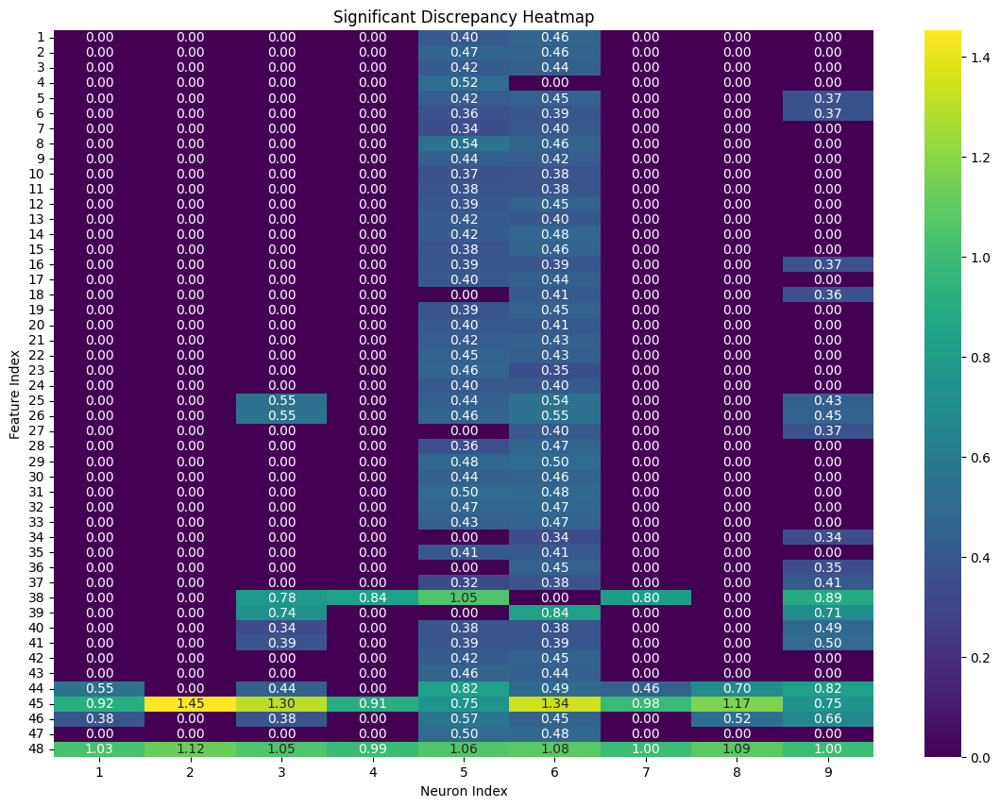

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

discrepancy_data = pd.read_csv('discrepancy_results.csv')

# Calculate a reasonable threshold for each feature based on the distribution of discrepancies
thresholds = discrepancy_data.groupby('feature_index')['discrepancy'].quantile(0.90).reset_index(name='threshold')

# Join thresholds back on the discrepancy data
discrepancy_data = discrepancy_data.merge(thresholds, on='feature_index')

# Filter to only significant discrepancies
significant_discrepancies = discrepancy_data[discrepancy_data['discrepancy'] > discrepancy_data['threshold']]

# Pivot the significant discrepancies for the heatmap
# Adjust the feature_index and neuron_index to start from 1
significant_discrepancies['feature_index'] += 1
significant_discrepancies['neuron_index'] += 1

# Pivot the significant discrepancies for the heatmap
heatmap_data = significant_discrepancies.pivot_table(index='feature_index', 
                                                     columns='neuron_index', 
                                                     values='discrepancy', 
                                                     aggfunc='mean').fillna(0)

# Create the heatmap using seaborn
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="viridis")
plt.title('Significant Discrepancy Heatmap')
plt.xlabel('Neuron Index')
plt.ylabel('Feature Index')
plt.show()


# SHAP Feature Importance

In [56]:
import numpy as np
import pandas as pd
import shap
from tensorflow.keras.models import load_model

# Load latent space data
latent_space_path = 'latent_space.csv'
latent_space = pd.read_csv(latent_space_path).values

# Assuming latent_space is already shaped as (376 x 101, 9)
# Reshape it to (101, 376, 9) to make it (lifelines, timesteps, features)
num_lifelines = 101
timesteps = 376
features = 9
latent_space_reshaped = latent_space.reshape(num_lifelines, timesteps, features)

# Load your autoencoder model (if needed for any purpose)
autoencoder = load_model('autoencoder_model_tuned_mar_25.h5')

100%|██████████| 1/1 [00:00<00:00,  3.73it/s]
c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\shap\plots\_beeswarm.py:612: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  pl.xlim((slow, shigh))
c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\shap\plots\_beeswarm.py:631: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  pl.xlim((slow, shigh))
c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


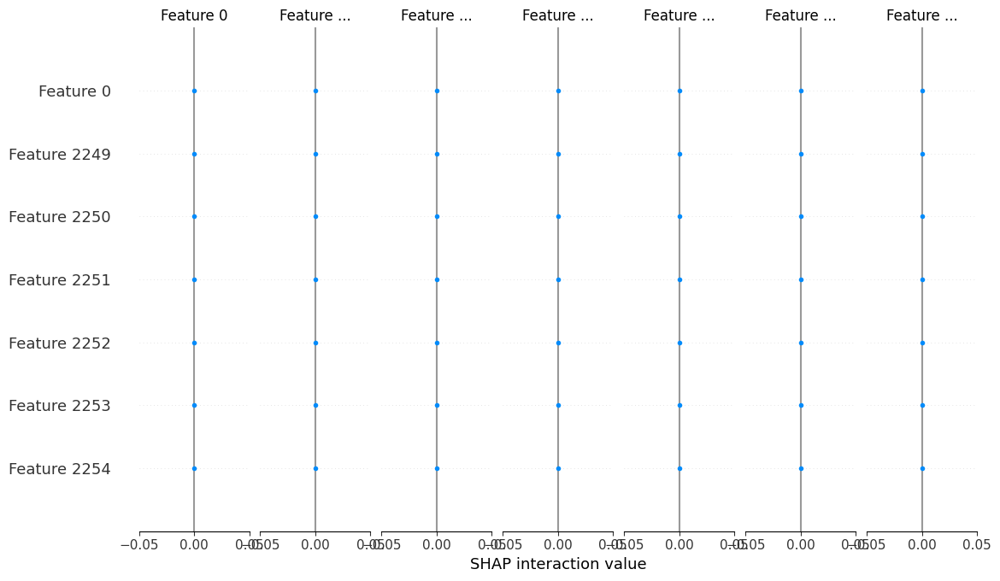

100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


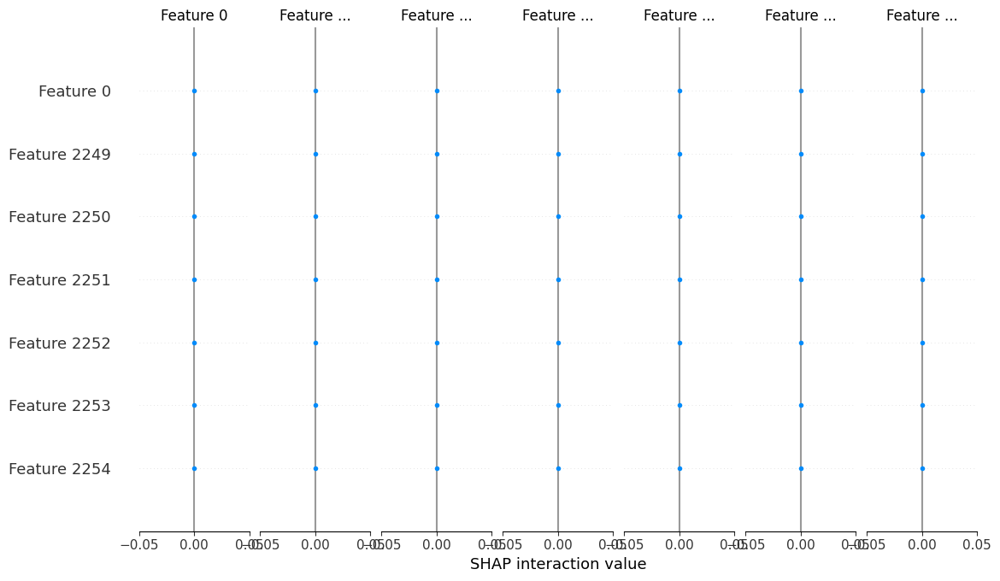

100%|██████████| 1/1 [00:00<00:00,  4.35it/s]


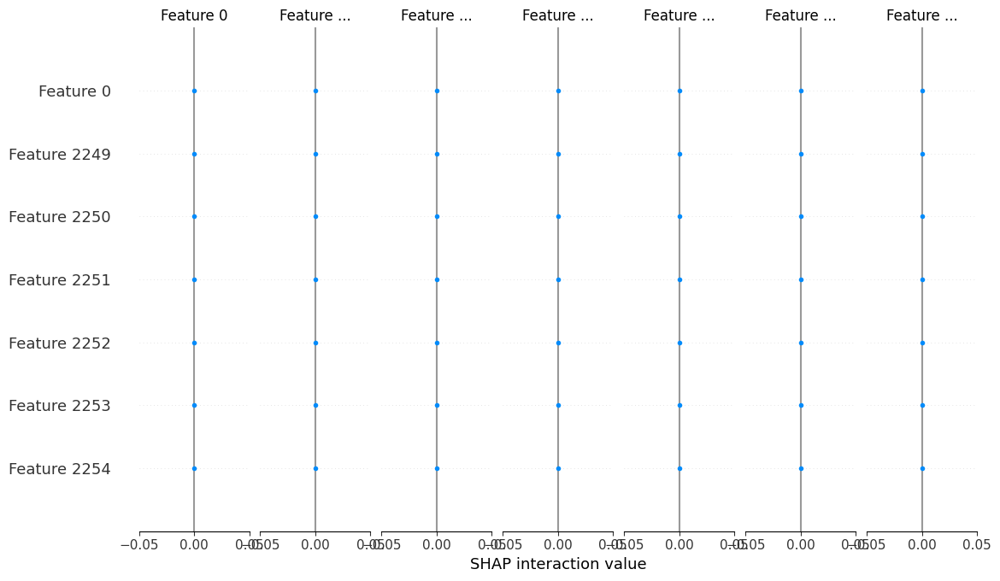

100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


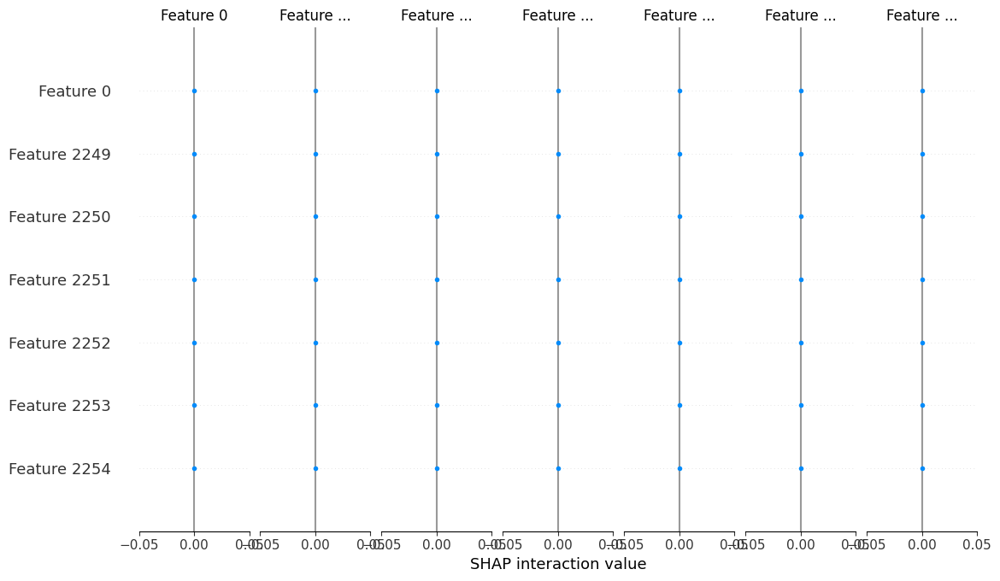

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


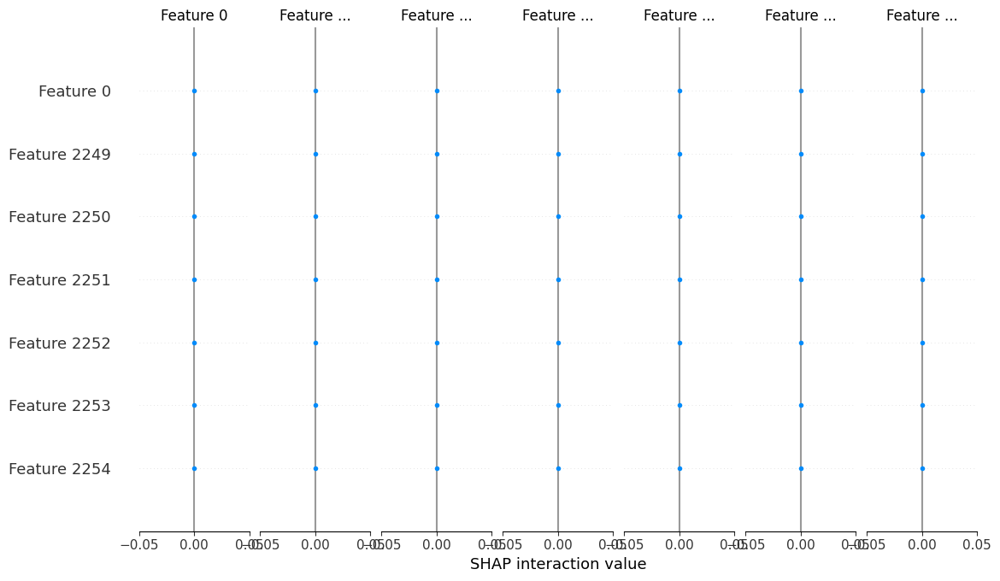

100%|██████████| 1/1 [00:00<00:00,  4.18it/s]


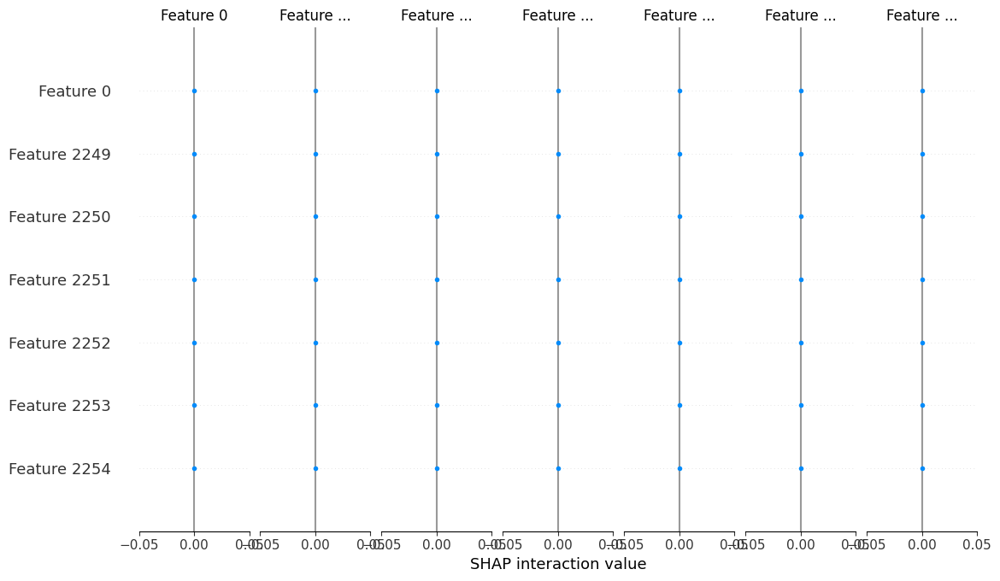

100%|██████████| 1/1 [00:00<00:00,  4.00it/s]


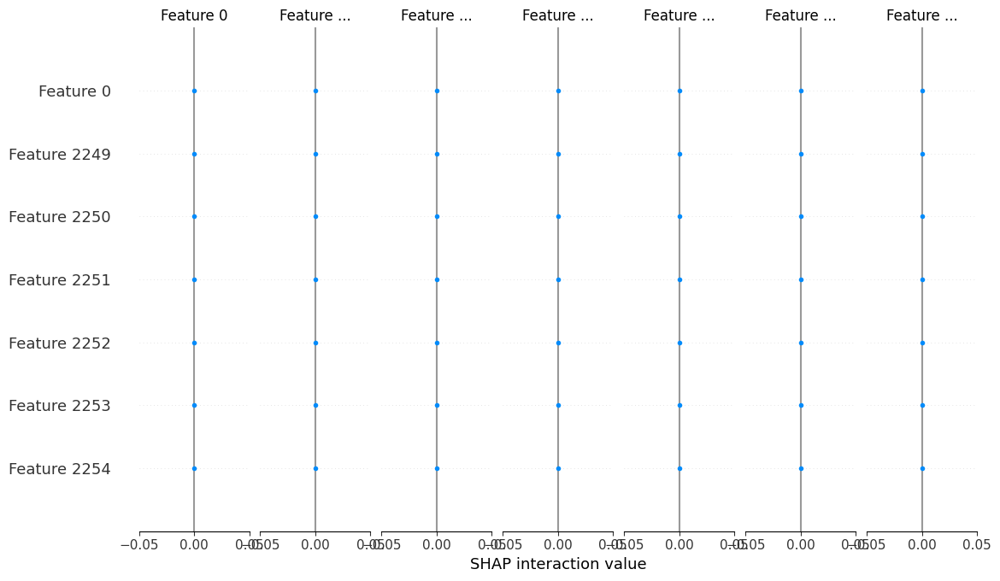

100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


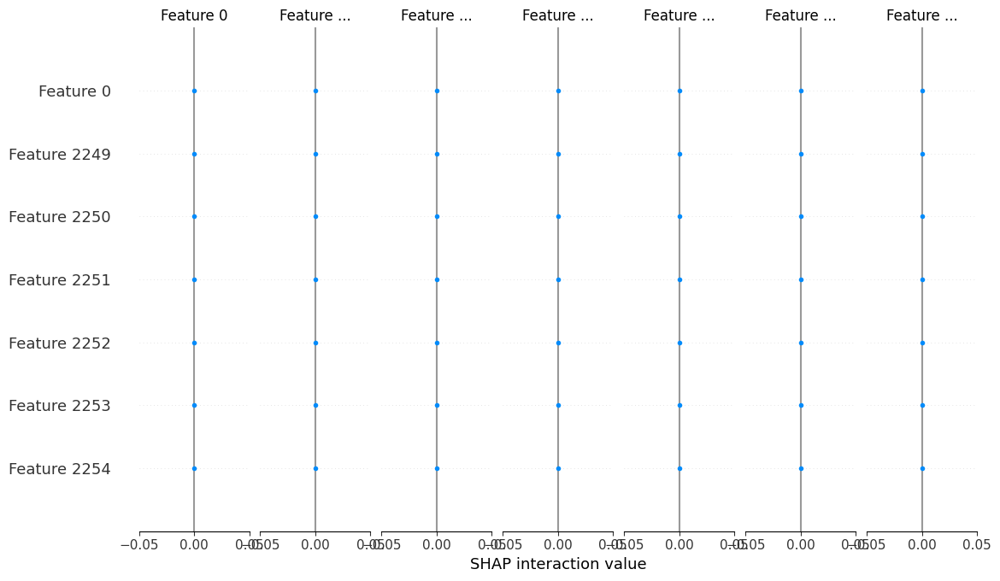

100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


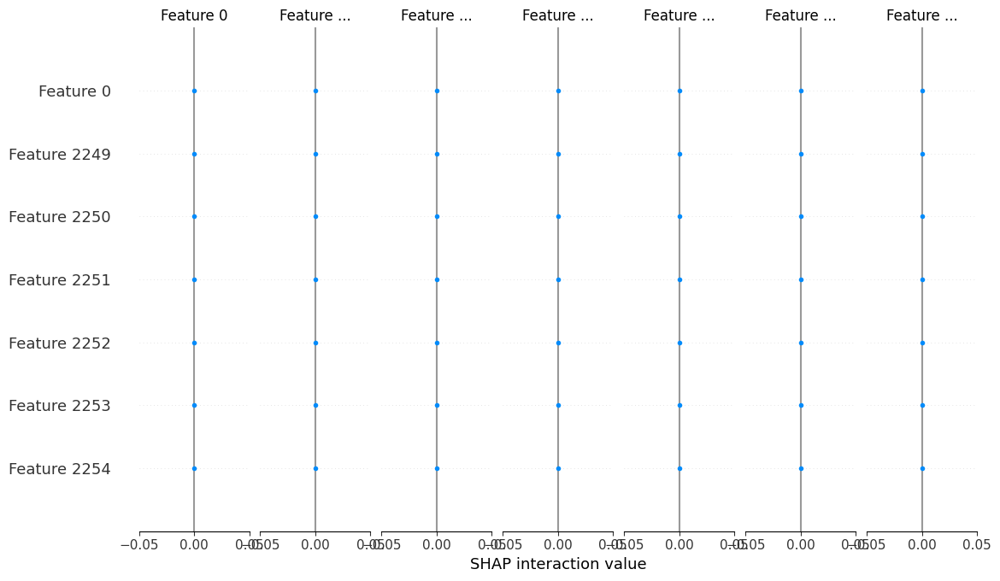

100%|██████████| 1/1 [00:00<00:00,  4.20it/s]


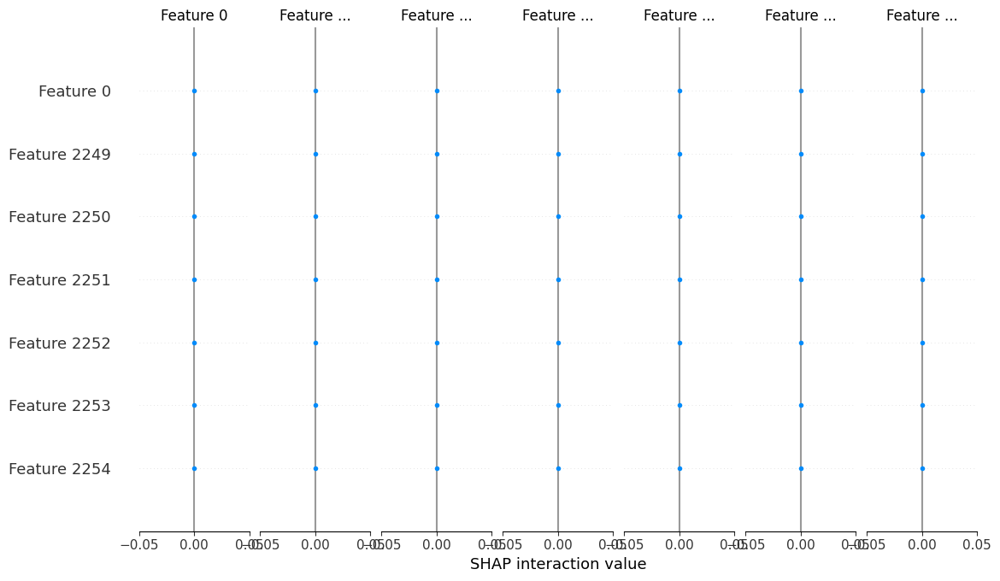

100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


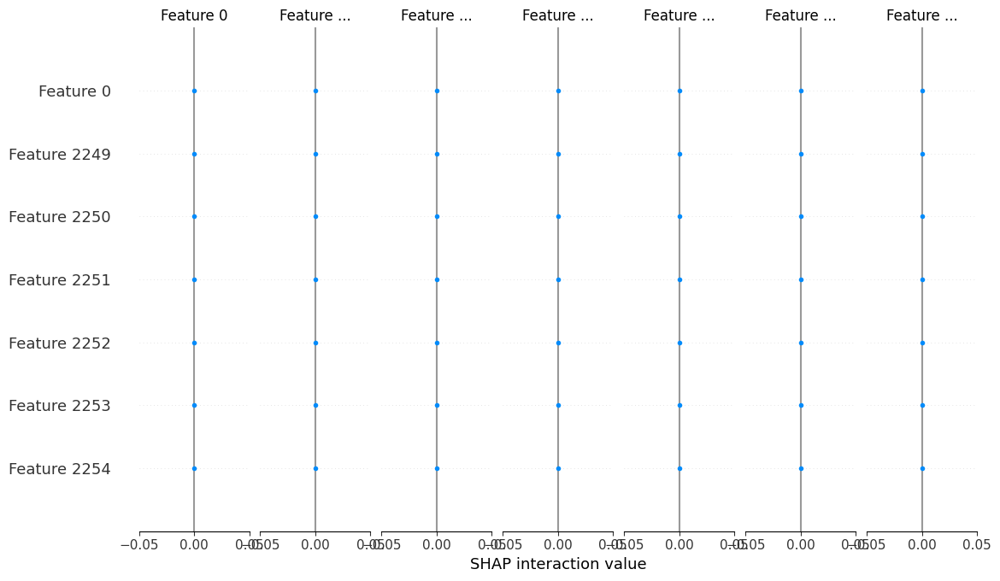

100%|██████████| 1/1 [00:00<00:00,  4.00it/s]


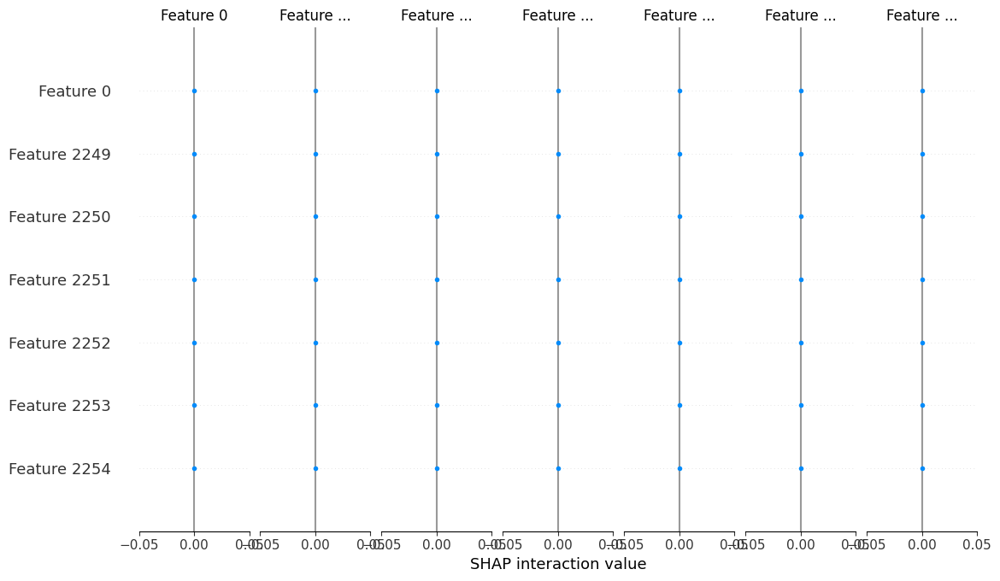

100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


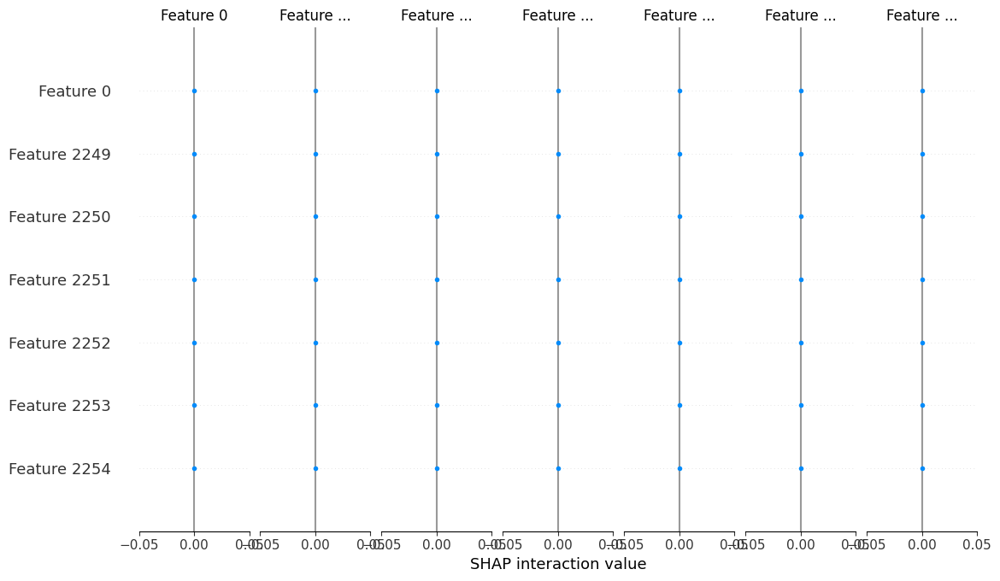

100%|██████████| 1/1 [00:00<00:00,  4.30it/s]


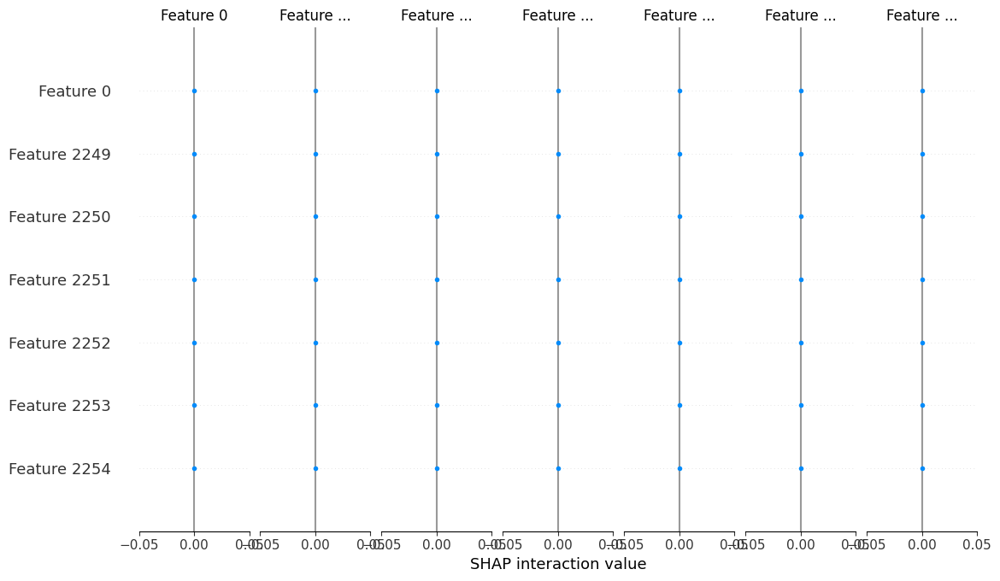

100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


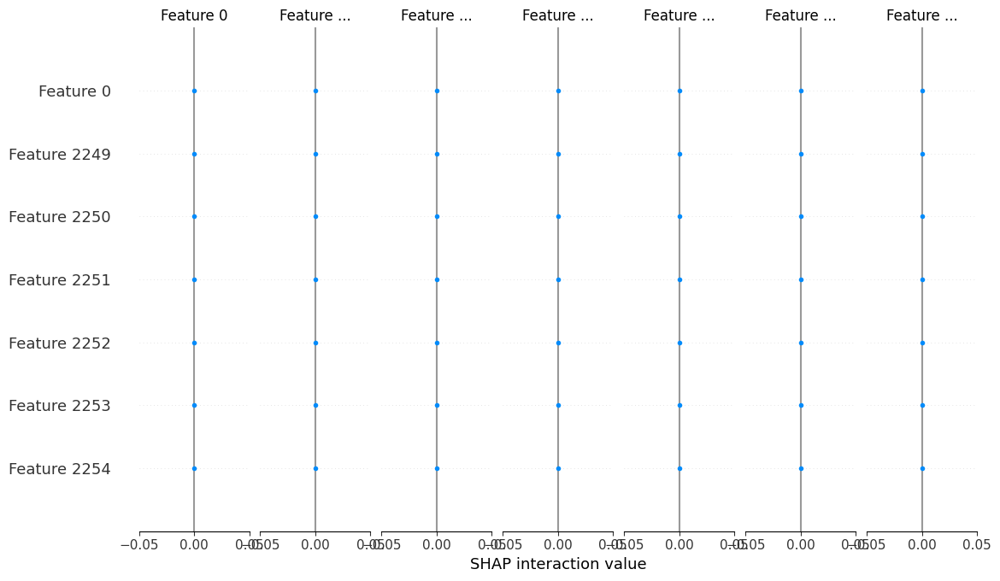

100%|██████████| 1/1 [00:00<00:00,  3.91it/s]


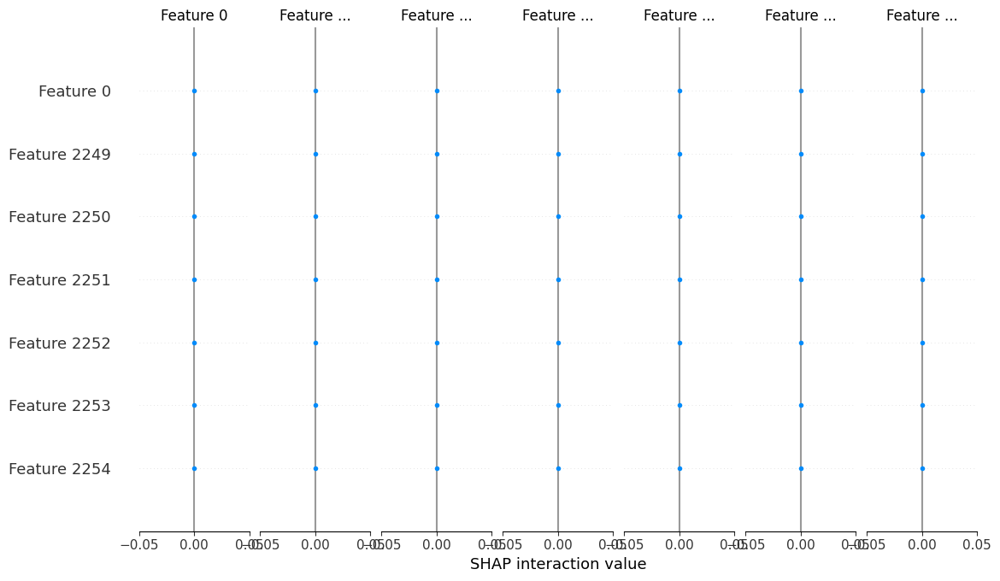

100%|██████████| 1/1 [00:00<00:00,  3.78it/s]


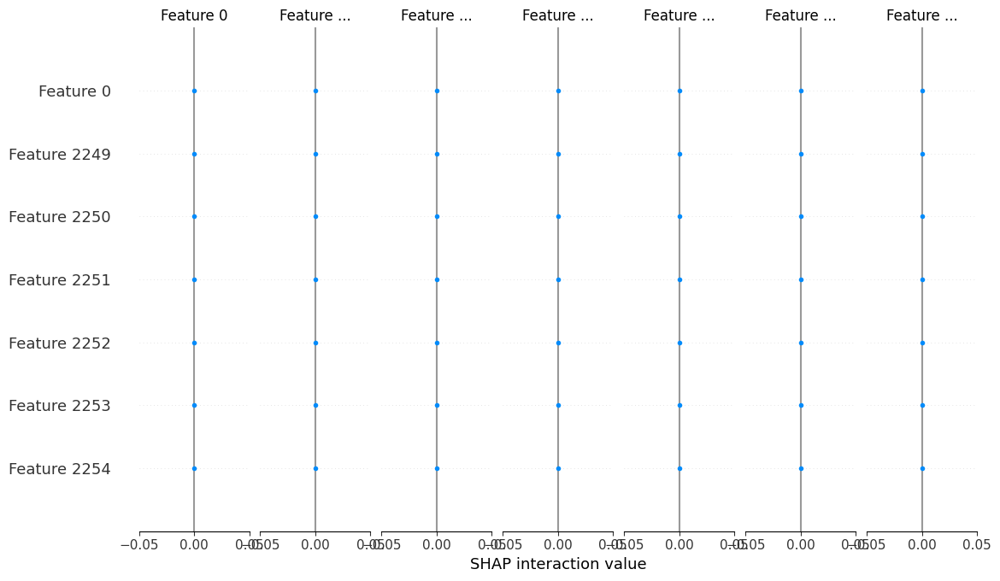

100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


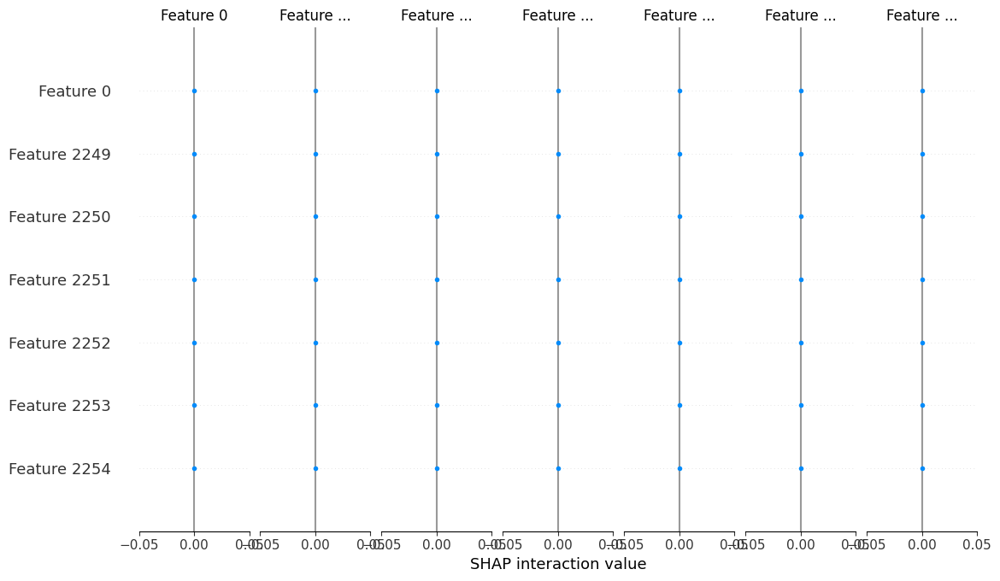

100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


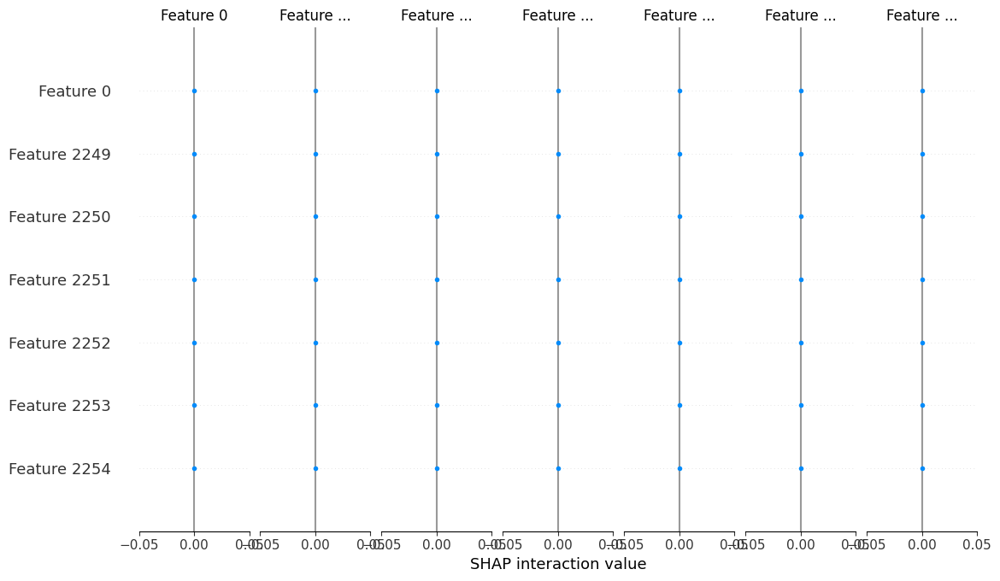

100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


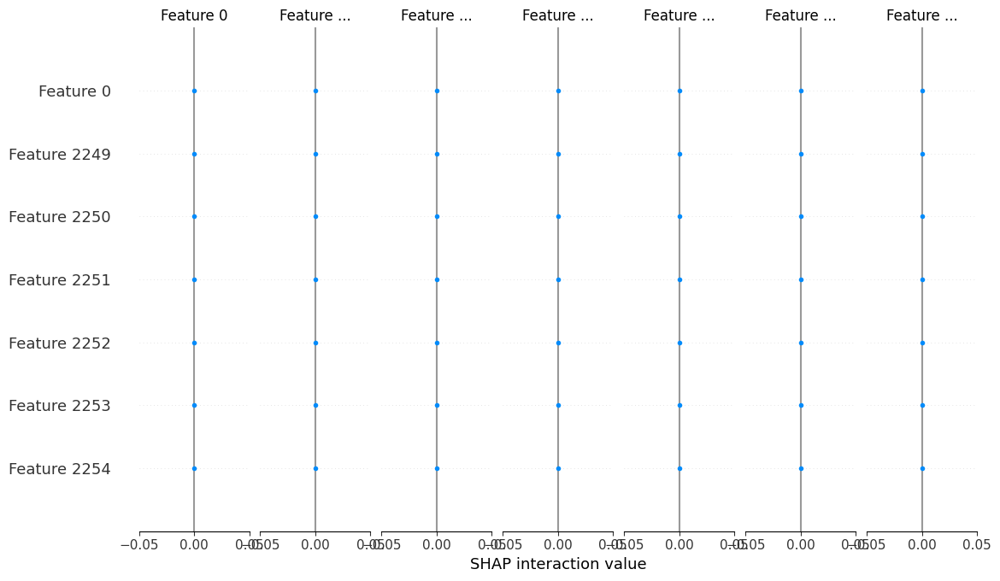

100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


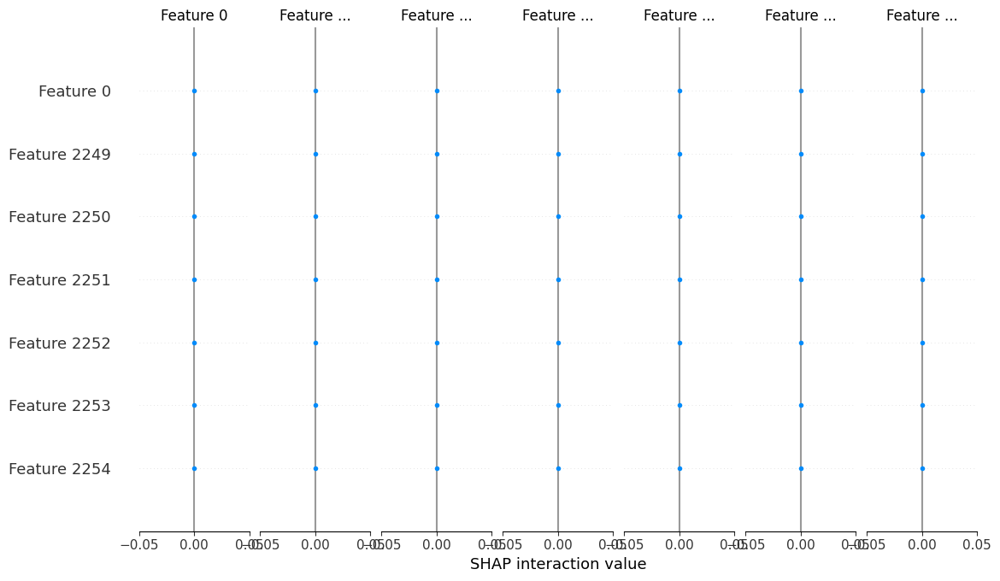

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


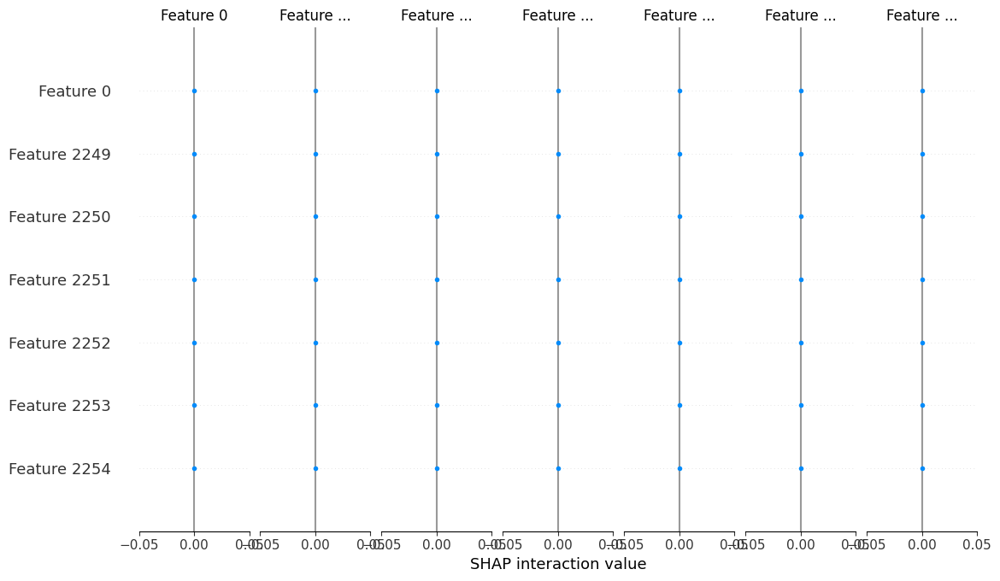

100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


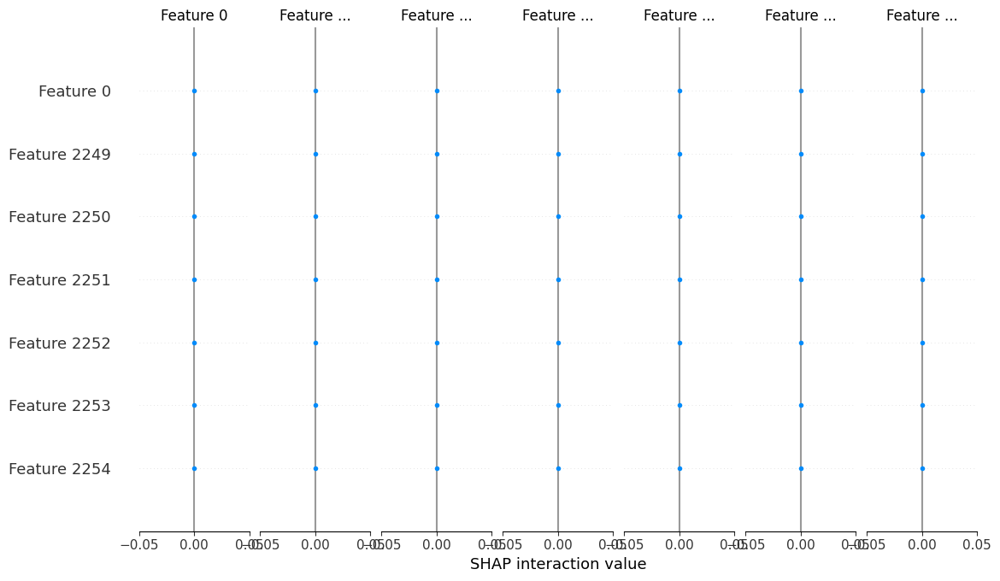

100%|██████████| 1/1 [00:00<00:00,  4.17it/s]


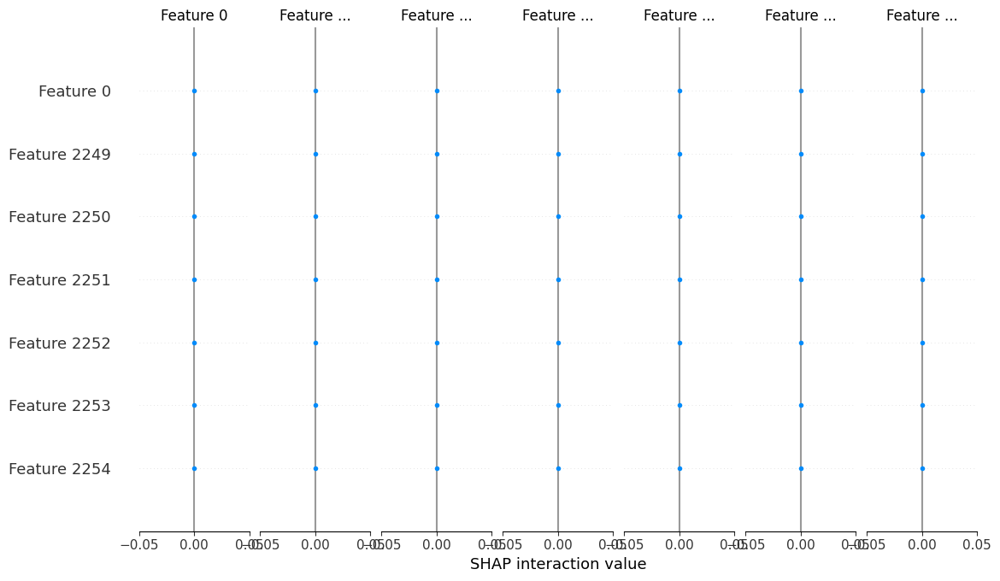

100%|██████████| 1/1 [00:00<00:00,  4.04it/s]


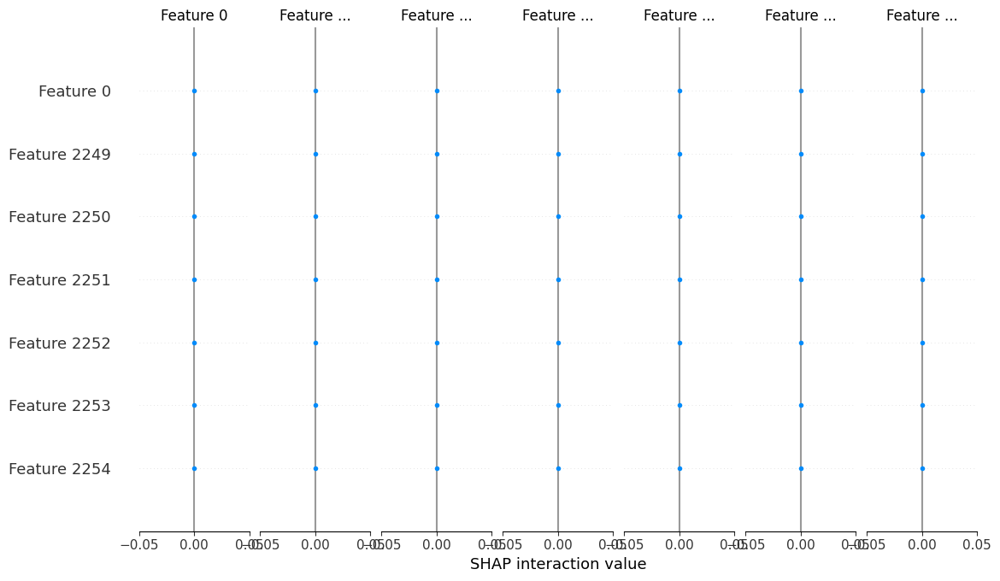

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


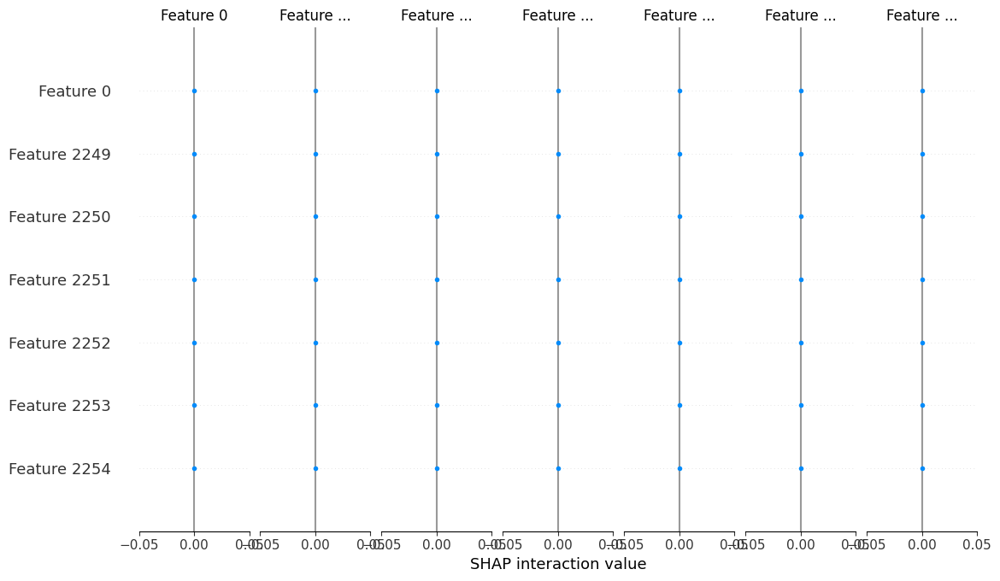

100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


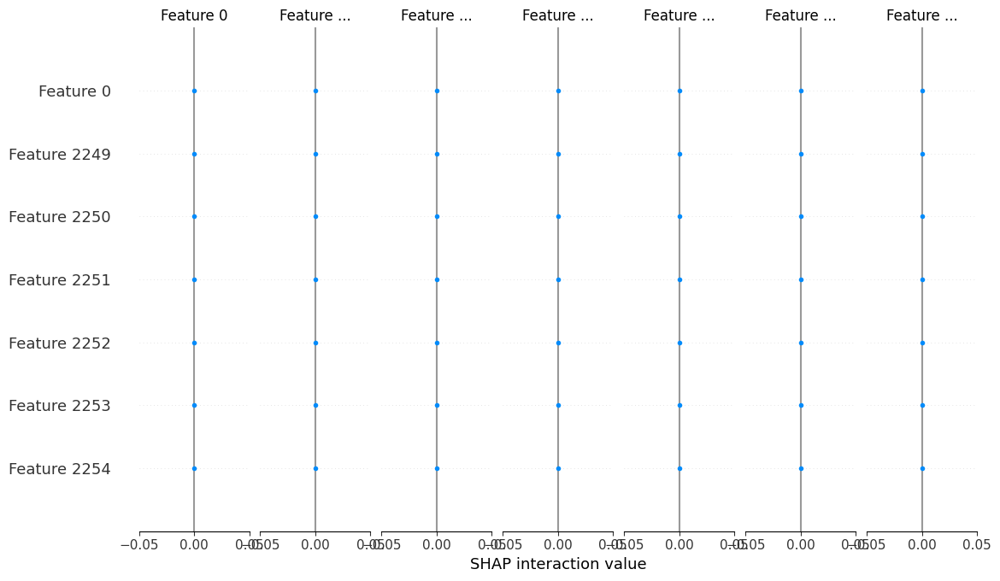

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


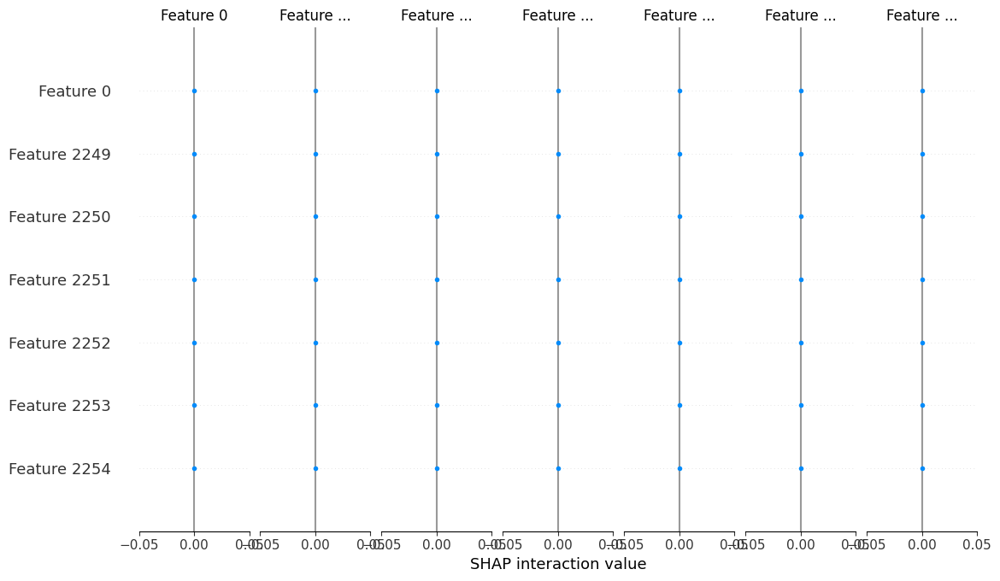

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


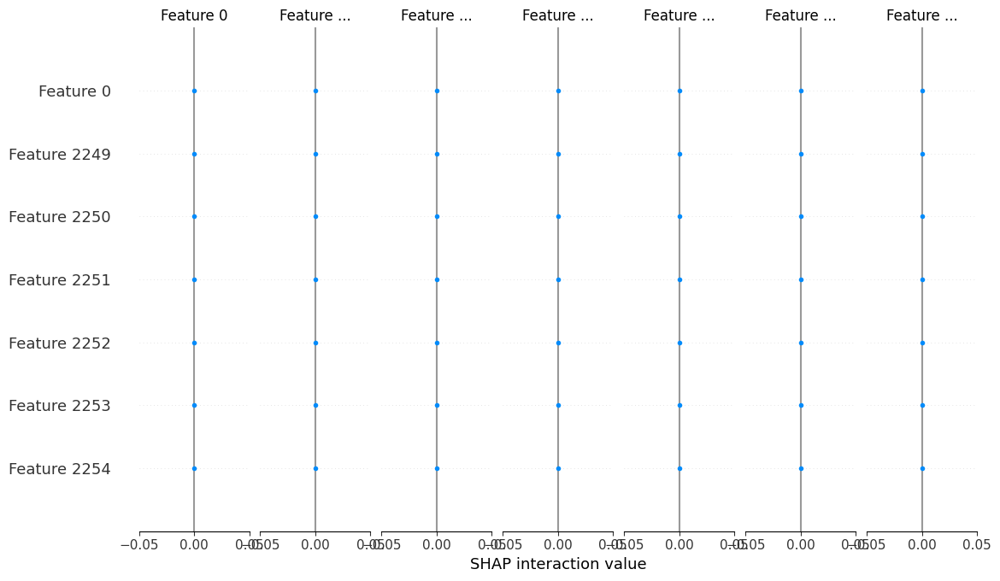

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


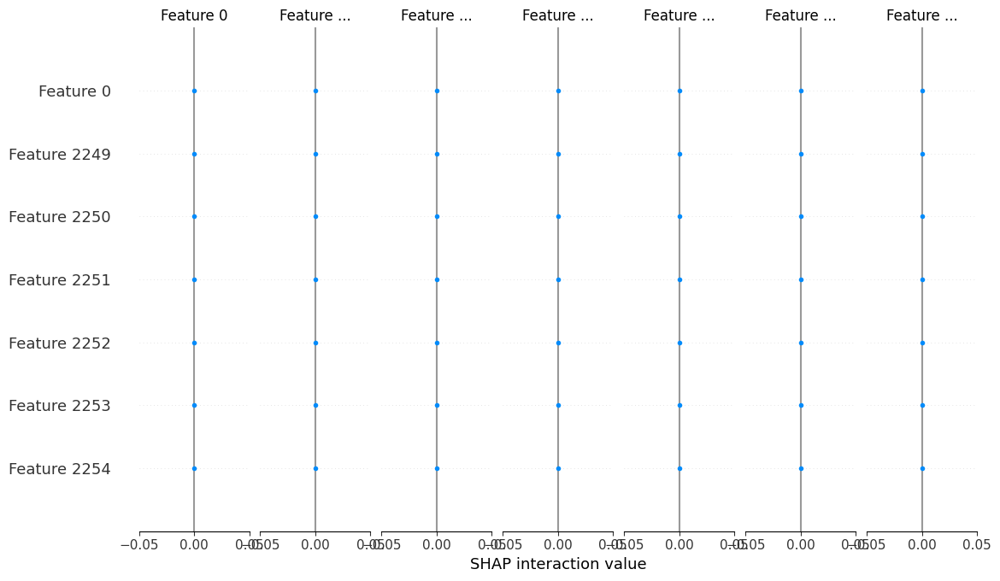

100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


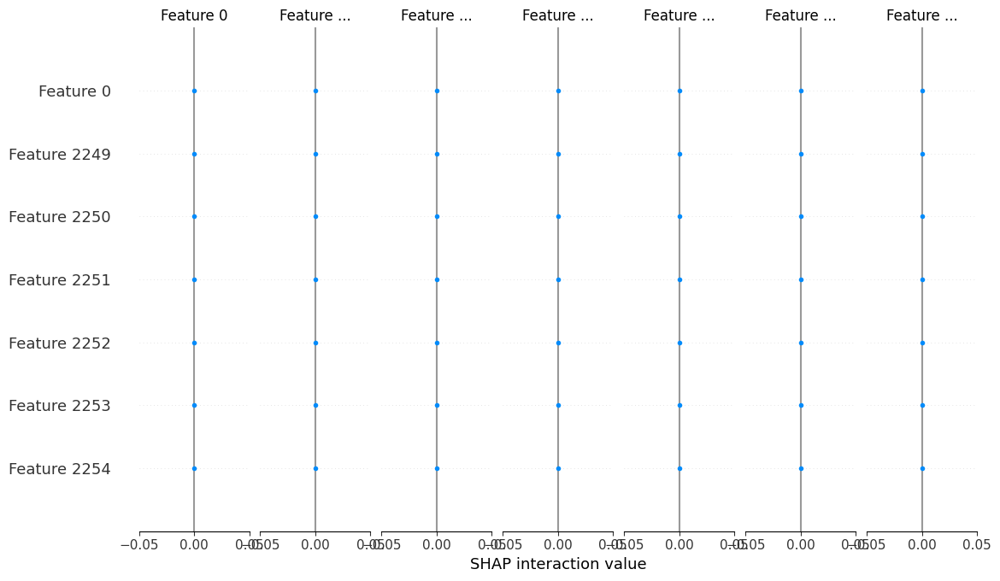

100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


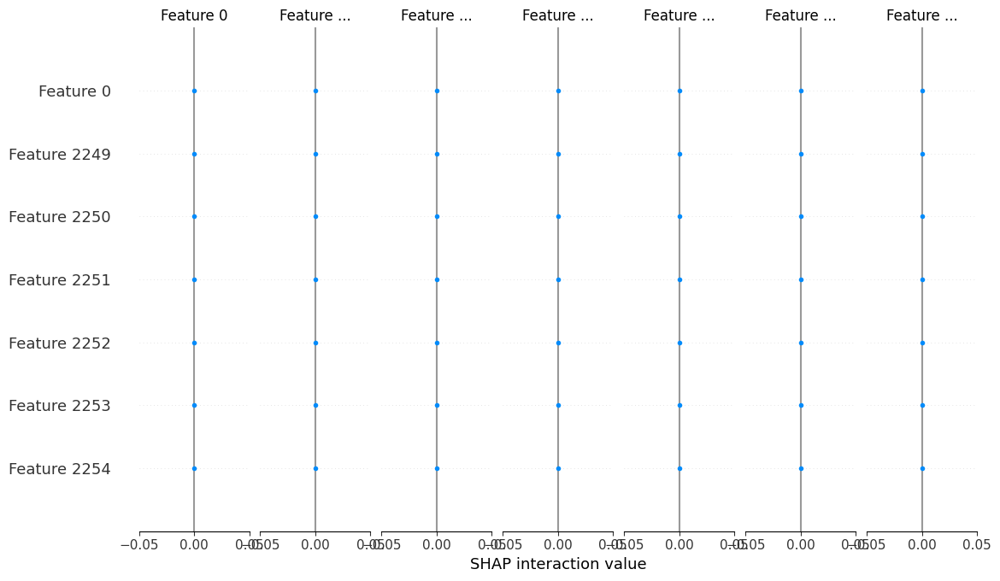

100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


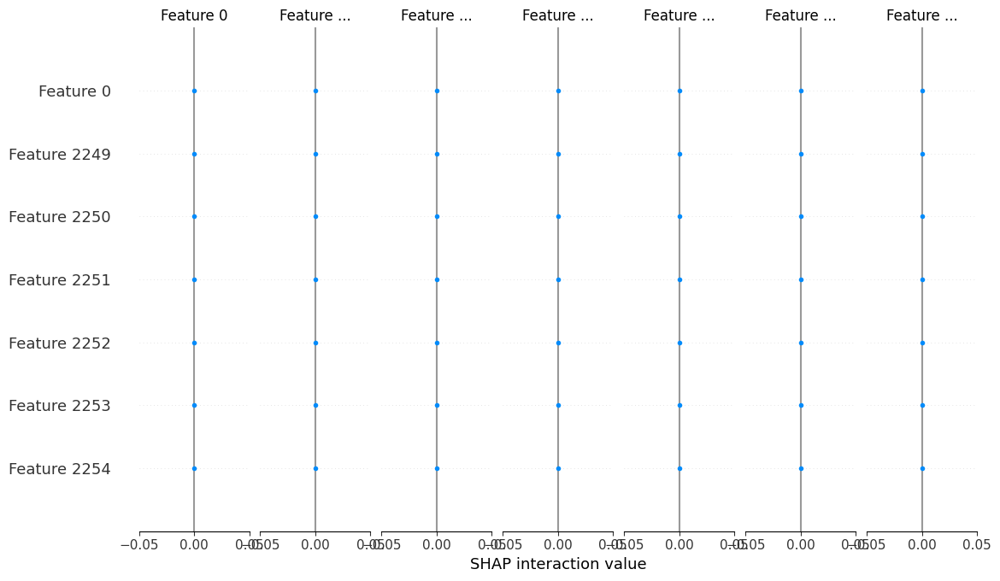

100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


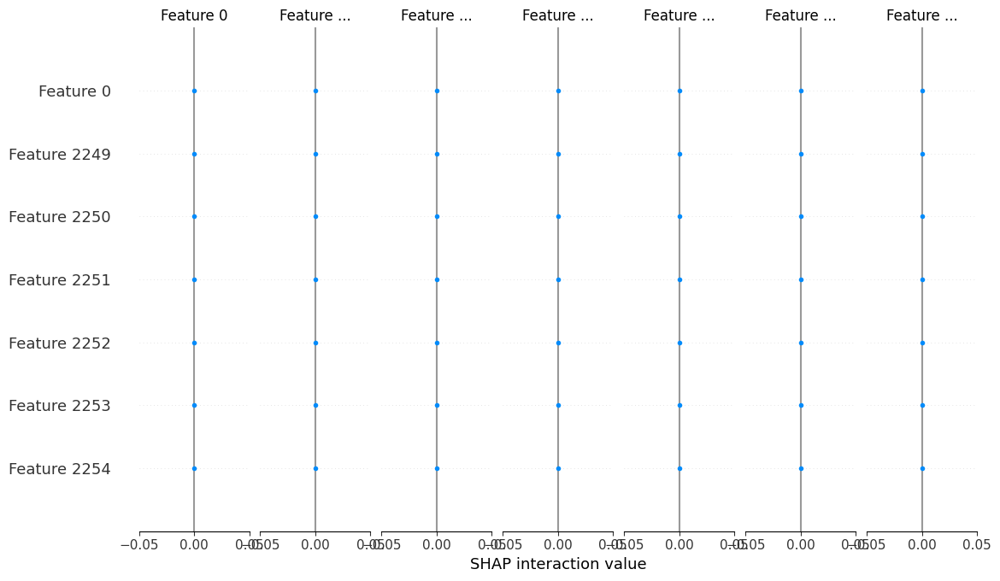

100%|██████████| 1/1 [00:00<00:00,  4.26it/s]


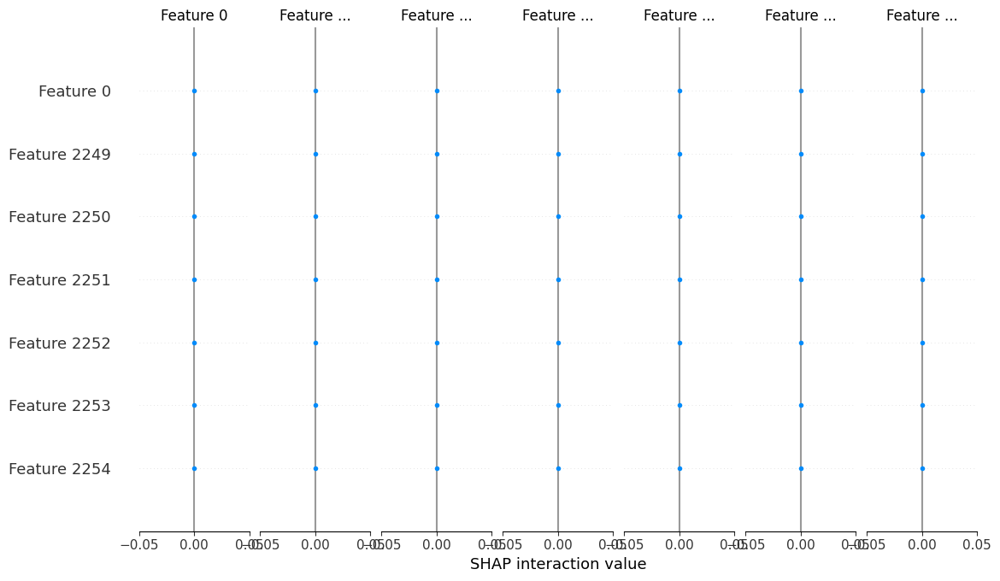

100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


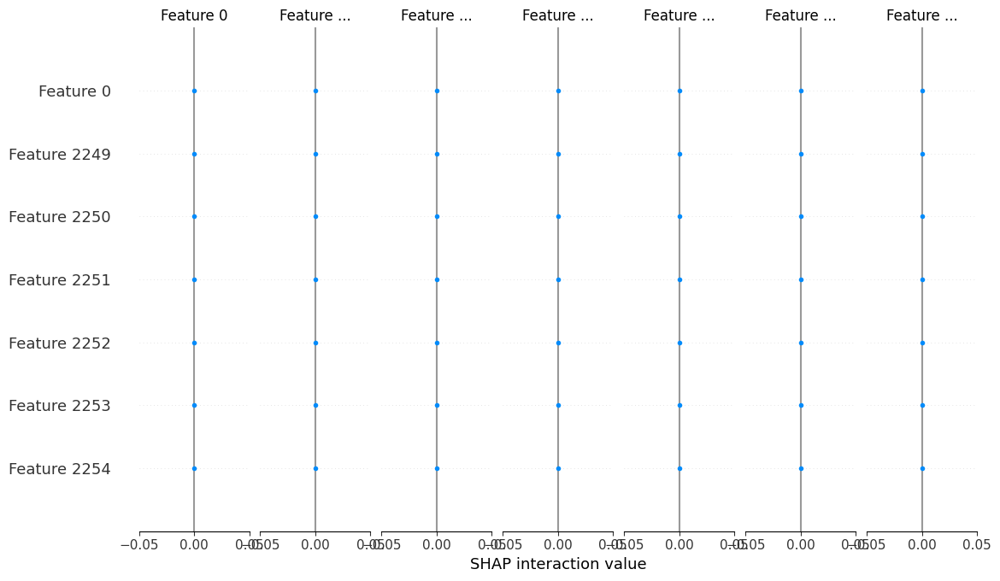

100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


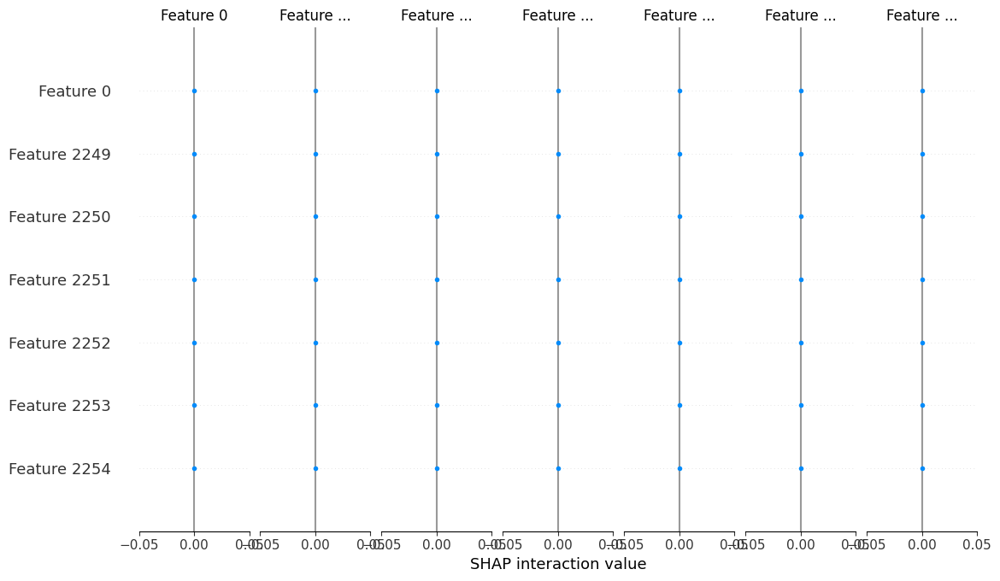

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


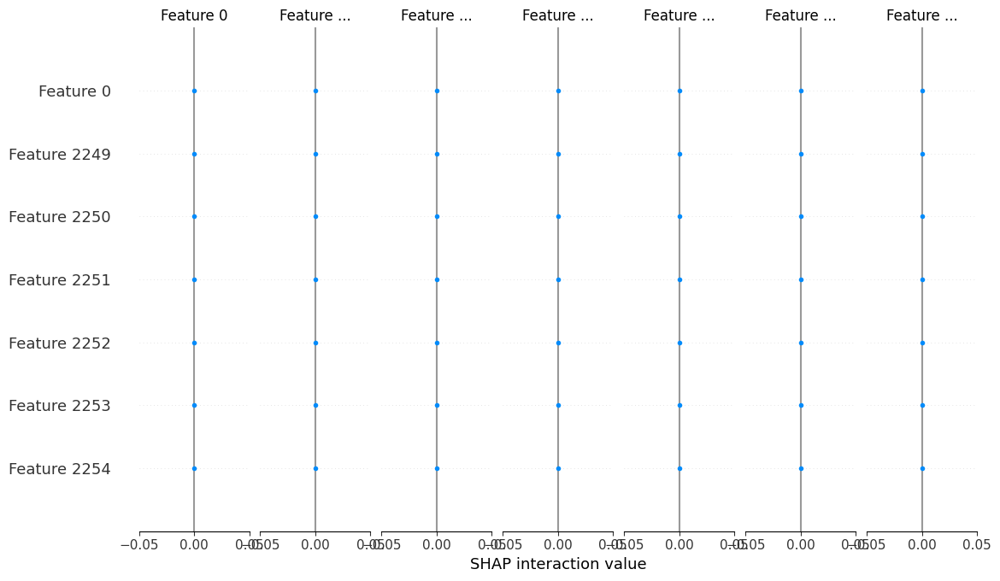

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


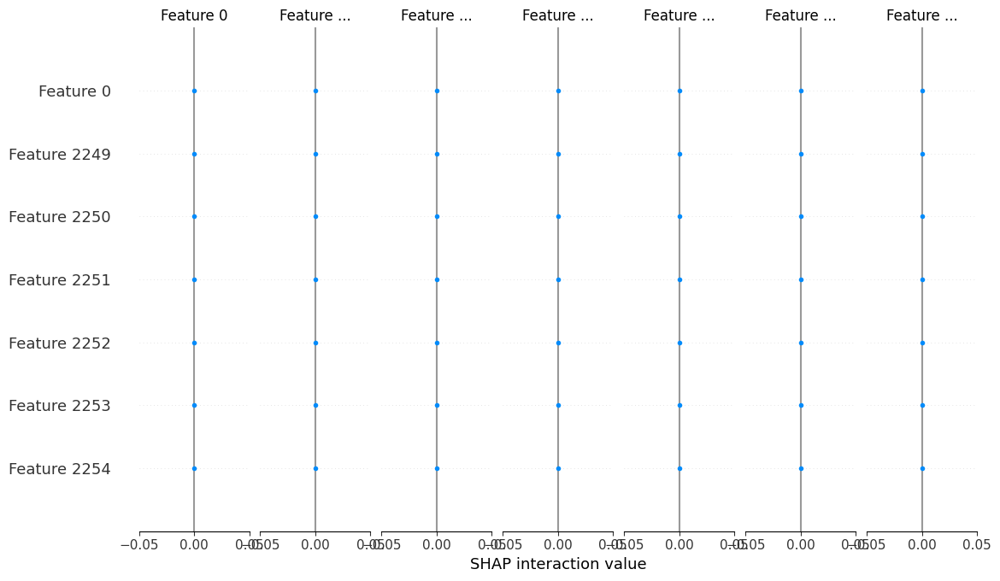

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


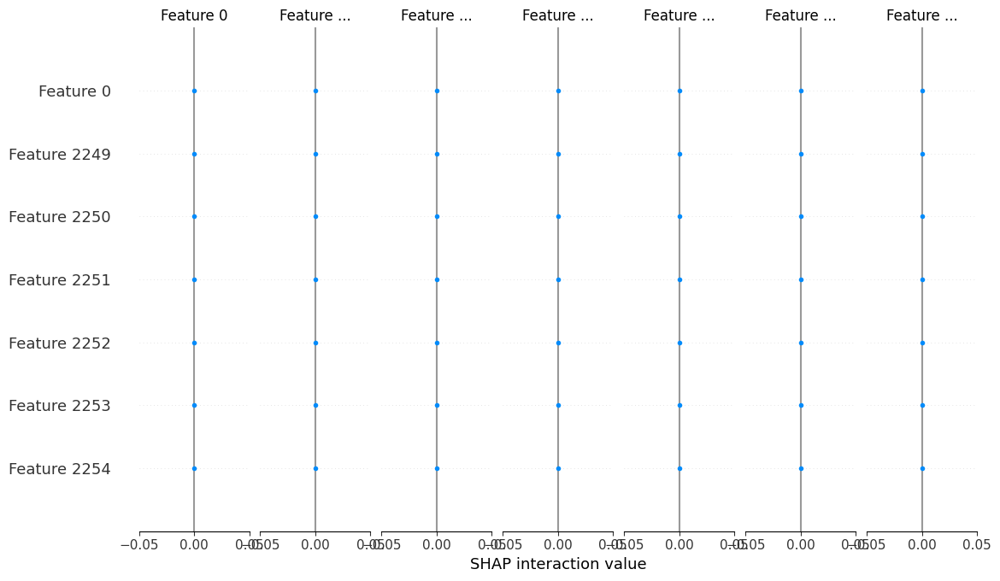

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


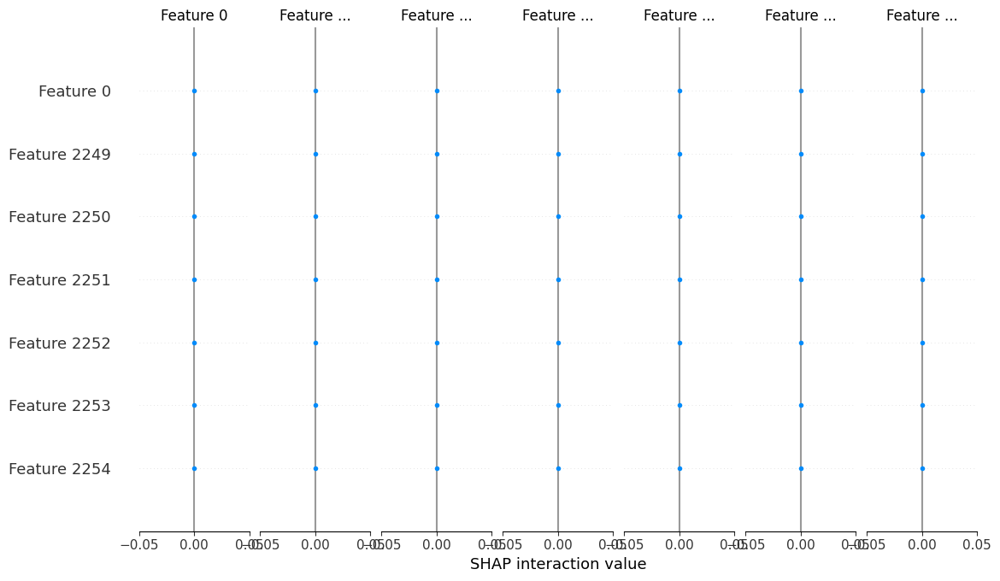

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


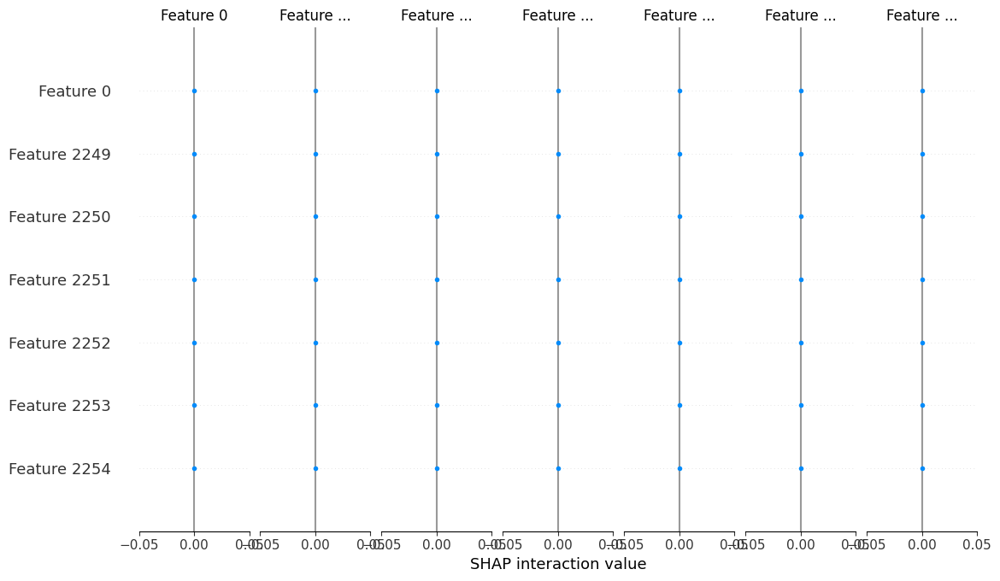

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


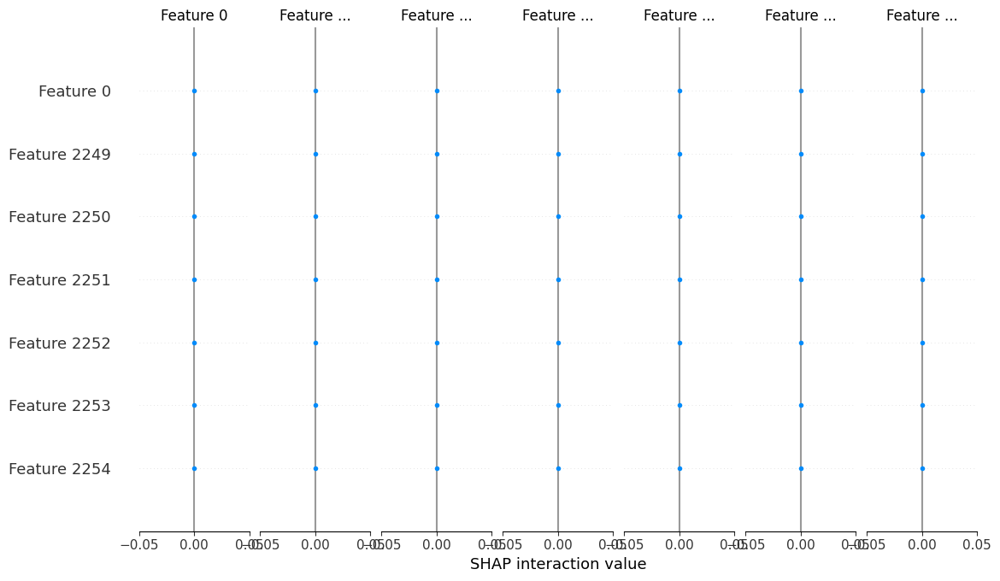

100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


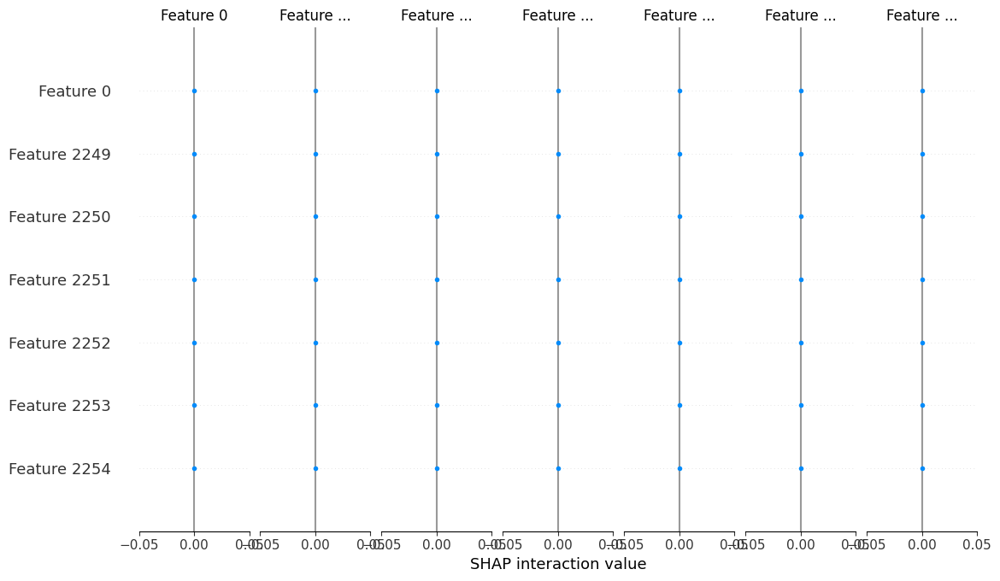

100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


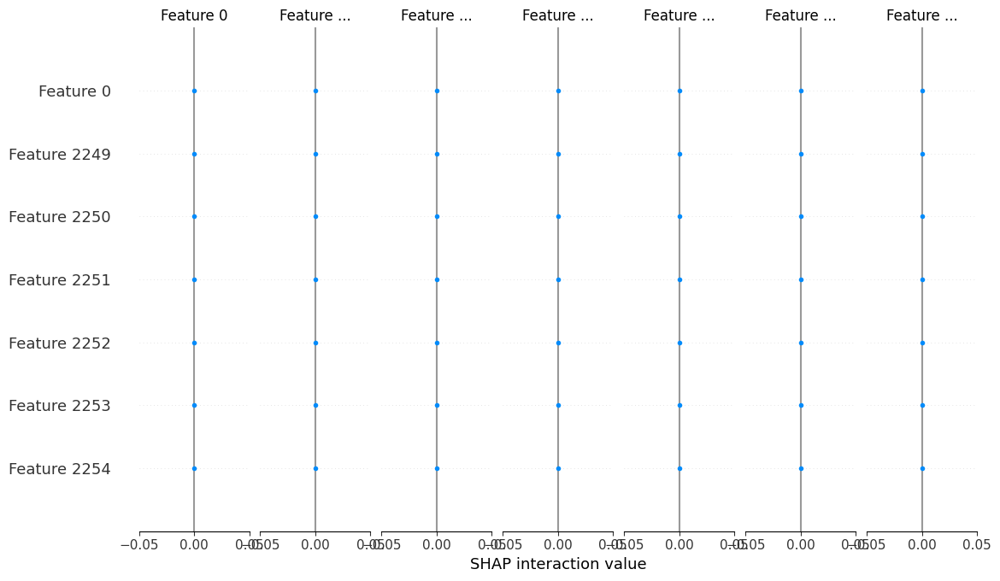

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


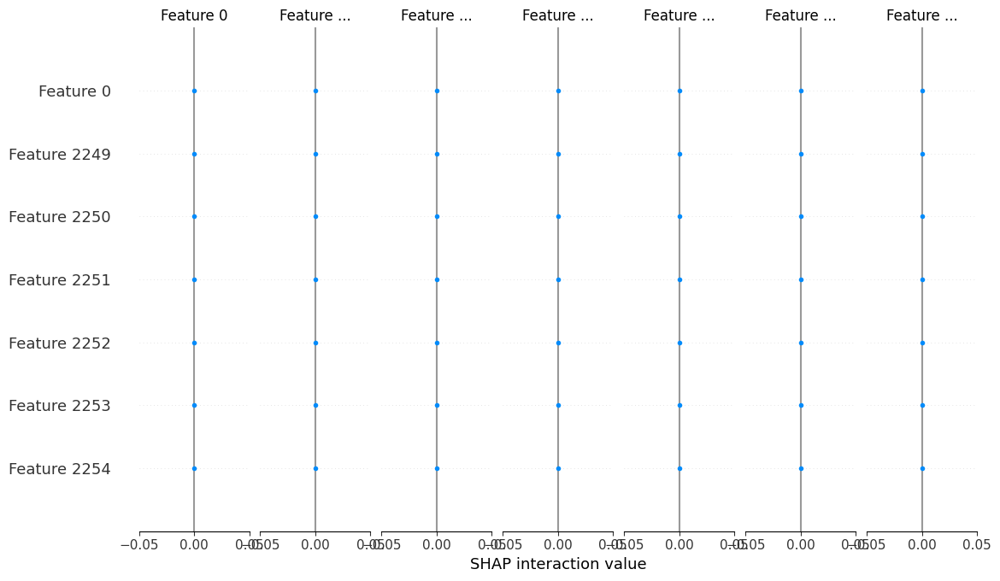

100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


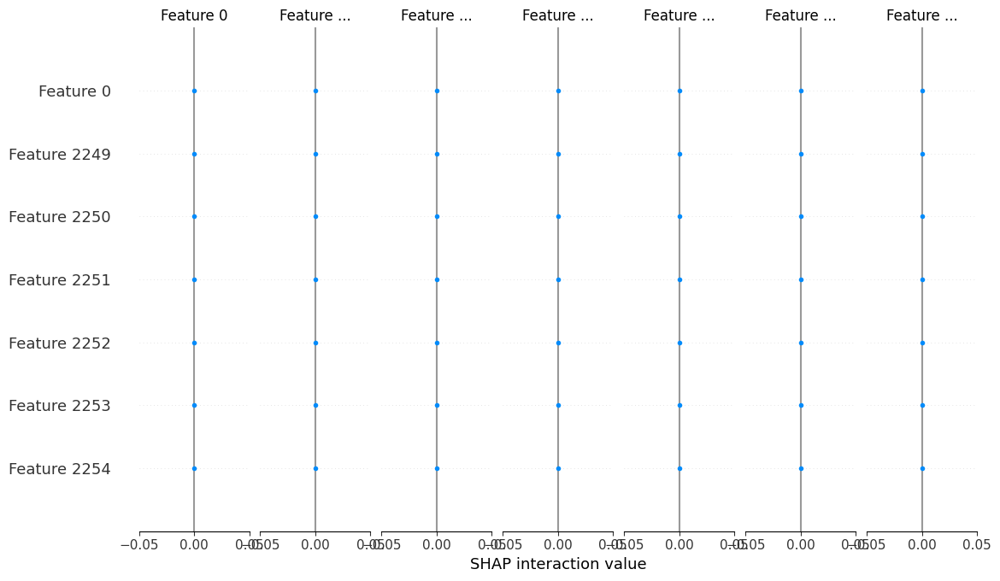

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


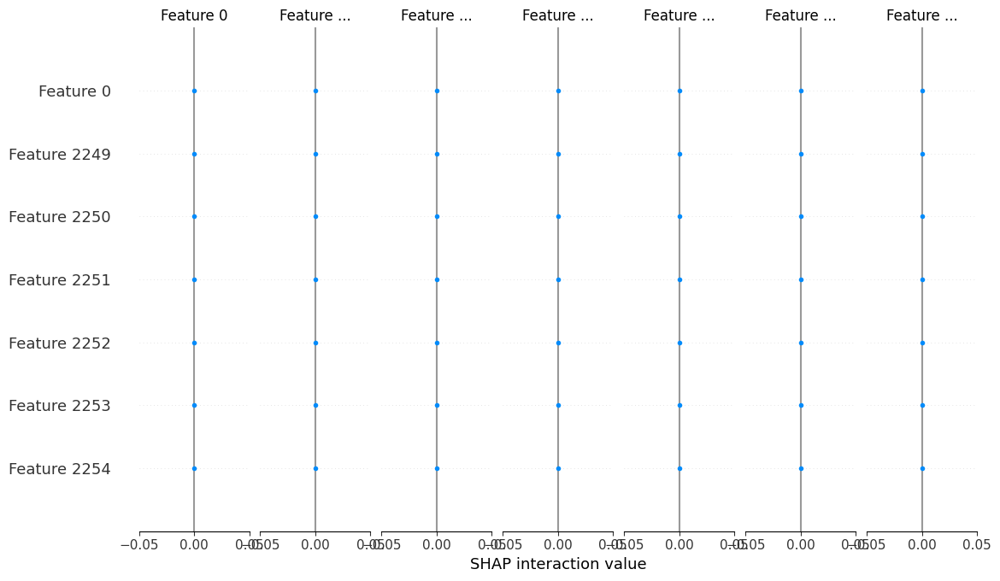

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


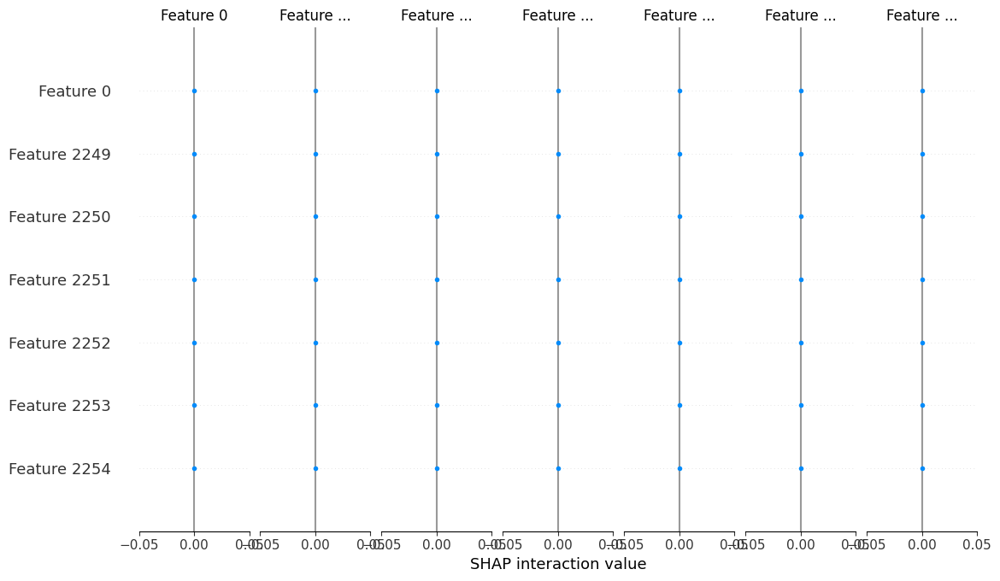

100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


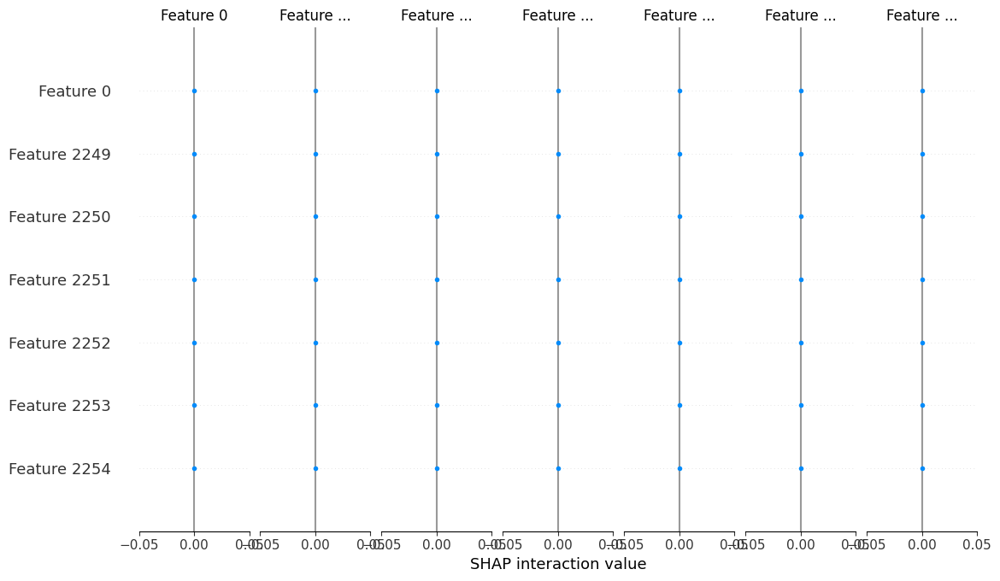

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


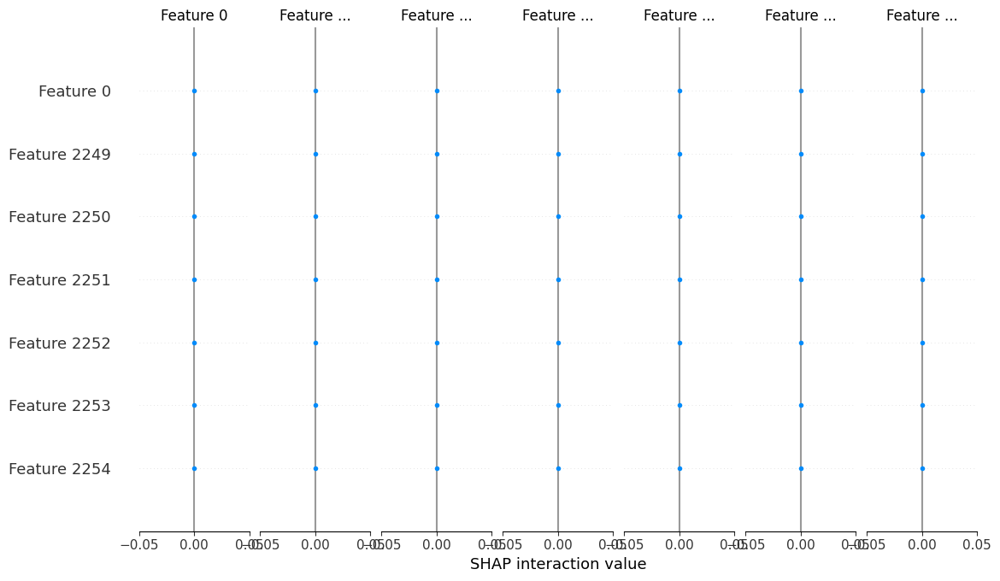

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


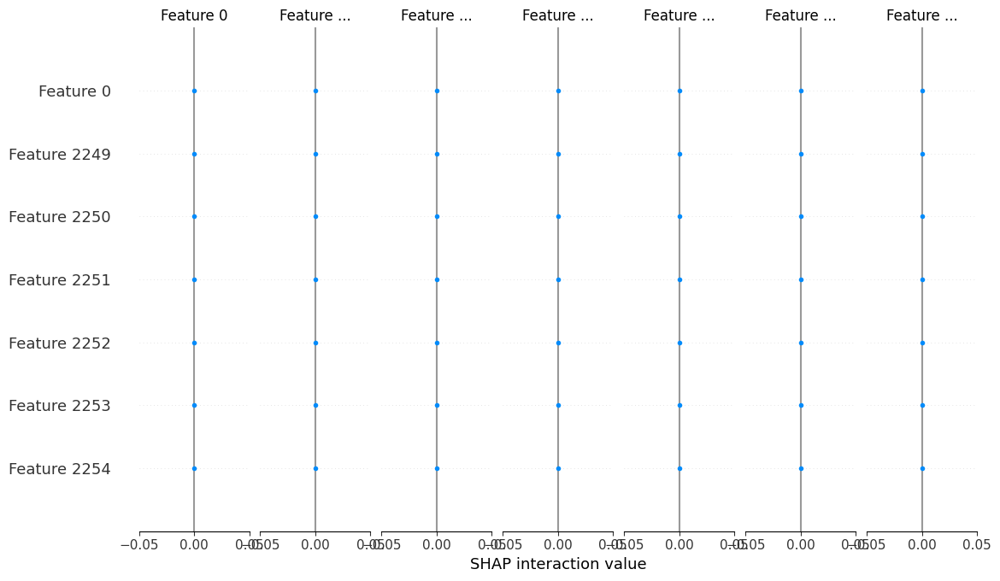

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


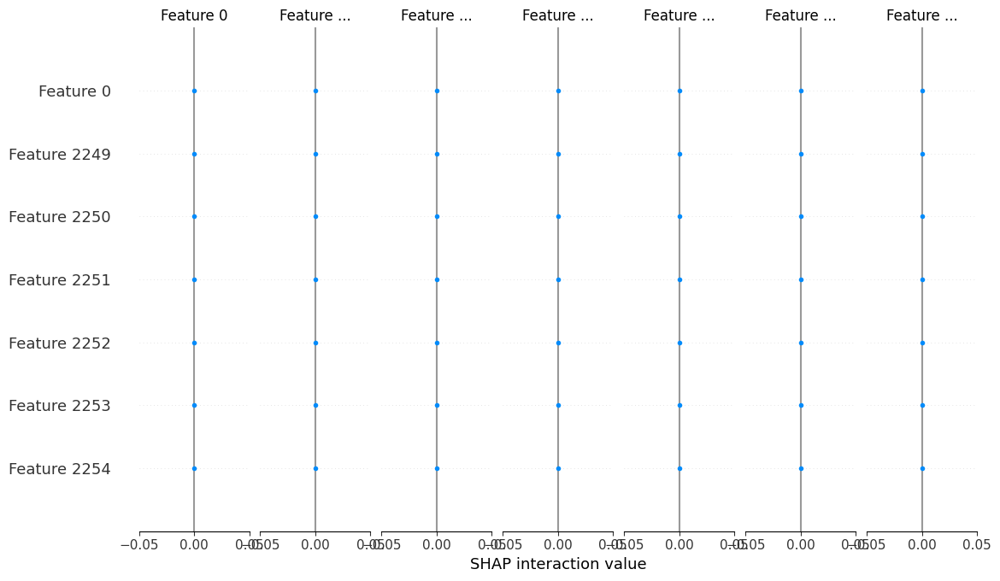

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


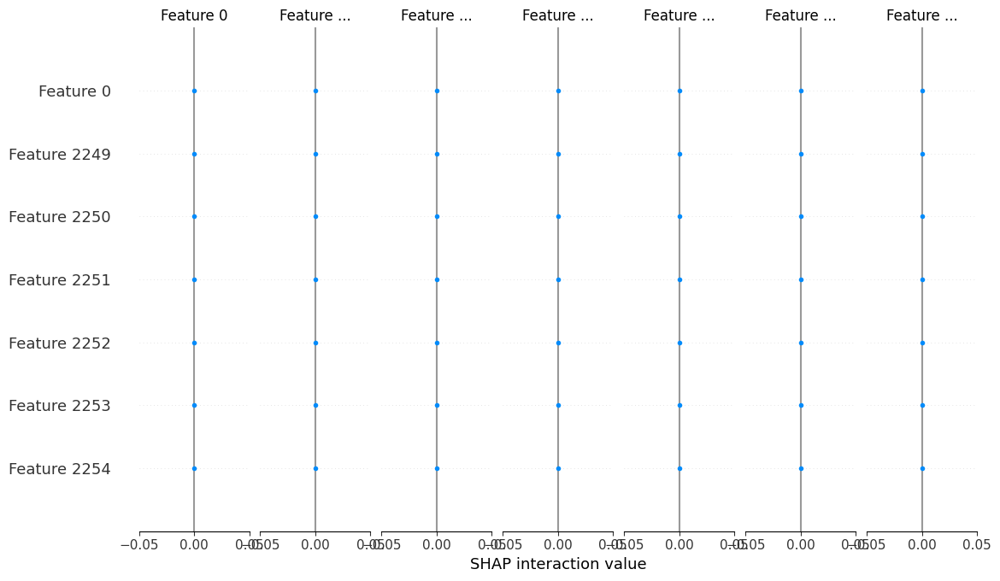

100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


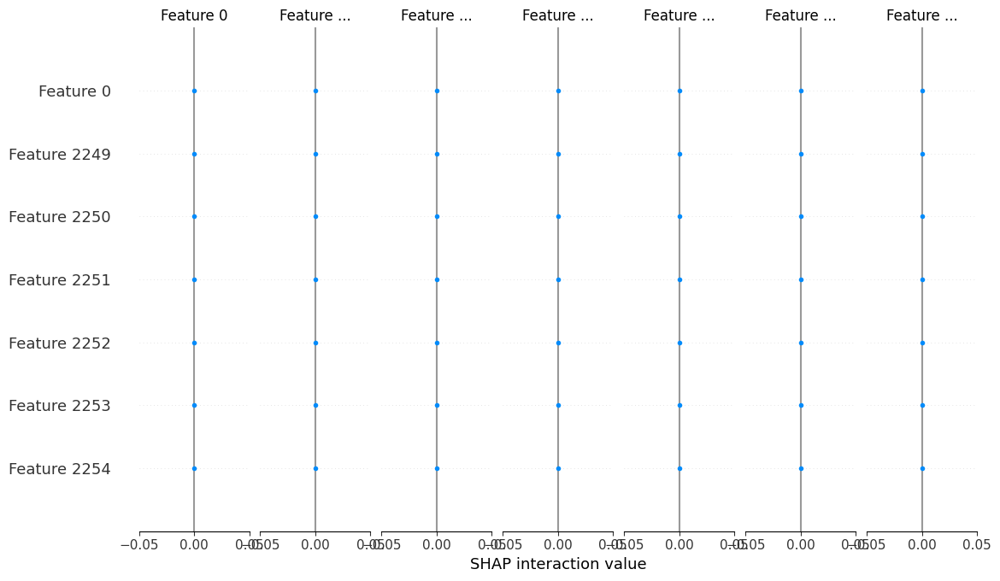

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


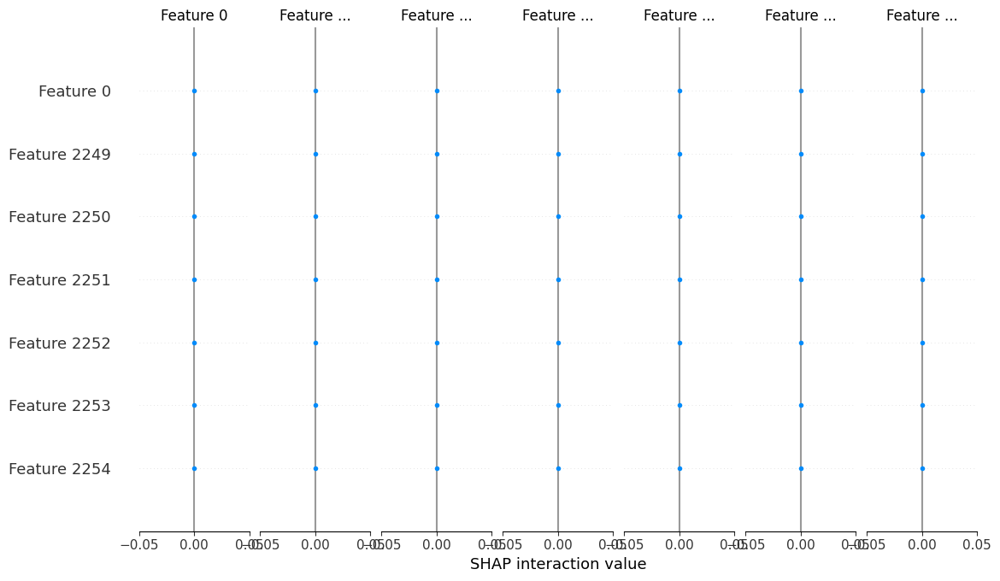

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


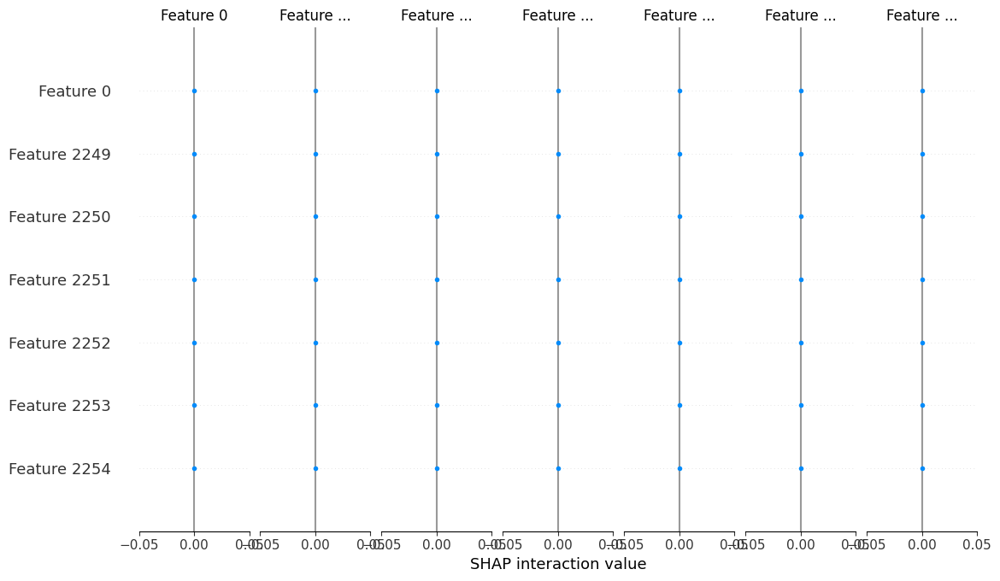

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


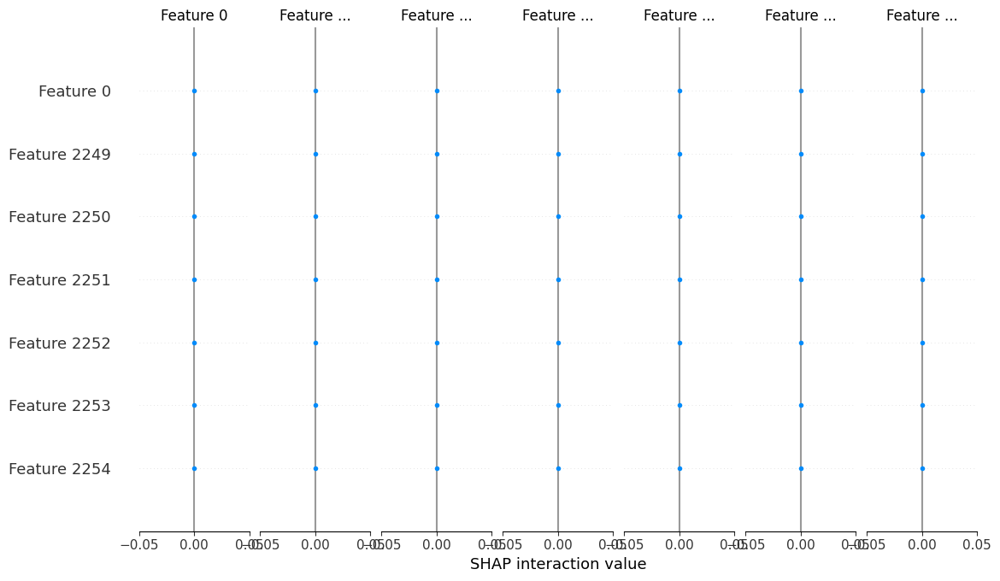

100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


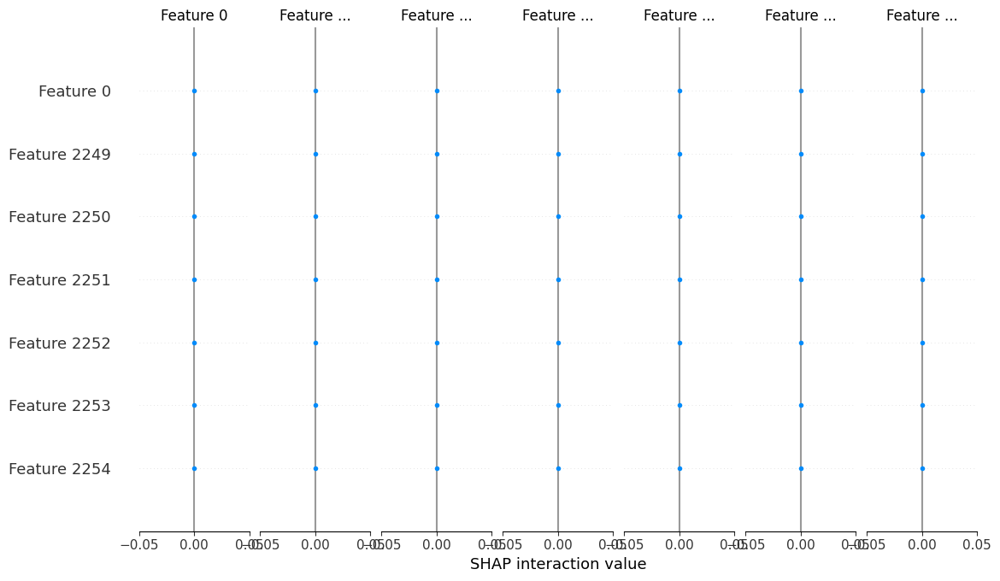

100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


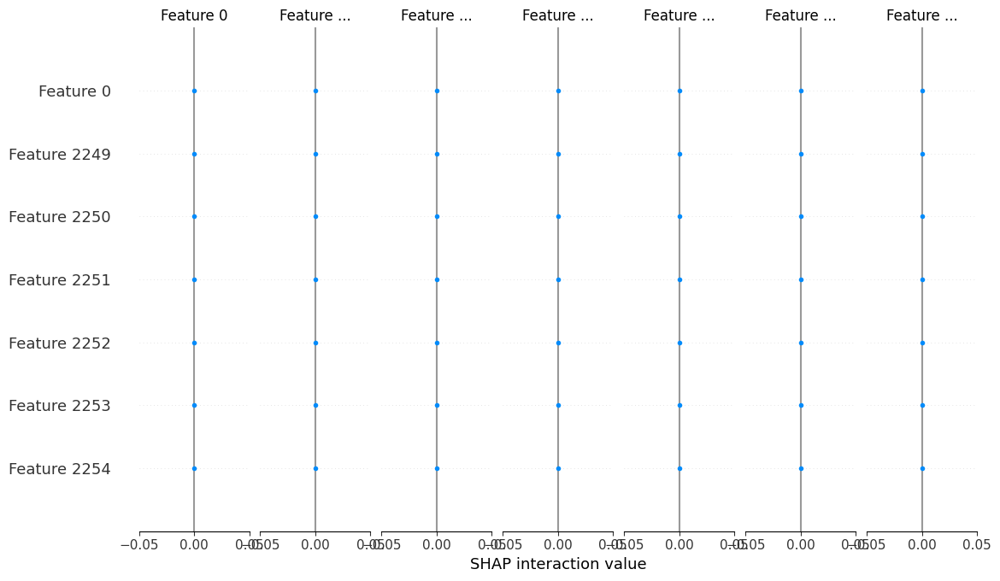

100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


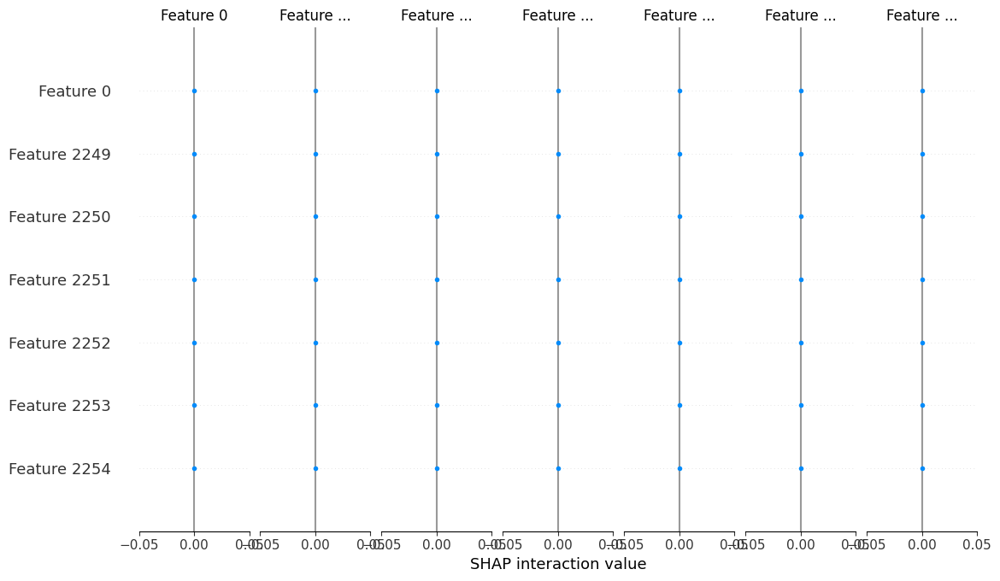

100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


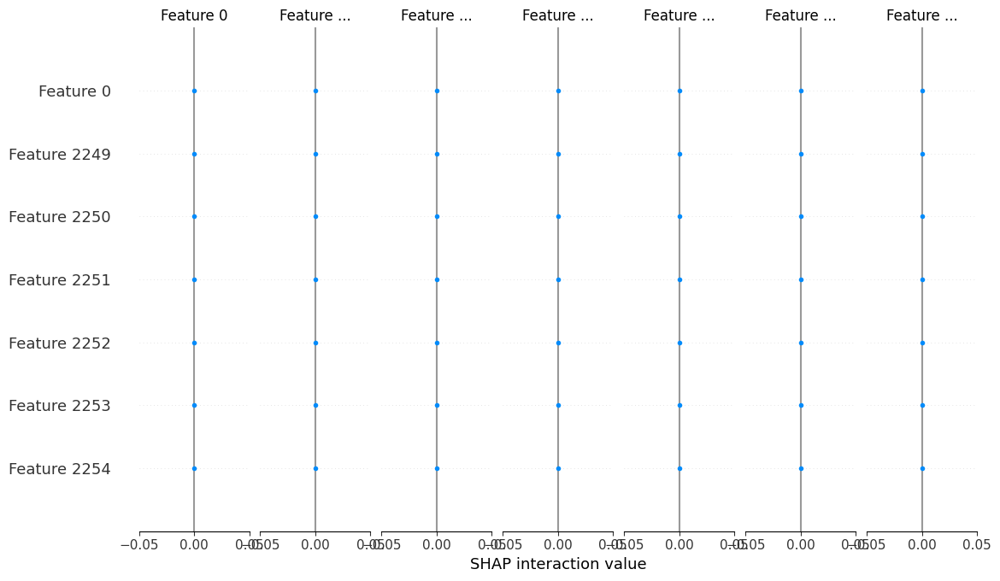

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


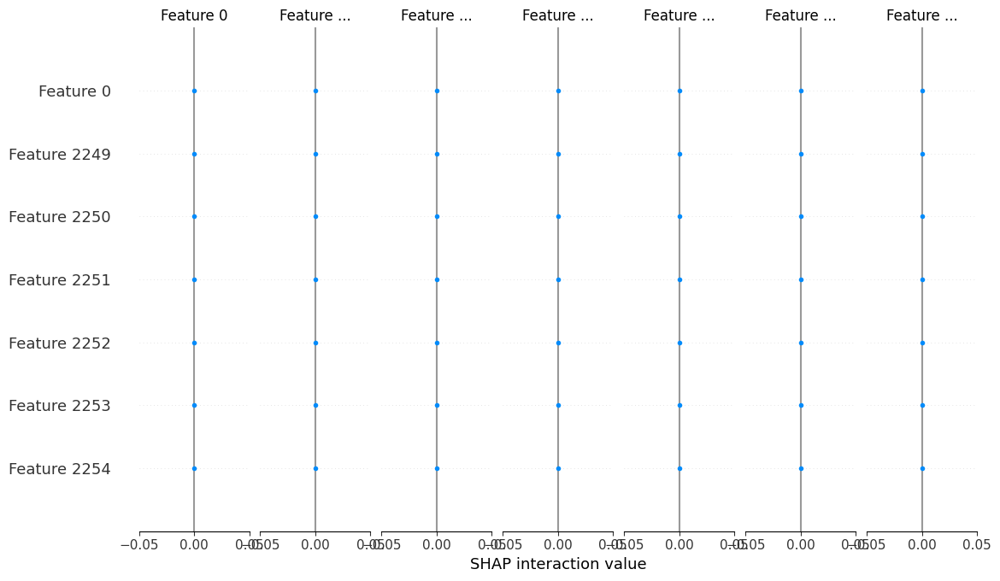

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


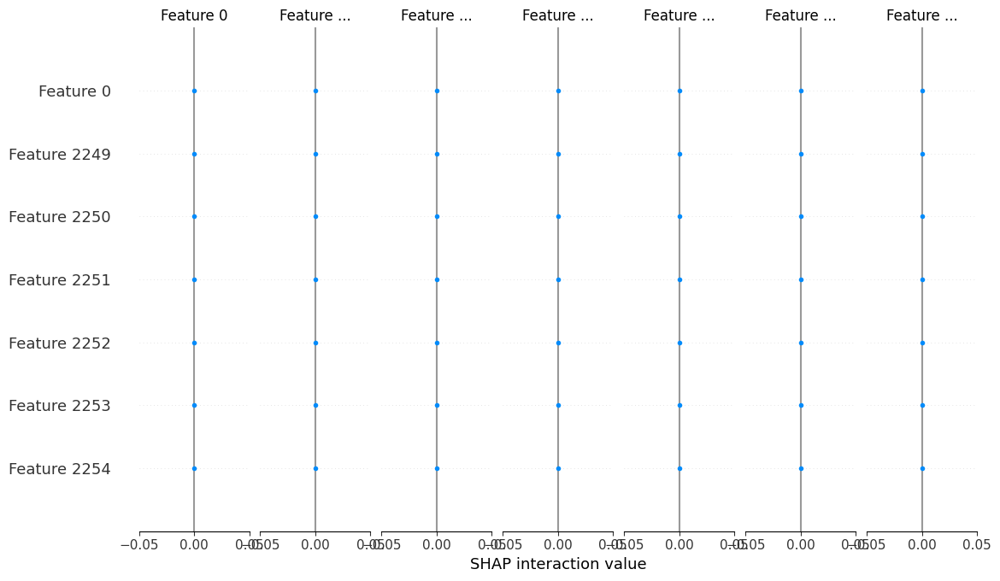

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


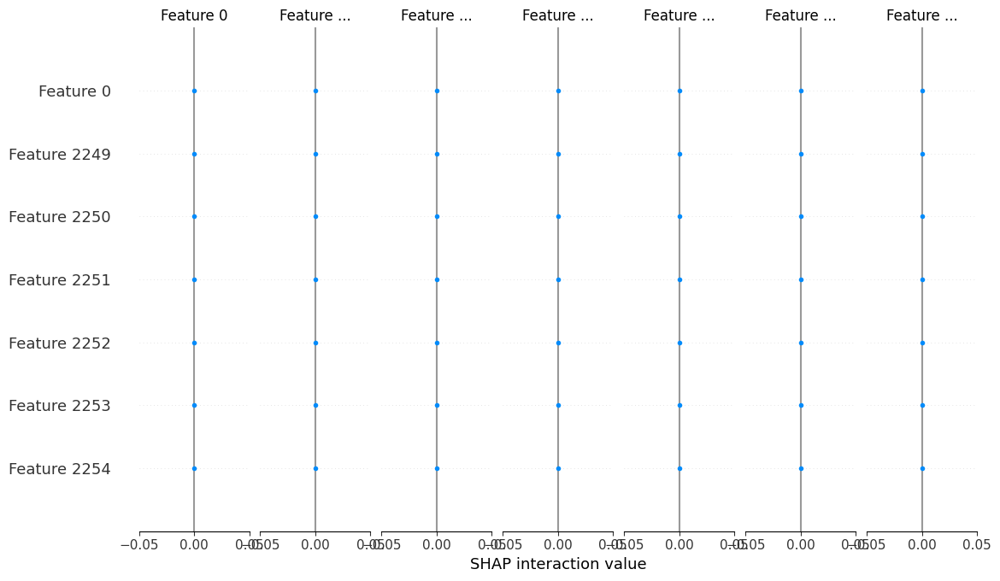

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


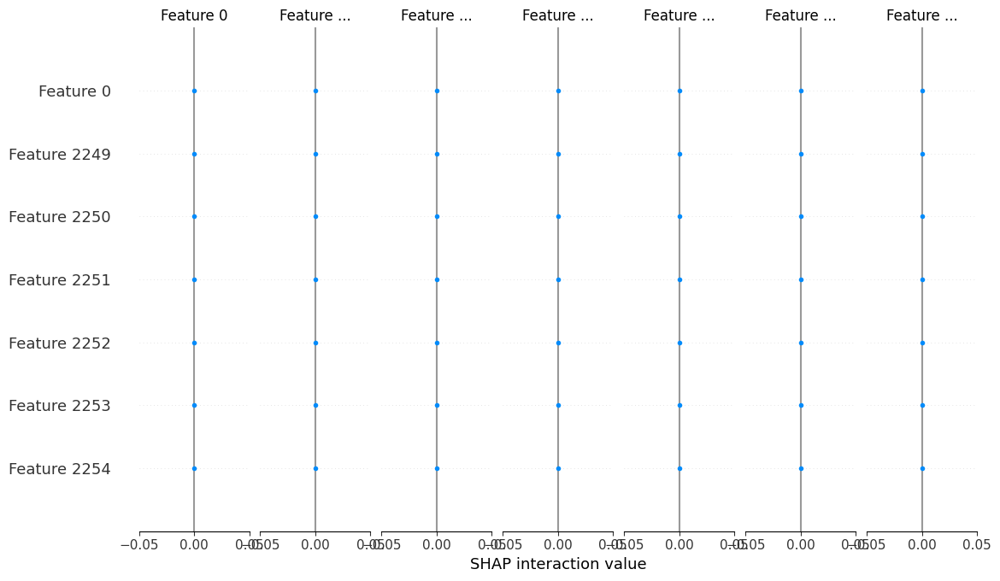

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


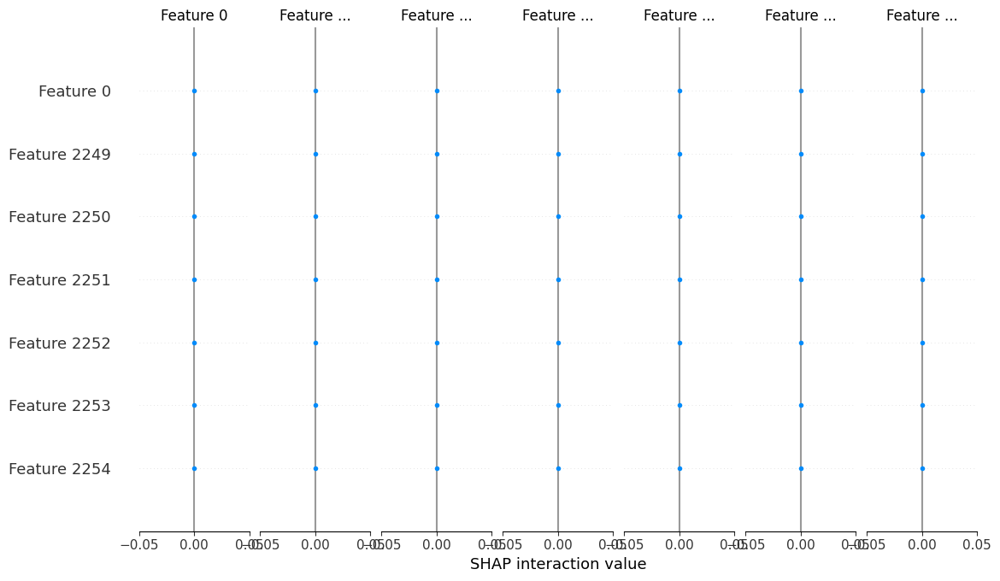

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


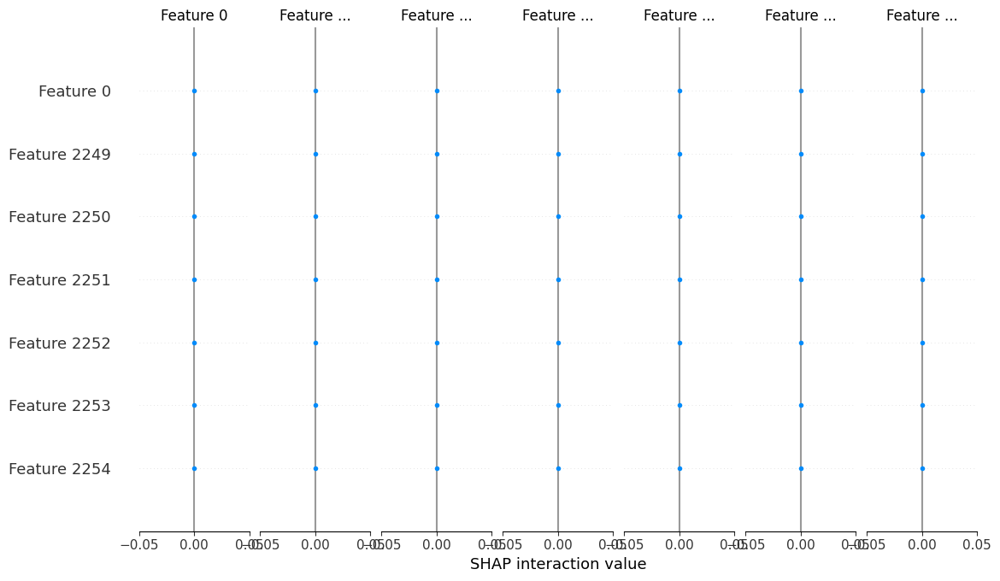

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


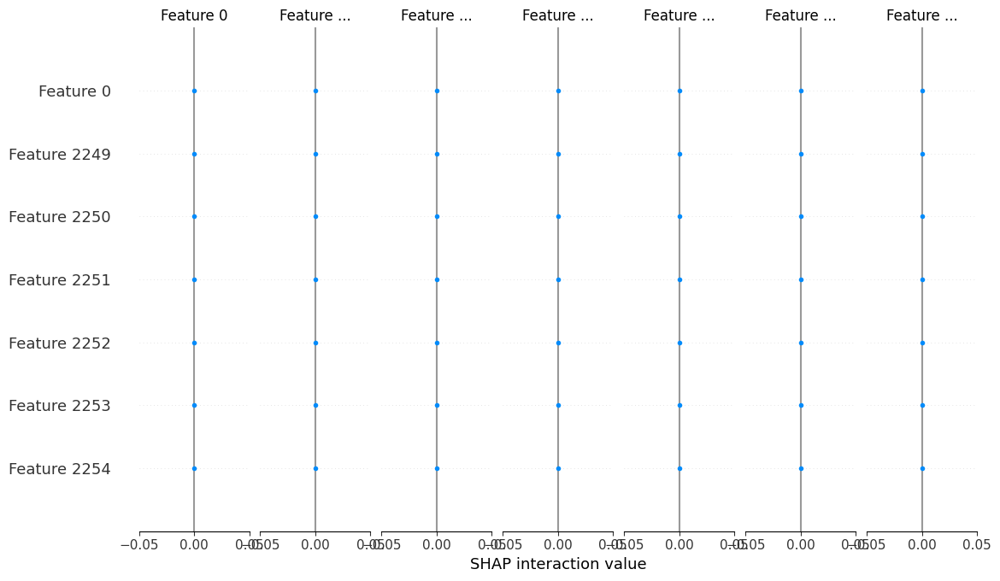

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


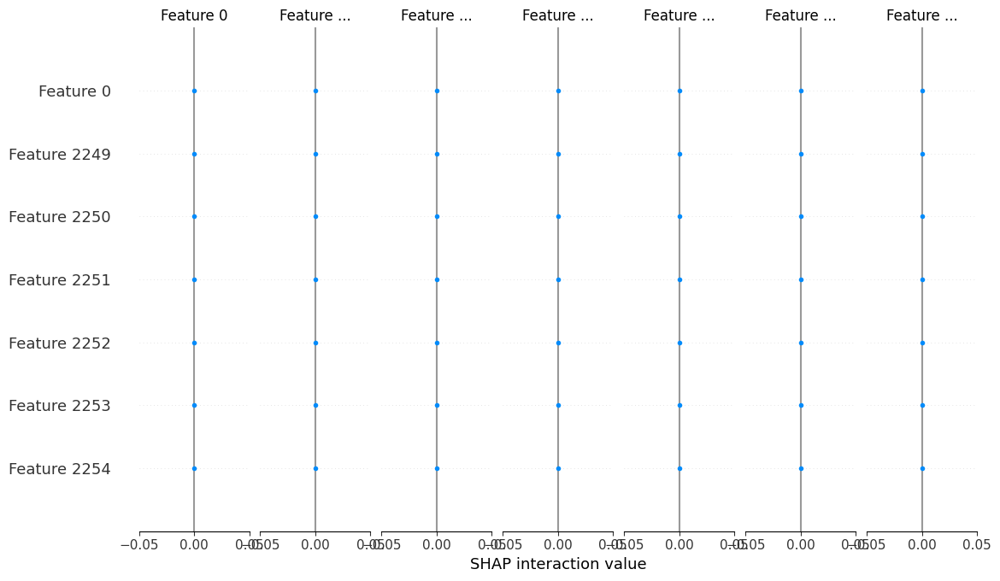

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


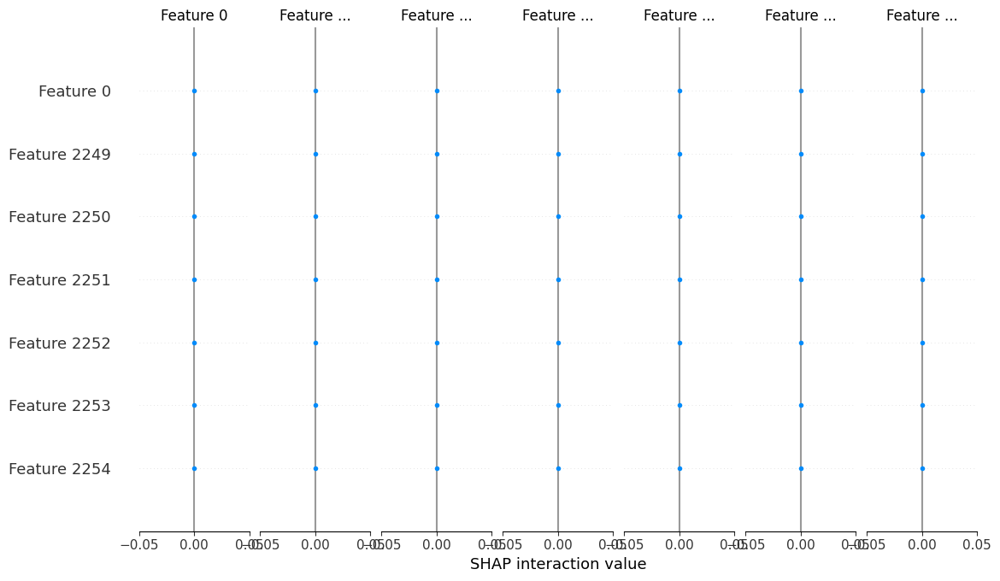

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


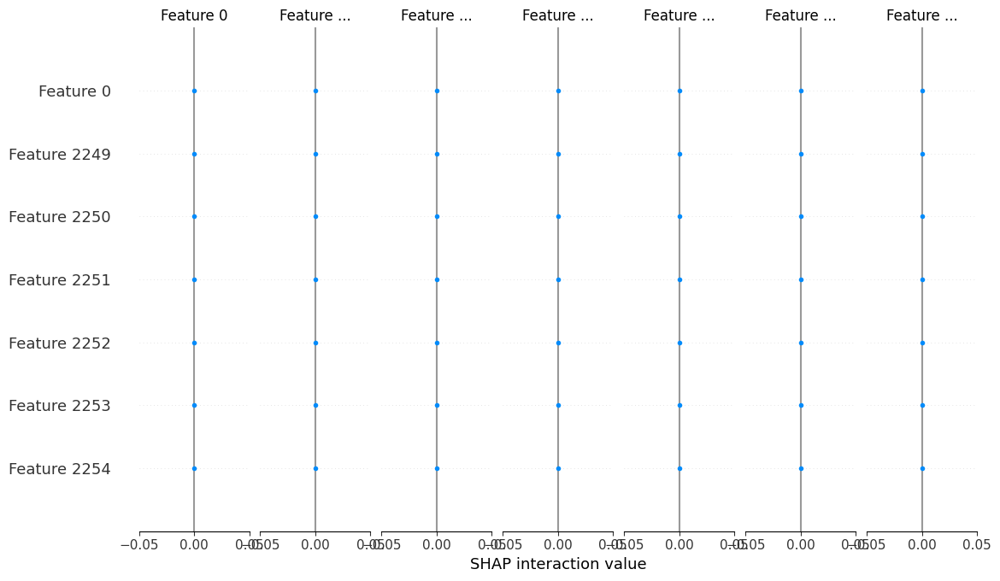

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


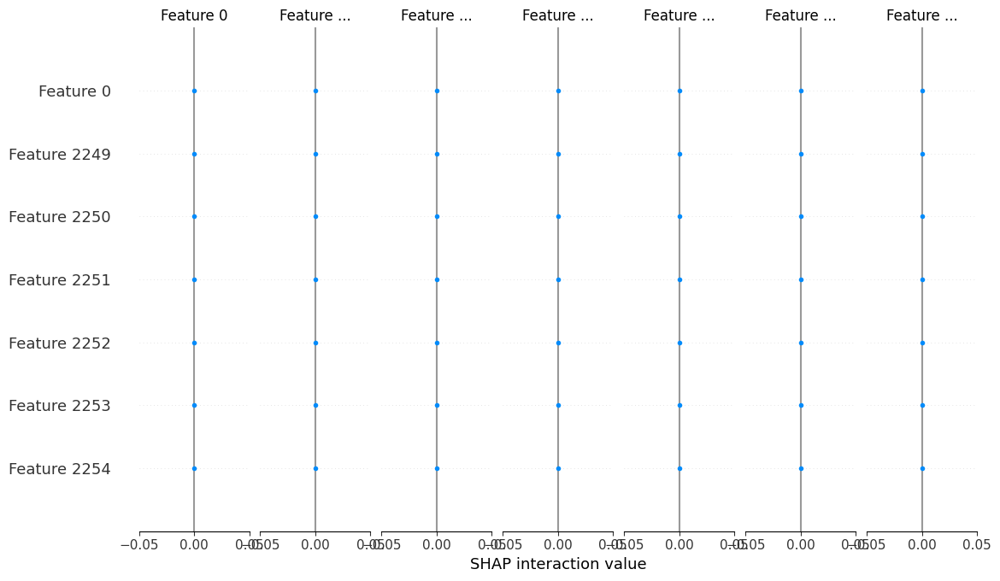

100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


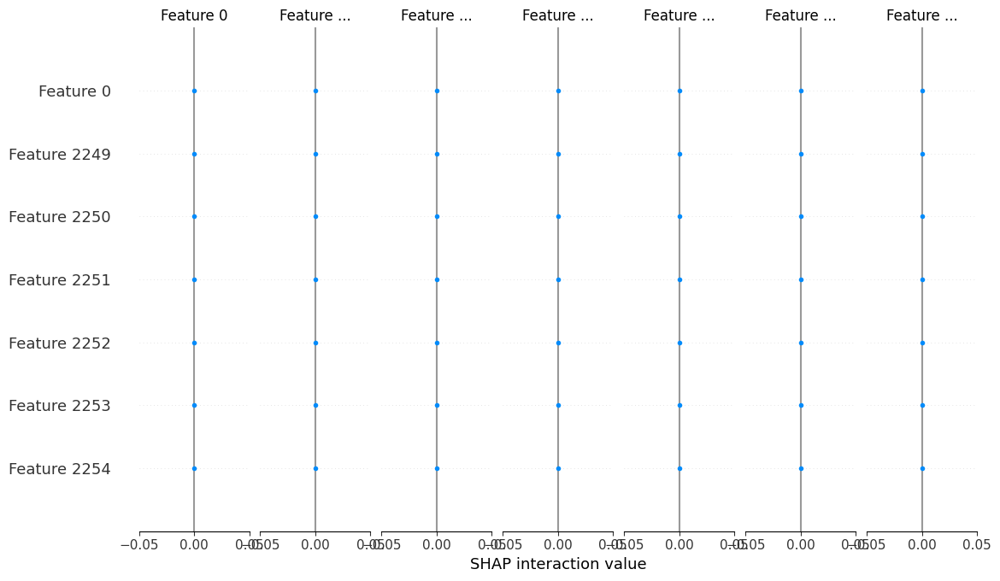

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


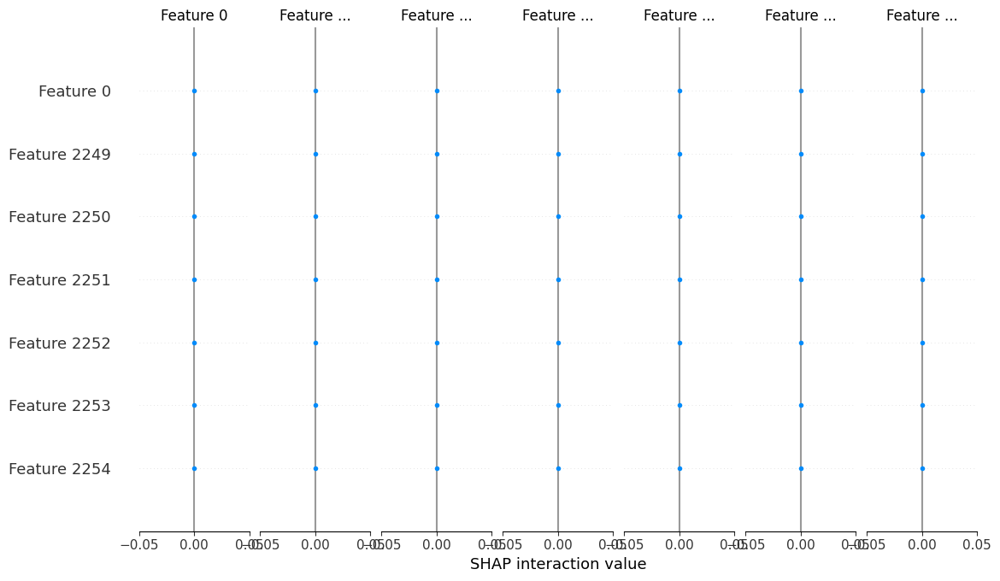

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


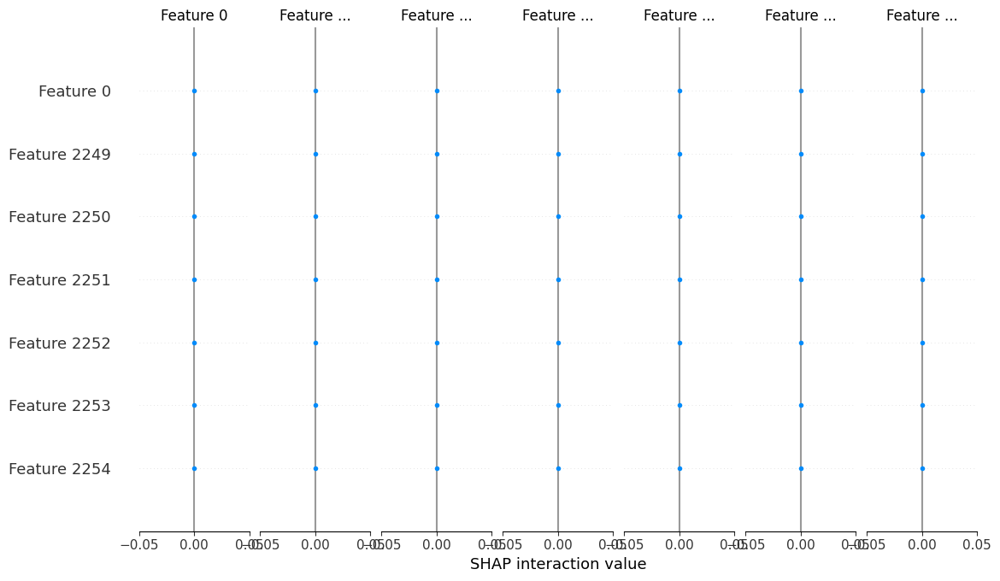

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


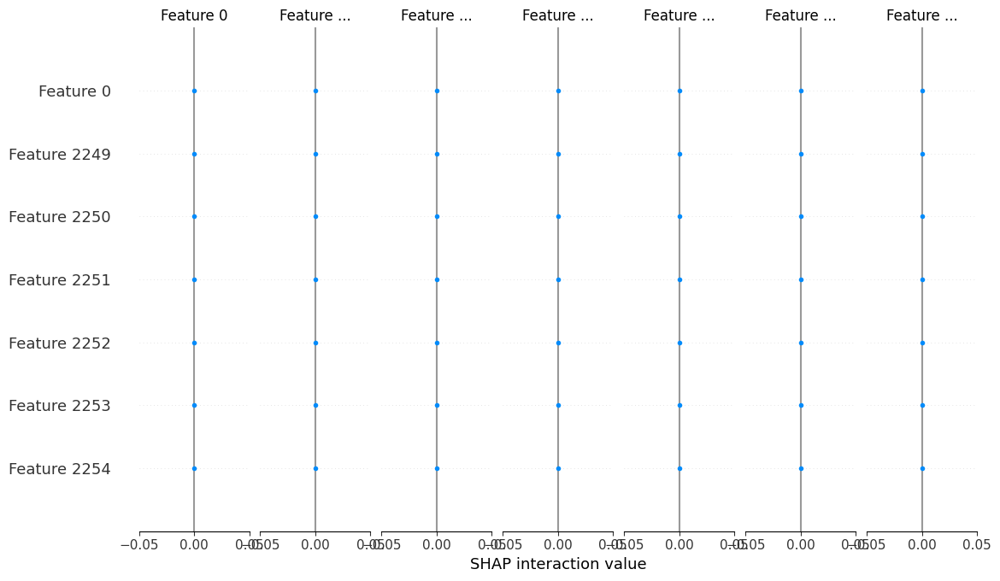

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


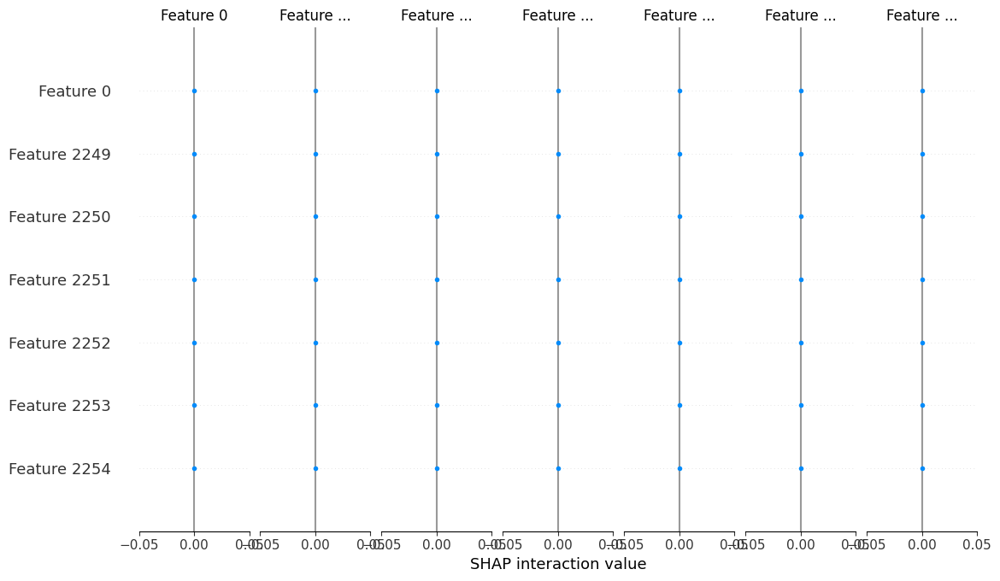

100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


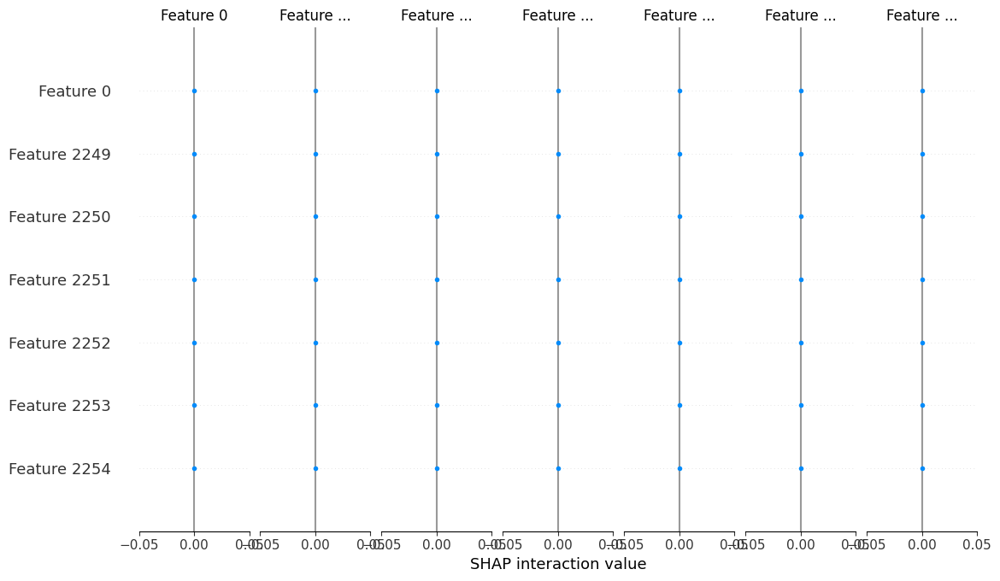

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


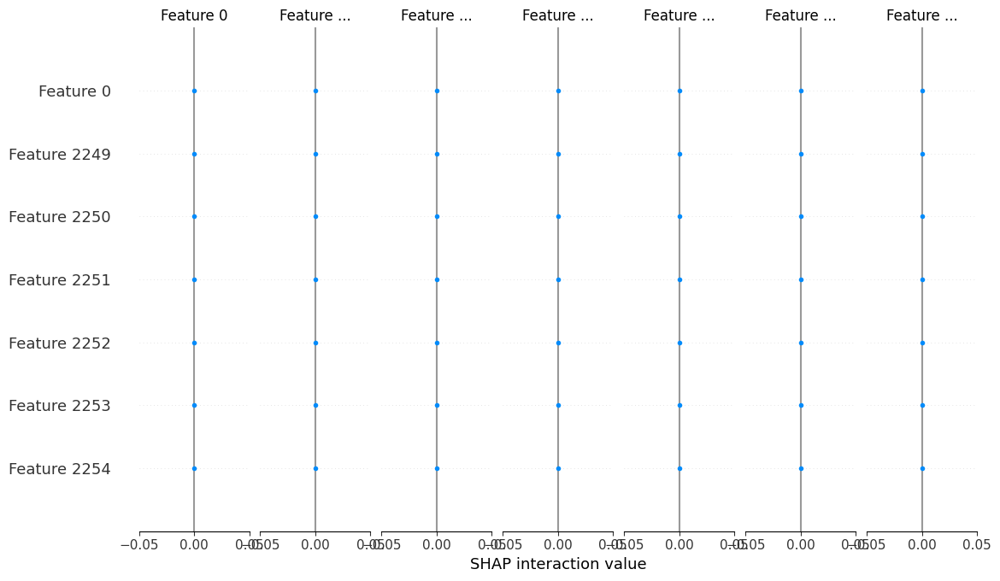

100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


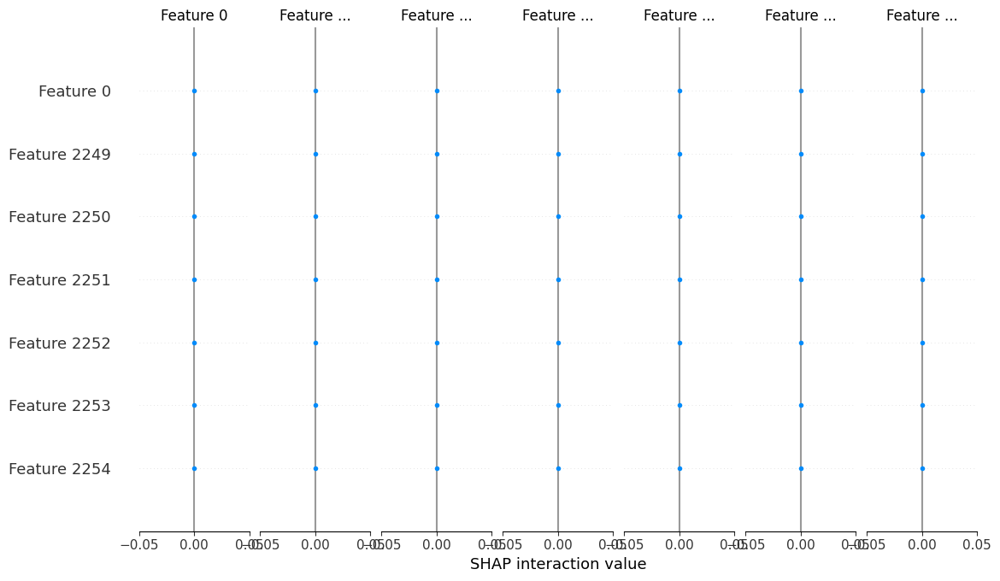

100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


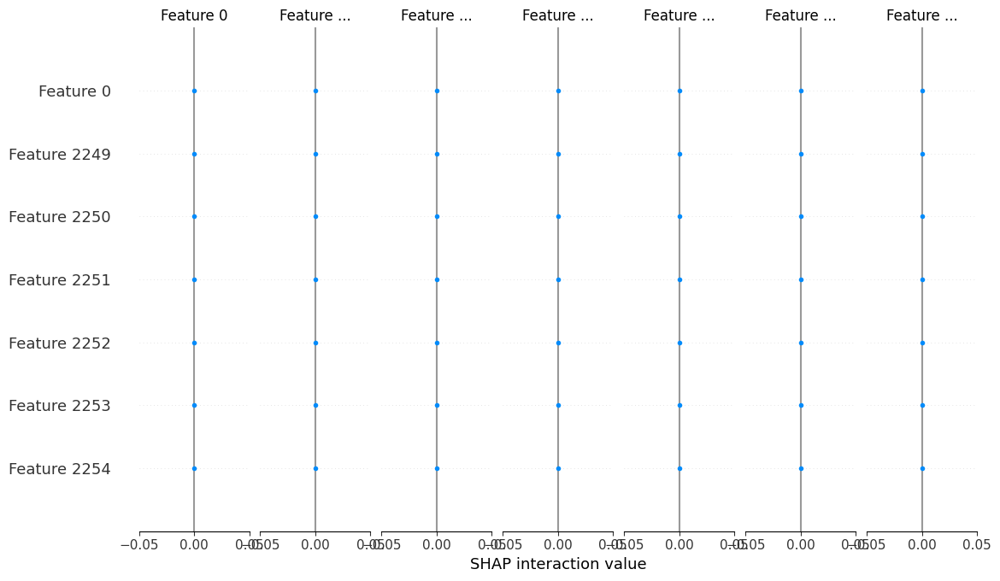

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


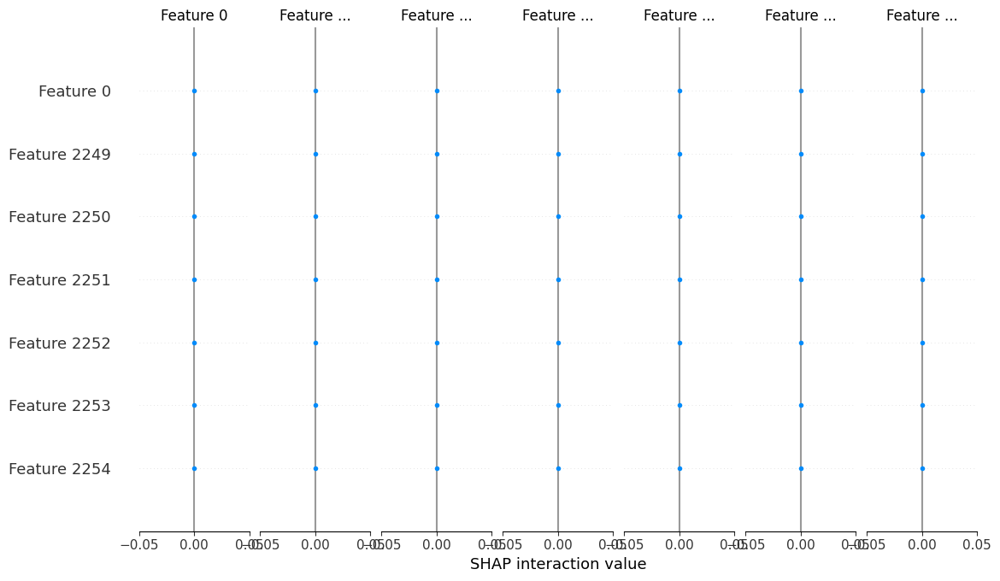

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


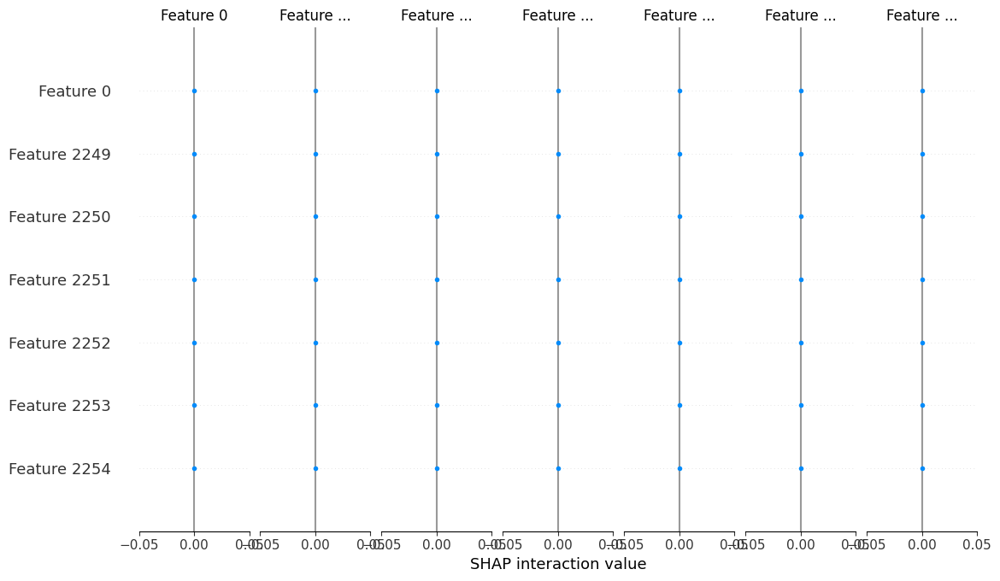

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


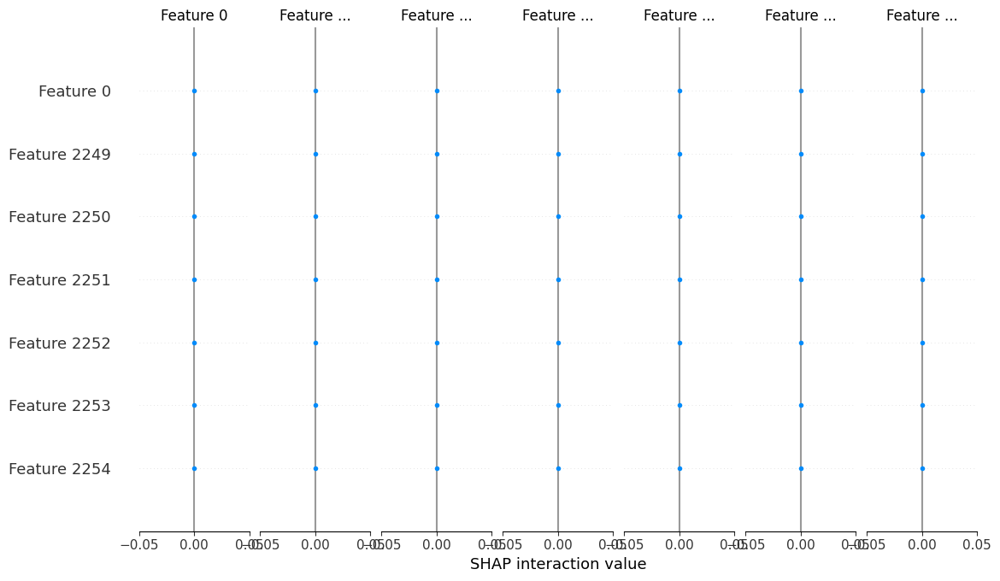

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


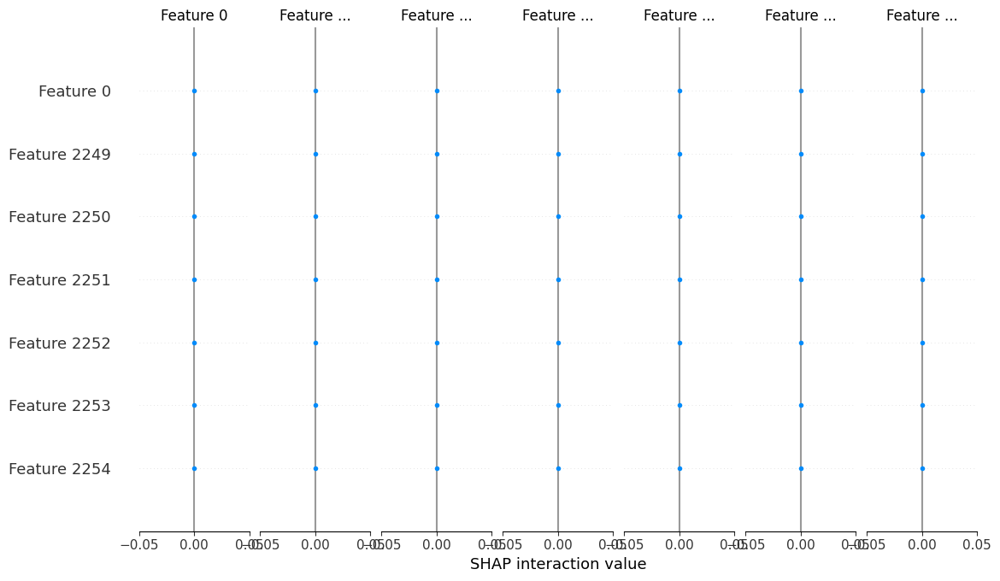

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


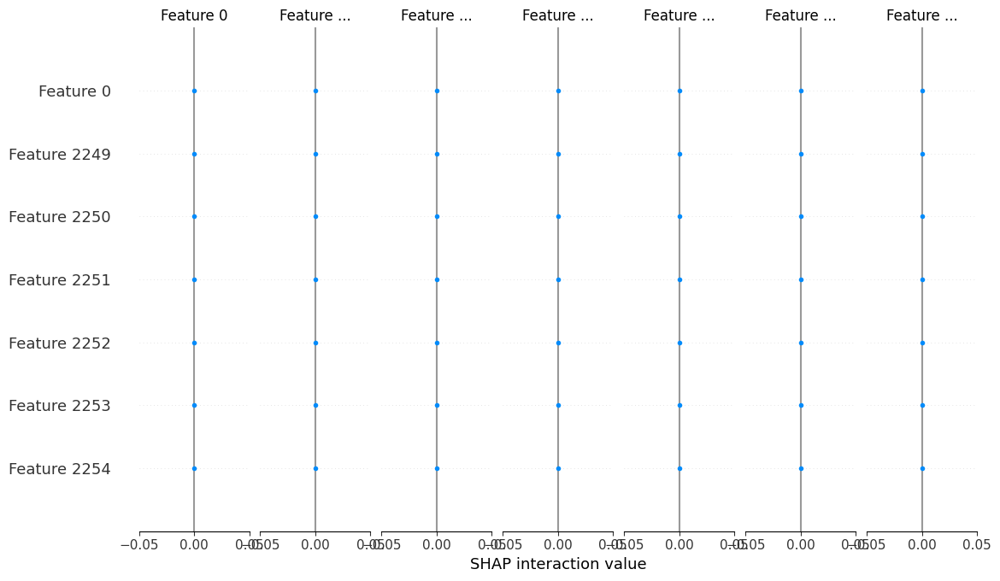

100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


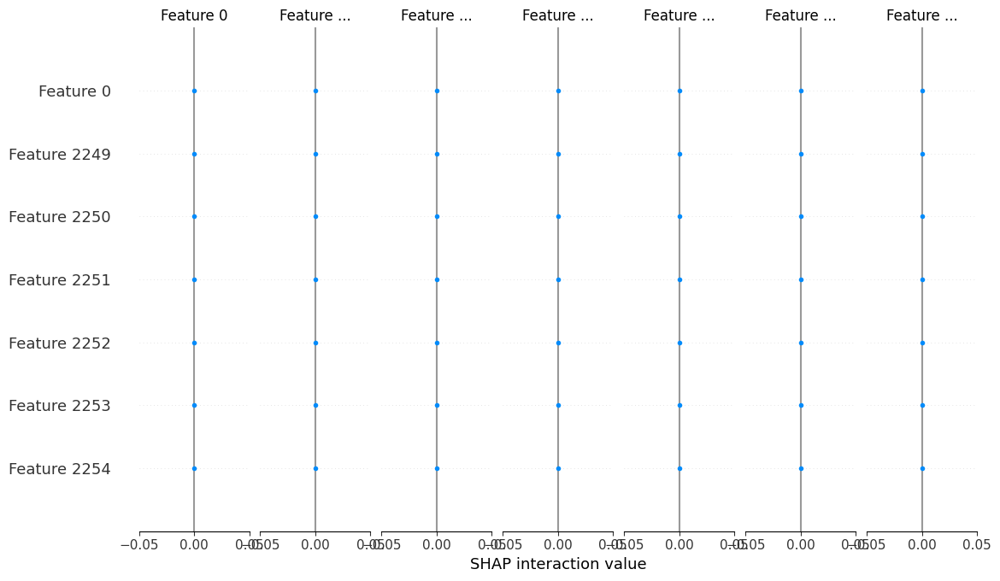

100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


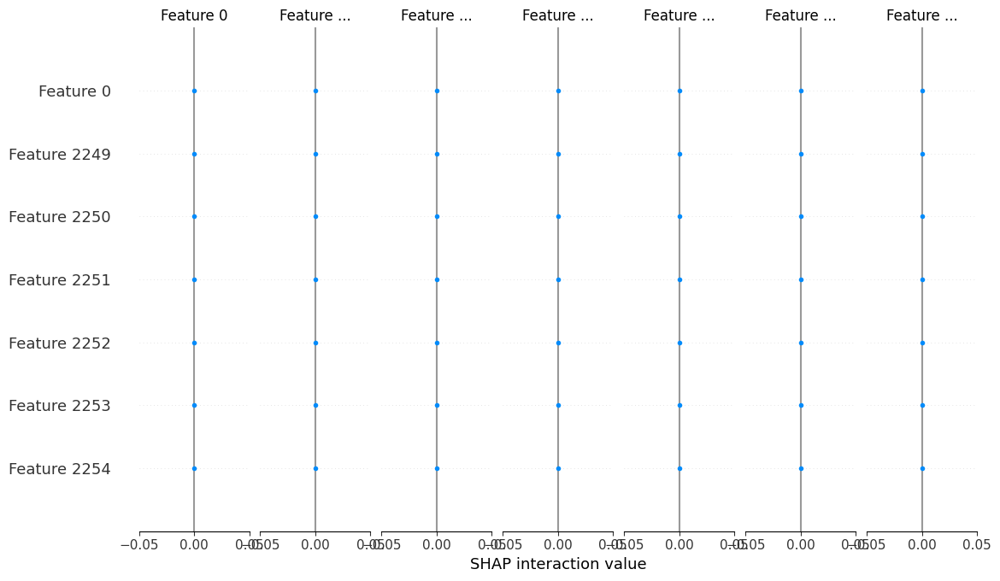

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


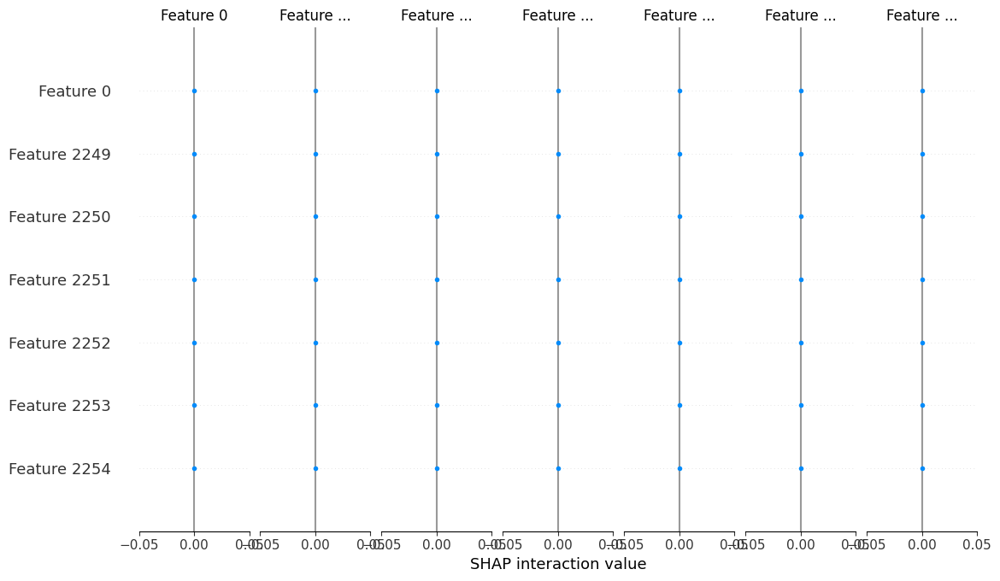

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


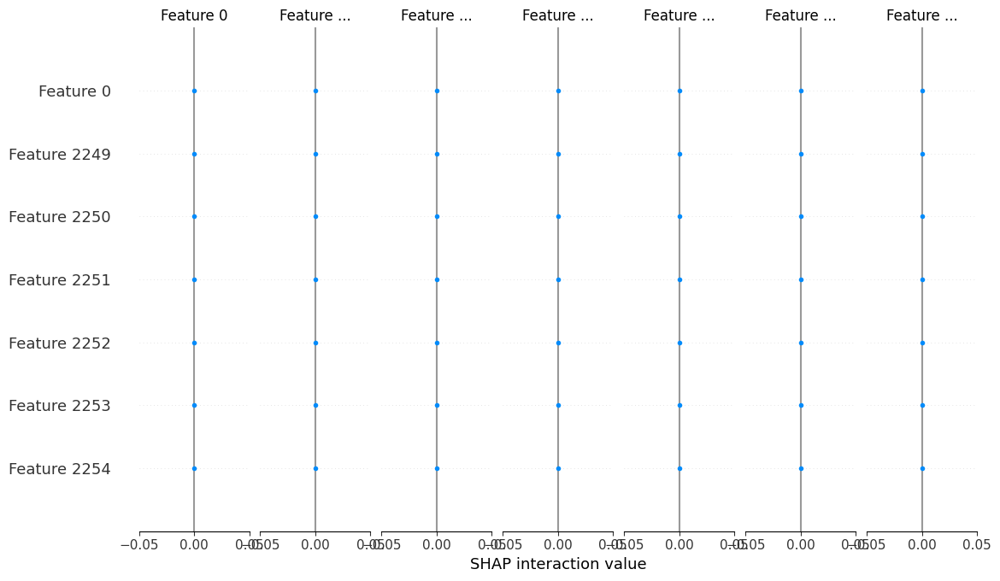

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


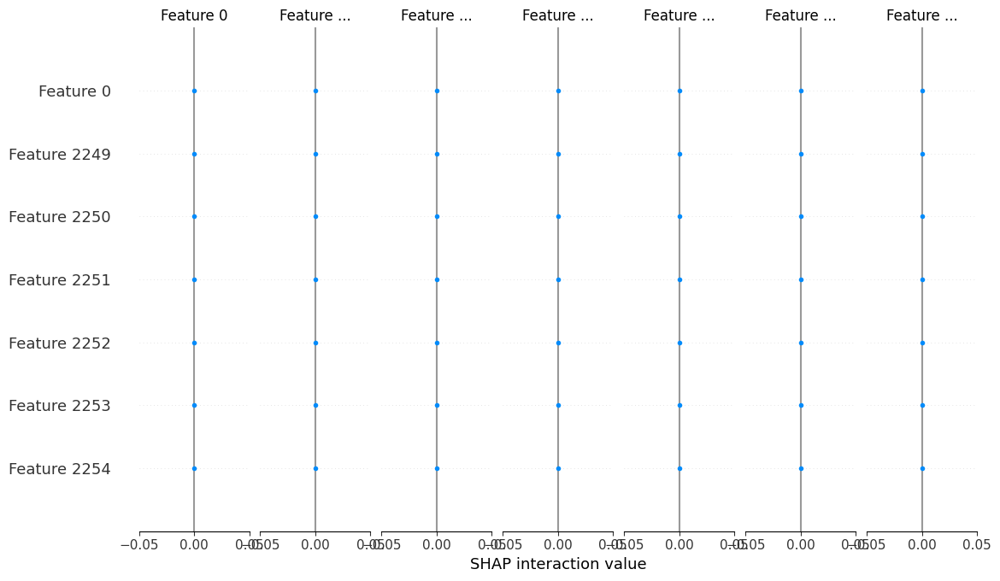

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


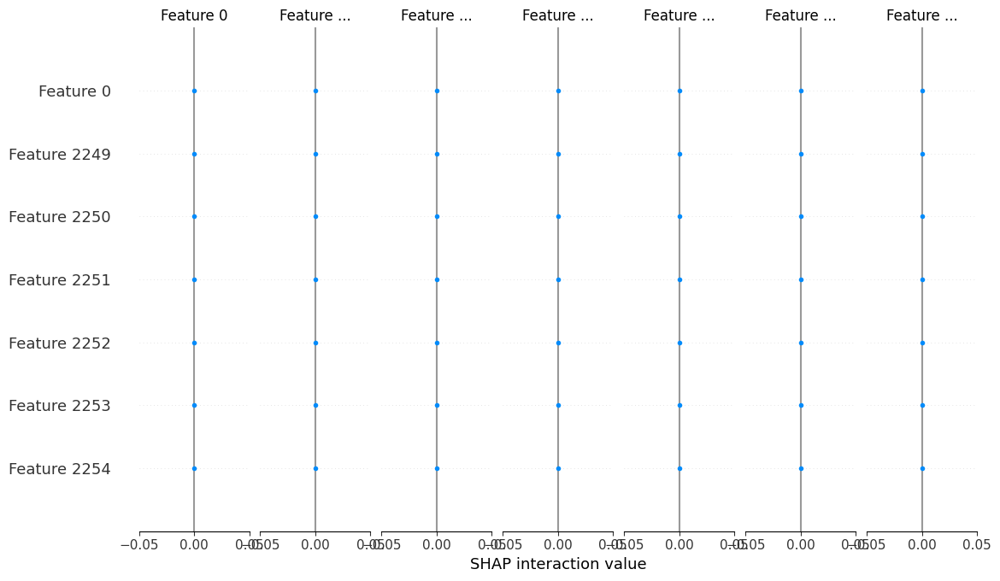

100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


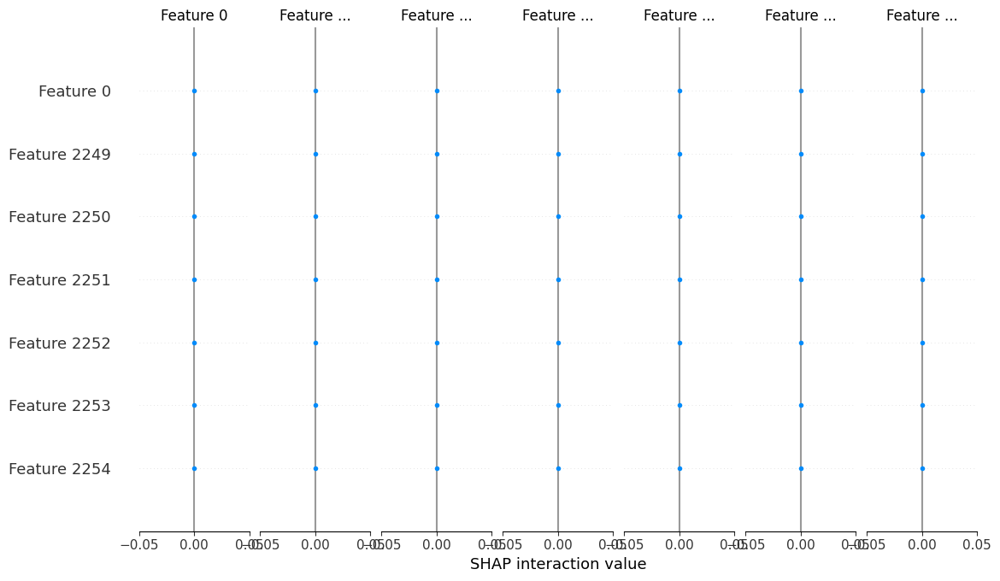

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


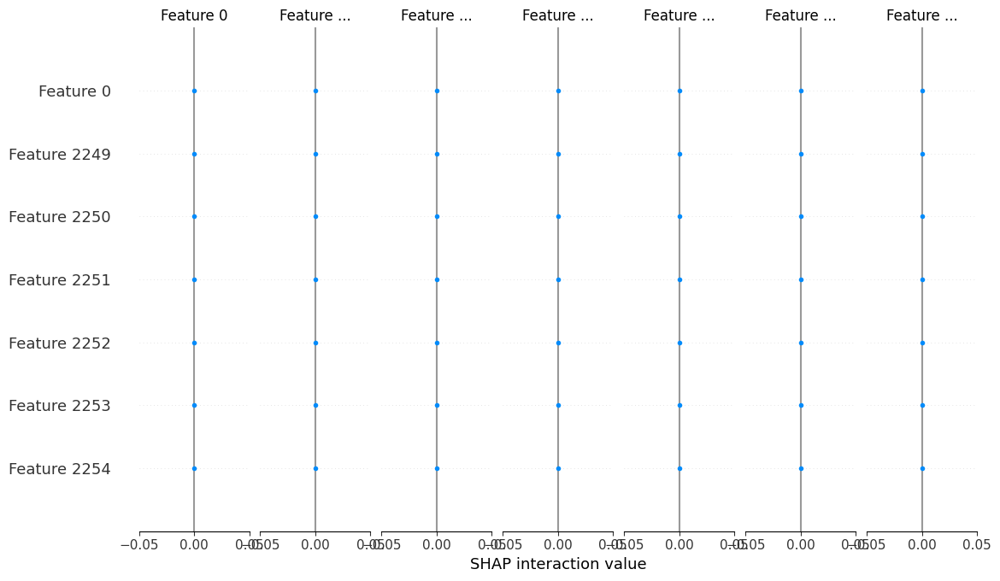

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


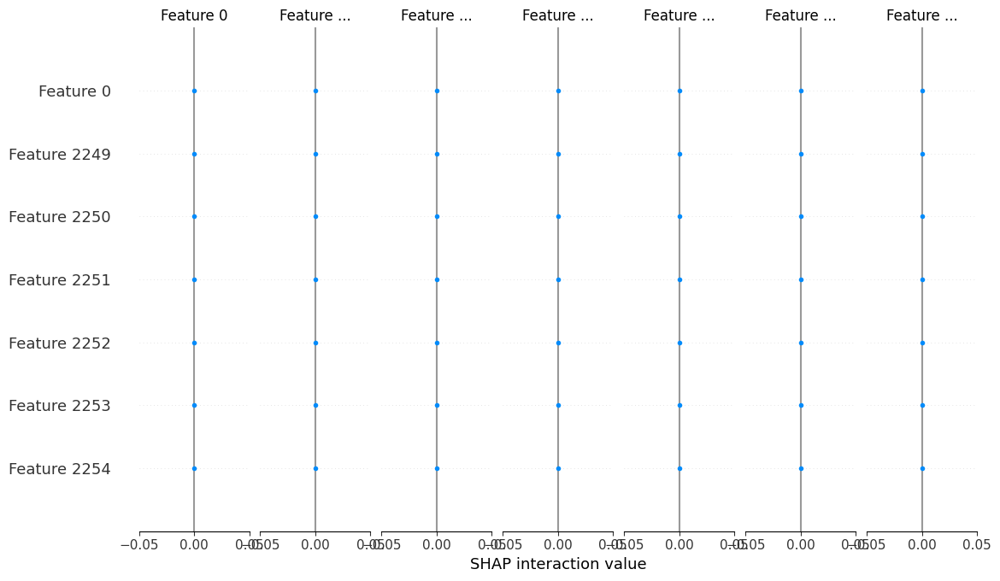

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


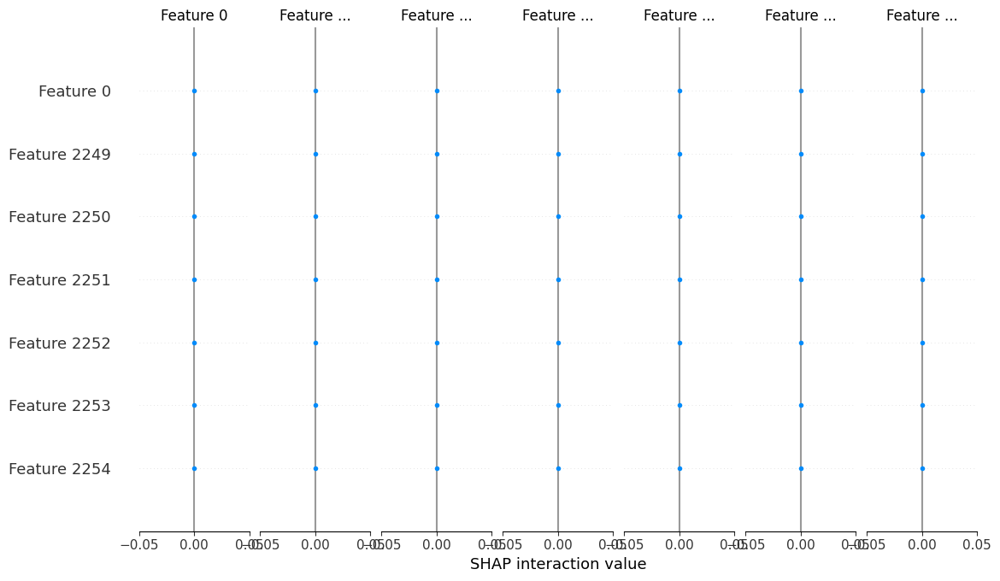

100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


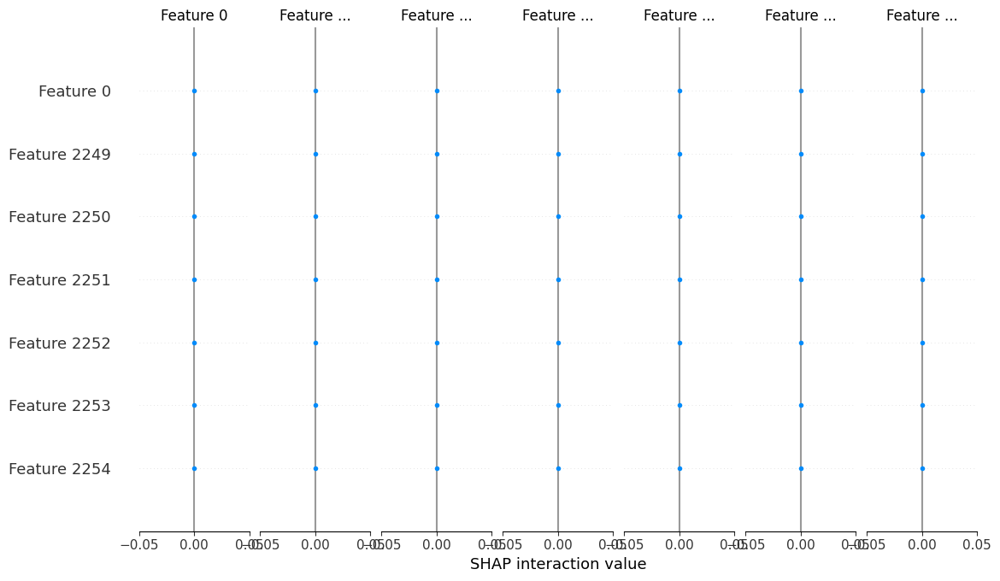

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


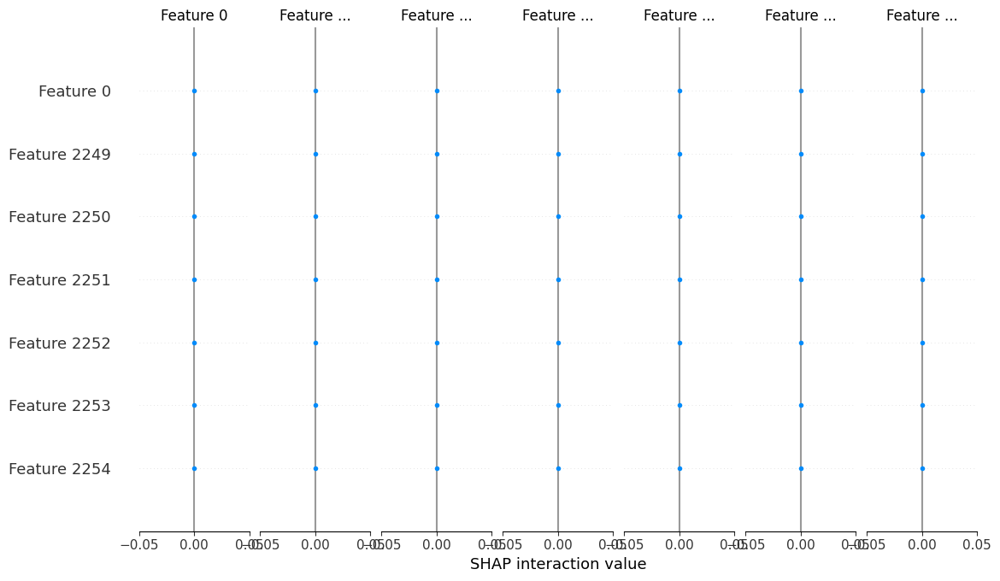

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


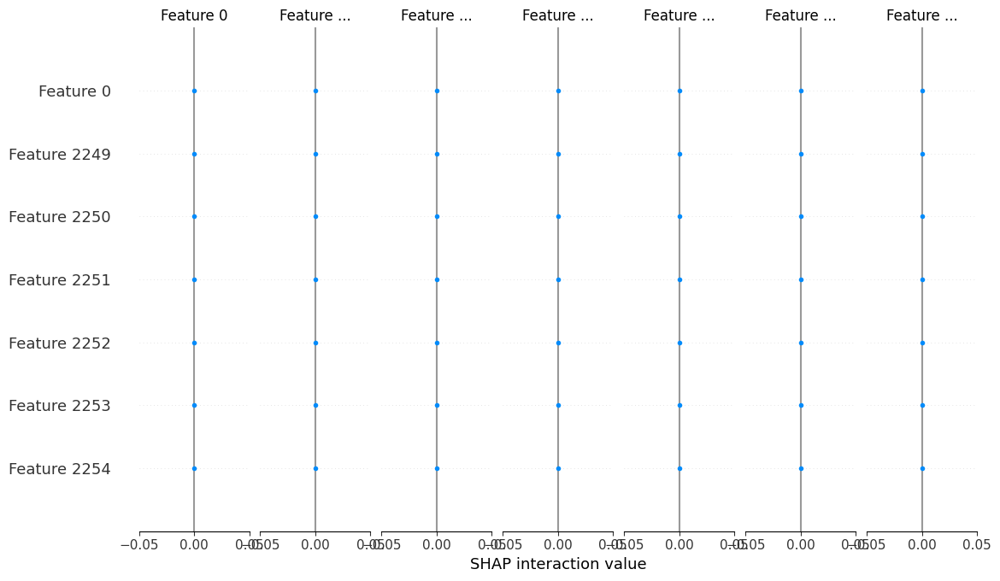

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


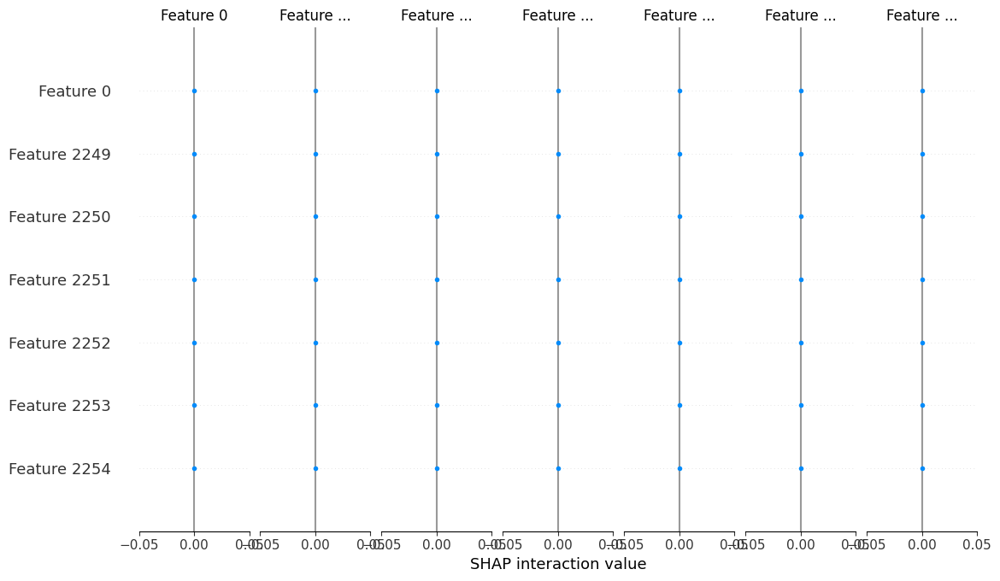

In [57]:
# Define a simple function to calculate the reconstruction error or any other output you're interested in
def model_function(X):
    # For demonstration, this just returns X to make it compatible with SHAP
    # You might want to use autoencoder.predict(X) or any other operation relevant to your analysis
    return X

# Analyze each lifeline's latent space representation individually
for i in range(num_lifelines):
    lifeline_data = latent_space_reshaped[i].reshape(1, -1)  # Flatten the data to make it 2D: (1, timesteps * features)
    background_data = shap.sample(lifeline_data, 1)  # Using the lifeline data itself as background; adjust as needed
    explainer = shap.KernelExplainer(model_function, background_data)
    
    # Calculate SHAP values
    shap_values = explainer.shap_values(lifeline_data, nsamples=100)  # Adjust nsamples as needed for approximation accuracy
    
    # Visualize SHAP values for this lifeline
    shap.summary_plot(shap_values, lifeline_data)


# Time Series Clustering - DTW

In [ ]:
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import dtw
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Assuming latent_representations is loaded and has the shape (101, 376, 9)
n_samples, n_timesteps, n_features = latent_representations.shape

# Scale time series data
scaler = TimeSeriesScalerMeanVariance(mu=0., std=1.)

for feature_idx in range(n_features):
    feature_data = latent_representations[:, :, feature_idx].reshape(n_samples, n_timesteps, 1)
    feature_data_scaled = scaler.fit_transform(feature_data)

    silhouette_scores = []
    for n_clusters in range(5, 11):  # try with cluster numbers from 5 to 10
        model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", verbose=True, max_iter=10)
        y_pred = model.fit_predict(feature_data_scaled)
        silhouette_avg = silhouette_score(feature_data_scaled.reshape(n_samples, n_timesteps), y_pred)
        silhouette_scores.append(silhouette_avg)
        print(f"Silhouette Score for feature {feature_idx}, clusters {n_clusters}: {silhouette_avg}")

    # Find the number of clusters with the highest silhouette score
    best_n_clusters = np.argmax(silhouette_scores) + 5  # +5 because range starts from 5
    print(f"Best silhouette score for feature {feature_idx} is with {best_n_clusters} clusters")

    # Fit the model with the best number of clusters
    best_model = TimeSeriesKMeans(n_clusters=best_n_clusters, metric="dtw", verbose=True, max_iter=10)
    y_pred = best_model.fit_predict(feature_data_scaled)

    # Plotting centroid and comparing one sample from each cluster
    for i in range(best_n_clusters):
        plt.figure(figsize=(12, 4))

        # Plot the centroid
        centroid = best_model.cluster_centers_[i].flatten()
        plt.plot(centroid, "r-", label=f"Centroid {i+1}")

        # Plot one sample from the cluster
        cluster_members = feature_data_scaled[y_pred == i]
        if len(cluster_members) > 0:
            sample = cluster_members[0].flatten()
            plt.plot(sample, "k-", alpha=0.5, label=f"Sample from Cluster {i+1}")

        plt.legend()
        plt.title(f'Feature {feature_idx}, Cluster {i+1}')
        plt.tight_layout()

        # Save the plot with a unique name
        plt.savefig(f'feature_{feature_idx}_cluster_{i+1}_comparison.png')
        plt.close()  # Close the plot to avoid displaying it inline

    # Optionally, plot all time series in each cluster to compare within-cluster variance
    plt.figure(figsize=(12, 4 * best_n_clusters))
    for i in range(best_n_clusters):
        plt.subplot(best_n_clusters, 1, i + 1)

        # Plot all series in the cluster
        cluster_members = feature_data_scaled[y_pred == i]
        for series in cluster_members:
            plt.plot(series.flatten(), "k-", alpha=0.2)

        # Highlight the centroid
        plt.plot(centroid, "r-", label=f"Centroid {i+1}")
        plt.legend()
        plt.title(f'All Series in Feature {feature_idx}, Cluster {i+1}')

    plt.tight_layout()
    # Save the full comparison plot for the feature
    plt.savefig(f'feature_{feature_idx}_all_cluster_comparisons.png')
    plt.close()


In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

# Assuming latent_representations is loaded with shape (101, 376, 9)

n_samples, n_timesteps, n_features = latent_representations.shape
scaler = TimeSeriesScalerMeanVariance(mu=0., std=1.)
n_clusters = 4

cluster_results = []

# Set up a figure with 9 subplots (for 9 features)
fig, axes = plt.subplots(3, 3, figsize=(15, 15))  
axes = axes.flatten()  

for feature_idx in range(n_features):
    feature_data = latent_representations[:, :, feature_idx]  
    feature_data_scaled = scaler.fit_transform(feature_data.reshape(n_samples, n_timesteps, 1))

    model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", verbose=False, max_iter=10)
    y_pred = model.fit_predict(feature_data_scaled)
    
    # Storing results
    for i, cluster_label in enumerate(y_pred):
        cluster_results.append({'Lifeline': i, 'Cluster': cluster_label, 'Feature': feature_idx})
    
    # Plotting on the corresponding subplot
    sns.scatterplot(x=[f'Cluster {x+1}' for x in y_pred], y=range(n_samples), hue=y_pred, palette='viridis', legend=False, ax=axes[feature_idx])
    axes[feature_idx].set_title(f'Feature {feature_idx+1}: Lifeline Cluster Assignments')  # Adjusted indexing for human-readable feature numbers
    axes[feature_idx].set_xlabel('Cluster')
    axes[feature_idx].set_ylabel('Lifeline')

plt.tight_layout()
plt.savefig('cluster_assignments_all_features_one_figure.png')
plt.close(fig)


cluster_assignments_df = pd.DataFrame(cluster_results)
cluster_assignments_df.to_csv('cluster_assignments_all_features.csv', index=False)

print("Clustering complete and results saved.")


Clustering complete and results saved.


# Time Series Decomposition (Interpretability of Latent Space - Timesteps)

In [13]:
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm

# Assuming latent_representations is loaded and has the shape (101, 376, 10)
n_samples, n_timesteps, n_features = latent_representations.shape
n_clusters = 6  # Fixed number of clusters

# Scale time series data
scaler = TimeSeriesScalerMeanVariance(mu=0., std=1.)

for feature_idx in range(n_features):
    feature_data = latent_representations[:, :, feature_idx].reshape(n_samples, n_timesteps, 1)
    feature_data_scaled = scaler.fit_transform(feature_data)

    # Clustering with DTW and fixed n_clusters
    model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", verbose=True, max_iter=10)
    y_pred = model.fit_predict(feature_data_scaled)

    # Decompose each centroid and plot the components
    for i, centroid in enumerate(model.cluster_centers_):
        # Centroid is shaped as (1, n_timesteps, 1), so we squeeze it to (n_timesteps,)
        centroid_series = centroid.squeeze()

        # Decompose the centroid time series
        decomposition = sm.tsa.seasonal_decompose(centroid_series, model='additive', period=12)  # Adjust period based on your data's seasonality
        
        # Plotting the decomposition
        plt.figure(figsize=(12, 8))
        plt.subplot(411)
        plt.plot(decomposition.observed, label='Original')
        plt.legend(loc='best')
        plt.subplot(412)
        plt.plot(decomposition.trend, label='Trend')
        plt.legend(loc='best')
        plt.subplot(413)
        plt.plot(decomposition.seasonal,label='Seasonality')
        plt.legend(loc='best')
        plt.subplot(414)
        plt.plot(decomposition.resid, label='Residuals')
        plt.legend(loc='best')
        plt.tight_layout()
        
        # Save the decomposition plot for each centroid
        plt.savefig(f'feature_{feature_idx}_cluster_{i+1}_decomposition.png')
        plt.close()


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


61.521 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


40.824 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


39.908 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.8s


39.808 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


39.808 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Do

78.297 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


52.078 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


51.396 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


50.933 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.7s


50.933 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Do

90.571 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


68.698 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


68.454 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.8s


68.221 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


68.221 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

71.519 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


49.258 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


48.475 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


47.895 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


46.875 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


46.752 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


46.752 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

98.135 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


59.605 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


56.781 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


56.041 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


55.991 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


55.991 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

56.242 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


41.678 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.7s


41.242 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


41.208 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


41.208 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

63.966 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


46.277 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


44.601 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


43.937 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


43.803 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


43.803 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

57.509 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


41.443 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


41.029 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


40.909 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


40.909 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

83.431 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


56.421 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


53.915 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


53.069 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


52.712 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


52.600 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


52.600 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

61.435 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


44.856 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


44.058 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


43.657 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


43.105 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


43.031 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.6s


42.906 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


42.906 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s


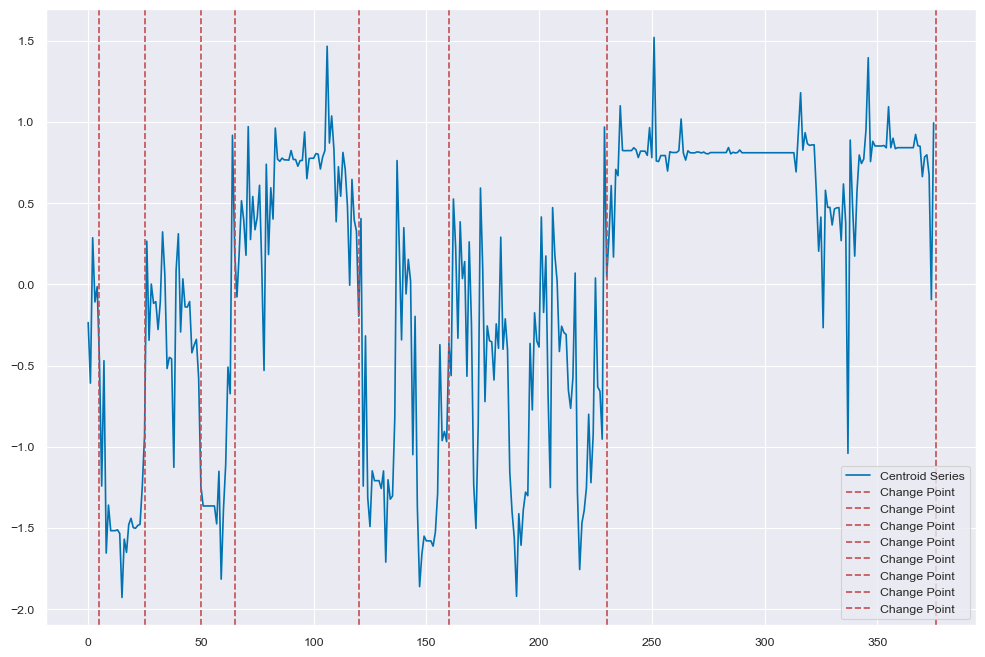

In [21]:
import ruptures as rpt

# Assuming you have your time series data in 'centroid_series'
n_bkps = 2  # number of breakpoints you want to detect

# Change point detection
algo = rpt.Pelt(model="rbf").fit(centroid_series)
result = algo.predict(pen=3)  # adjust the penalty value as needed

# Plotting the decomposition and change points
plt.figure(figsize=(12, 8))
plt.plot(centroid_series, label='Centroid Series')
for bkpt in result:
    plt.axvline(x=bkpt, color='r', linestyle='--', label='Change Point')
plt.legend()
plt.show()


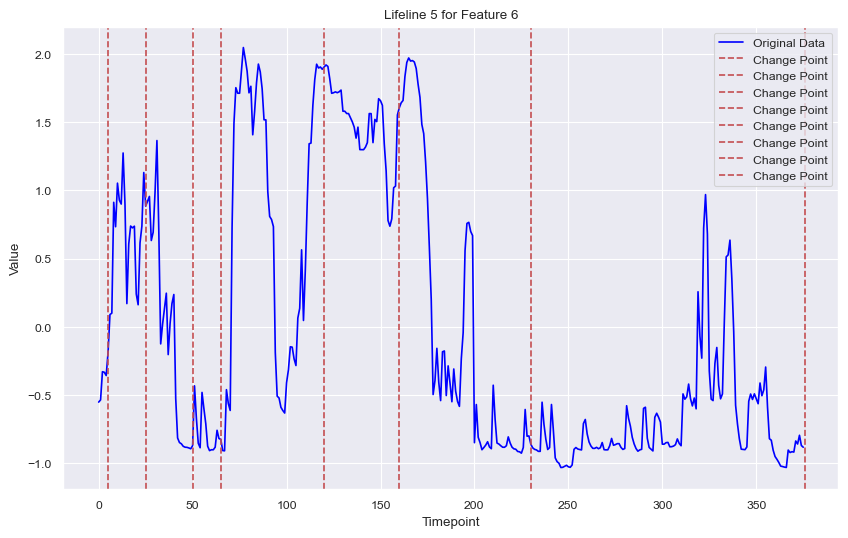

In [25]:
import ruptures as rpt
import matplotlib.pyplot as plt


lifeline = 5
feature = 6

# Extract the specific lifeline and feature series to be plotted
scaled_series = normalized_data[lifeline, :, feature]

# Plotting the original and reconstructed series
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')

# Plotting the change points
for bkpt in result:
    plt.axvline(x=bkpt, color='r', linestyle='--', label='Change Point')

plt.title(f'Lifeline {lifeline} for Feature {feature}')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


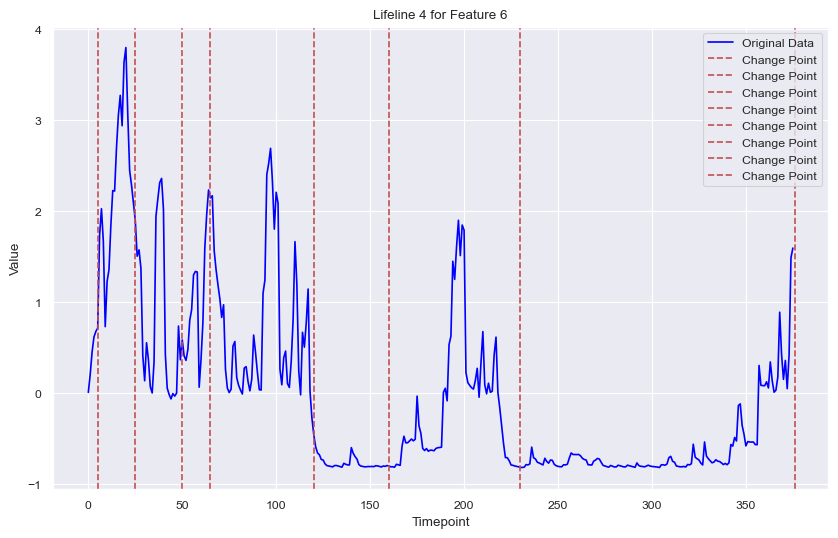

In [30]:
import ruptures as rpt
import matplotlib.pyplot as plt


lifeline = 4
feature = 6

# Extract the specific lifeline and feature series to be plotted
scaled_series = normalized_data[lifeline, :, feature]

# Plotting the original and reconstructed series
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')

# Plotting the change points
for bkpt in result:
    plt.axvline(x=bkpt, color='r', linestyle='--', label='Change Point')

plt.title(f'Lifeline {lifeline} for Feature {feature}')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


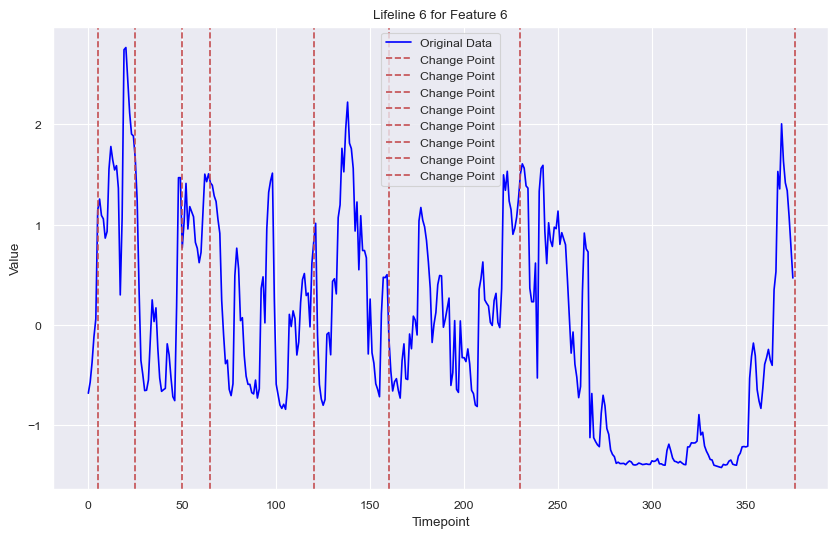

In [31]:
import ruptures as rpt
import matplotlib.pyplot as plt


lifeline = 6
feature = 6

# Extract the specific lifeline and feature series to be plotted
scaled_series = normalized_data[lifeline, :, feature]

# Plotting the original and reconstructed series
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')

# Plotting the change points
for bkpt in result:
    plt.axvline(x=bkpt, color='r', linestyle='--', label='Change Point')

plt.title(f'Lifeline {lifeline} for Feature {feature}')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


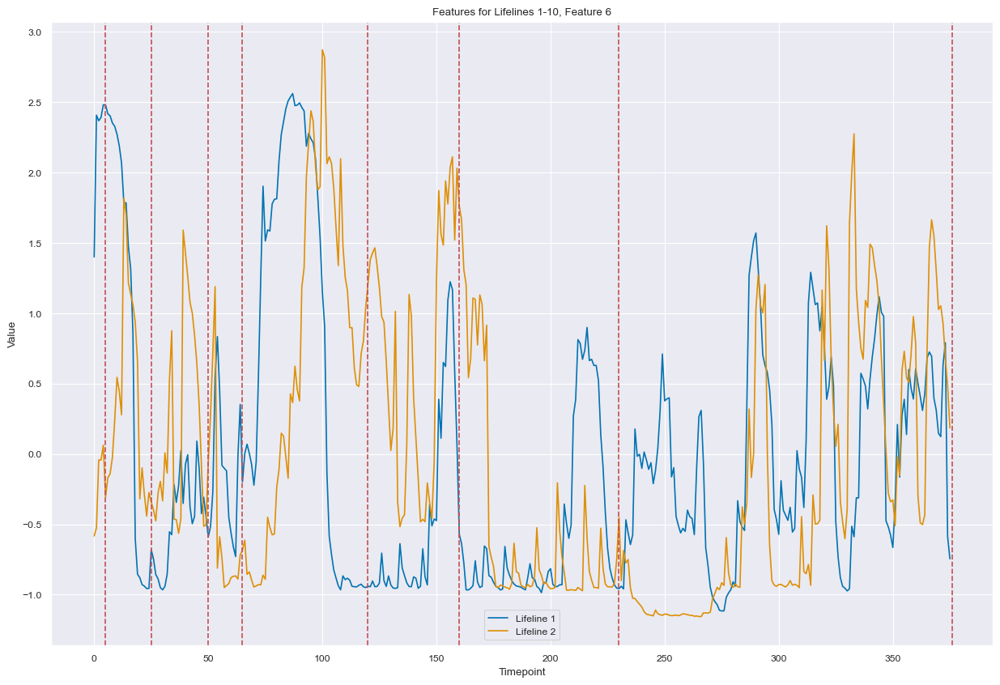

In [29]:
# Initialize the plot
plt.figure(figsize=(15, 10))

# Plotting the original series for lifelines 1-10, with change points
for lifeline in range(1, 3):
    # Extract the specific lifeline and feature series to be plotted
    scaled_series = normalized_data[lifeline, :, feature]
    # Plot the series
    plt.plot(scaled_series, label=f'Lifeline {lifeline}')

# Plotting the change points
for bkpt in result:
    plt.axvline(x=bkpt, color='r', linestyle='--')

# Set title and labels
plt.title(f'Features for Lifelines 1-10, Feature {feature}')
plt.xlabel('Timepoint')
plt.ylabel('Value')

# Create a legend
plt.legend()
plt.show()

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\elysi\AppData\Local\Temp\ipykernel_22800\3134900793.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')


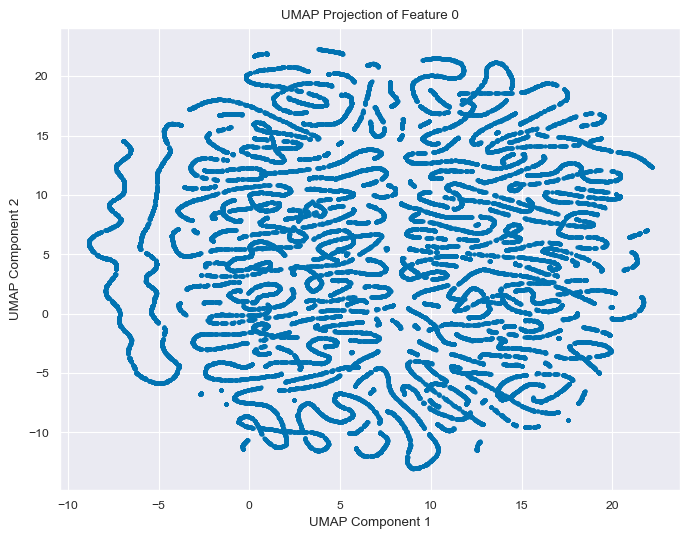

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\elysi\AppData\Local\Temp\ipykernel_22800\3134900793.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')


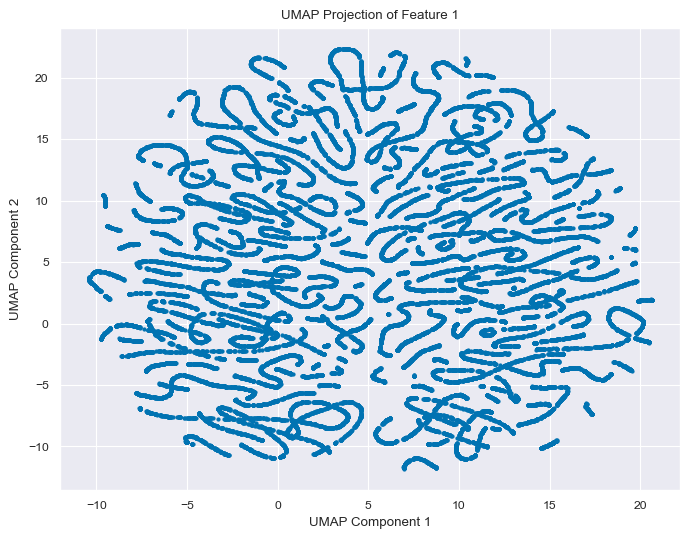

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\elysi\AppData\Local\Temp\ipykernel_22800\3134900793.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')


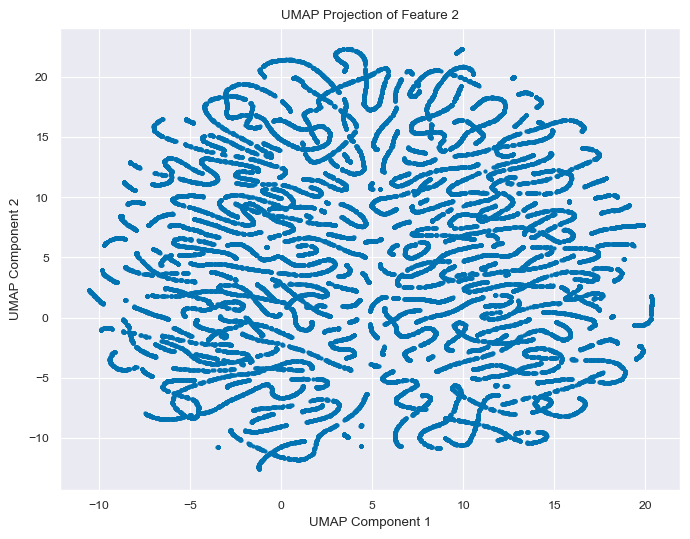

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\elysi\AppData\Local\Temp\ipykernel_22800\3134900793.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')


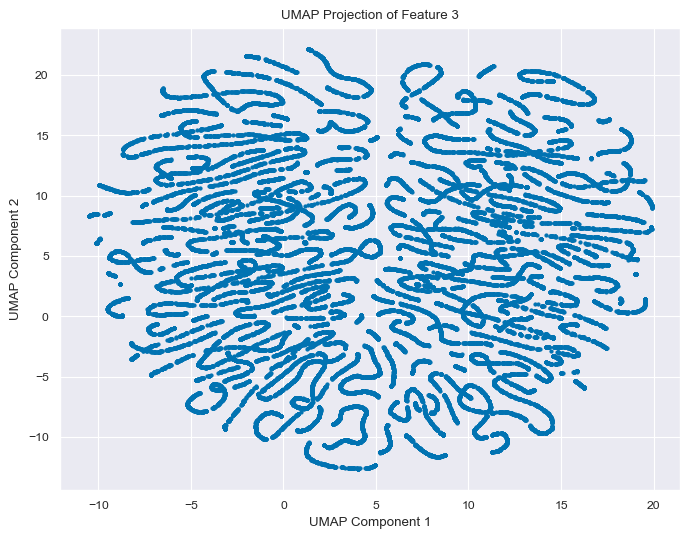

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\elysi\AppData\Local\Temp\ipykernel_22800\3134900793.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')


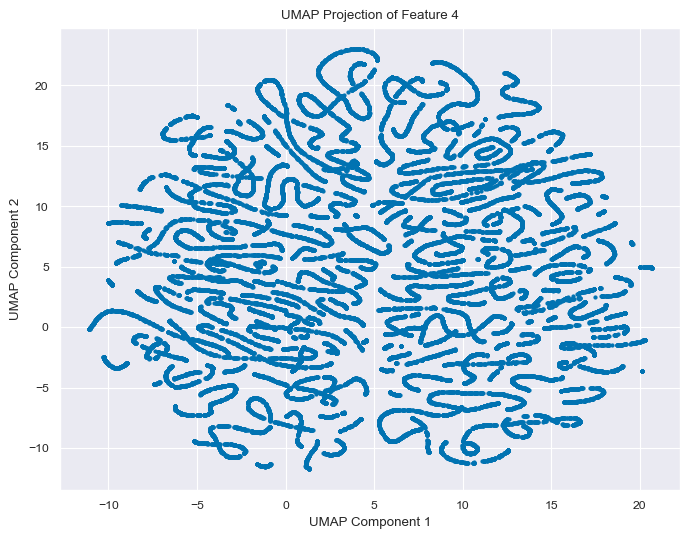

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\elysi\AppData\Local\Temp\ipykernel_22800\3134900793.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')


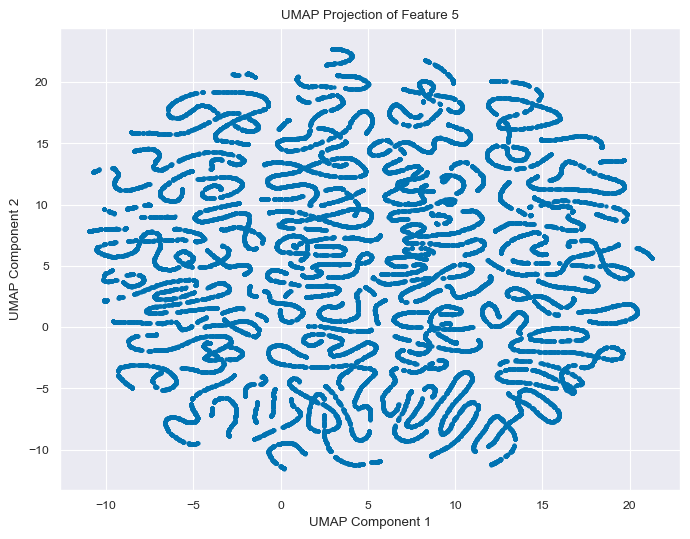

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\elysi\AppData\Local\Temp\ipykernel_22800\3134900793.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')


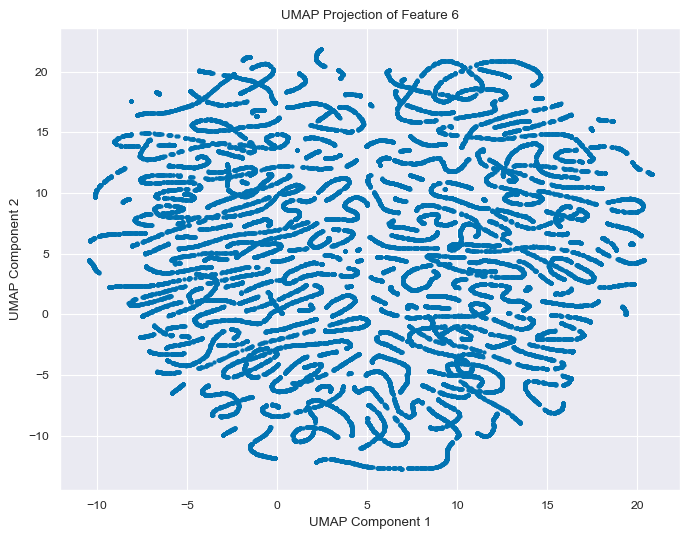

c:\Users\elysi\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


KeyboardInterrupt: 

In [16]:
from umap import UMAP
import matplotlib.pyplot as plt
import numpy as np

# Latent_representations with shape (101, 376, 10)

for feature_idx in range(latent_representations.shape[2]):
    # Extract the current feature across all samples and timesteps
    feature_data = latent_representations[:, :, feature_idx]
    
    # Reshape the data for UMAP (from 3D to 2D where each row is a timestep across all samples)
    # Now, each "observation" is a single timestep of a single feature across all samples
    umap_data = feature_data.reshape(-1, 1)

    # Apply UMAP
    umap = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
    umap_results = umap.fit_transform(umap_data)
    
    # Plot the UMAP results
    plt.figure(figsize=(8, 6))
    plt.scatter(umap_results[:, 0], umap_results[:, 1], s=5, cmap='Spectral')
    plt.title(f'UMAP Projection of Feature {feature_idx}')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.show()


# Break Points

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import ruptures as rpt
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.preprocessing import MinMaxScaler
import ruptures as rpt

# Assuming latent_representations is loaded with shape (101, 376, 9)

n_samples, n_timesteps, n_features = latent_representations.shape
n_clusters = 4
scaler = TimeSeriesScalerMeanVariance(mu=0., std=1.)


for feature_idx in range(n_features):
    # Preprocess the feature data
    feature_data = latent_representations[:, :, feature_idx].reshape(n_samples, n_timesteps, 1)
    feature_data_scaled = scaler.fit_transform(feature_data)

    # Cluster the data
    model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", verbose=False, max_iter=10)
    y_pred = model.fit_predict(feature_data_scaled)
    
    # Set up a figure with 4 subplots (for 4 clusters)
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # Adjust the size as necessary
    axes = axes.flatten()  # Flatten the axes array for easy indexing
    
    # Normalize the data for plotting
    mm_scaler = MinMaxScaler()

    for cluster_label in range(n_clusters):
        cluster_members = feature_data_scaled[y_pred == cluster_label].squeeze()
        centroid = model.cluster_centers_[cluster_label].squeeze()
        centroid_scaled = mm_scaler.fit_transform(centroid.reshape(-1, 1)).flatten()
        
        # Detect change points in the centroid
        algo = rpt.Pelt(model="l2").fit(centroid_scaled)
        result = algo.predict(pen=3)
        
        # Plot all series in the cluster
        ax = axes[cluster_label]
        for series in cluster_members:
            series_scaled = mm_scaler.transform(series.reshape(-1, 1)).flatten()
            ax.plot(series_scaled, "k-", alpha=0.5)
        
        # Highlight the centroid
        ax.plot(centroid_scaled, "r-", linewidth=2, label="Centroid")
        
        # Plot change points
        for point in result[:-1]:  # Exclude the last point which is just the length of the series
            ax.axvline(x=point, linestyle="--", color="b")
        
        ax.set_title(f'Cluster {cluster_label + 1}')
        ax.legend()

    plt.suptitle(f'Feature {feature_idx + 1}: Lifelines in Clusters with Centroids and Change Points')
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Adjust the layout to make room for the suptitle
    plt.savefig(f'feature_{feature_idx + 1}_clusters_lifelines.png')
    plt.close(fig)

print("All plots generated and saved.")


All plots generated and saved.


In [87]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
import seaborn as sns
import ruptures as rpt

n_samples, n_timesteps, n_features = latent_representations.shape
n_clusters = 4  # The number of clusters per feature

scaler = TimeSeriesScalerMeanVariance(mu=0., std=1.)  # For scaling each time series

def detect_change_points(time_series, penalty_value=3):
    # Create a change point detection model
    model = "l1"  # or "l2", "rbf", etc.
    algo = rpt.Pelt(model=model).fit(time_series)
    
    # Find change points, you can adjust the penalty value as needed
    result = algo.predict(pen=penalty_value)
    
    return result

# Normalizing data for plotting
mm_scaler = MinMaxScaler()

for feature_idx in range(n_features):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # Creating 4 subplots
    axes = axes.flatten() 
    
    feature_data = latent_representations[:, :, feature_idx]
    feature_data_scaled = scaler.fit_transform(feature_data.reshape(n_samples, n_timesteps, 1))

    # Fit the TimeSeriesKMeans model
    model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", verbose=False, max_iter=10)
    y_pred = model.fit_predict(feature_data_scaled)

    for cluster_label in range(n_clusters):
        cluster_members = feature_data_scaled[y_pred == cluster_label].squeeze()
        centroid = model.cluster_centers_[cluster_label].squeeze()
        centroid_scaled = mm_scaler.fit_transform(centroid.reshape(-1, 1)).flatten()

        ax = axes[cluster_label]
        
        # Plot a summary line (e.g., mean) with variability (e.g., standard deviation)
        cluster_data = np.array([mm_scaler.transform(series.reshape(-1, 1)).flatten() for series in cluster_members])
        mean_line = cluster_data.mean(axis=0)
        std_dev = cluster_data.std(axis=0)

        ax.plot(mean_line, "k-", label="Mean Lifeline")
        ax.fill_between(range(n_timesteps), mean_line - std_dev, mean_line + std_dev, color='gray', alpha=0.2)
        
        ax.plot(centroid_scaled, "r-", linewidth=1, label="Centroid")

        # Detect and plot change points
        change_points = detect_change_points(centroid_scaled)
        for cp in change_points:
            ax.axvline(x=cp, linestyle='--', color='blue', linewidth=1, alpha=0.7)

        ax.set_title(f'Cluster {cluster_label + 1}')
        ax.legend()

    plt.suptitle(f'Feature {feature_idx + 1}: Lifelines in Clusters with Centroids and Change Points')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect to make room for the suptitle
    plt.savefig(f'feature_{feature_idx + 1}_clusters.png')
    plt.close()

print("All plots saved.")


All plots saved.


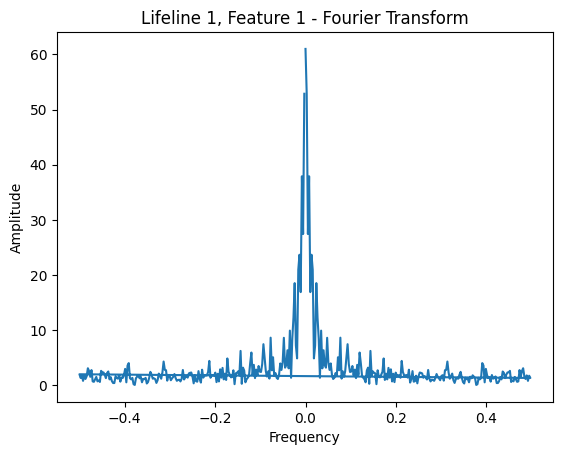

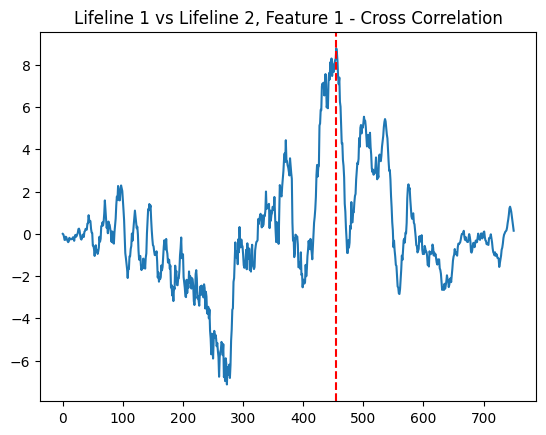

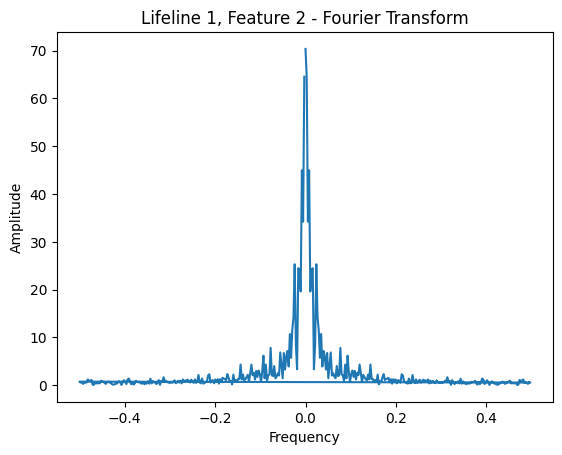

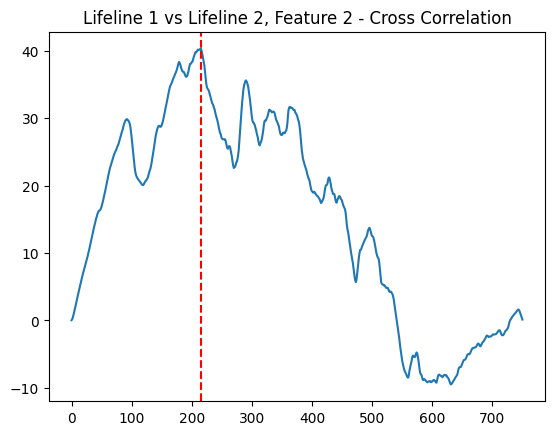

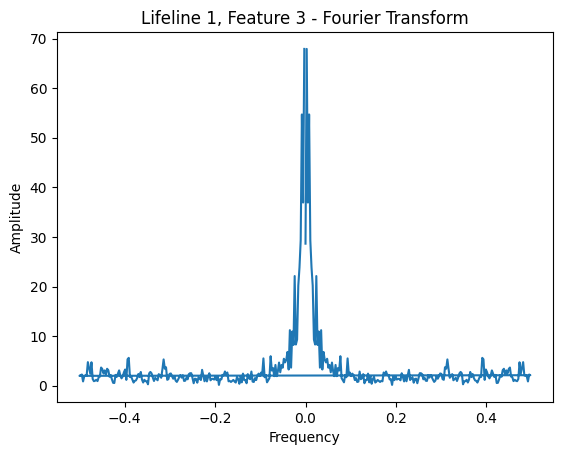

...

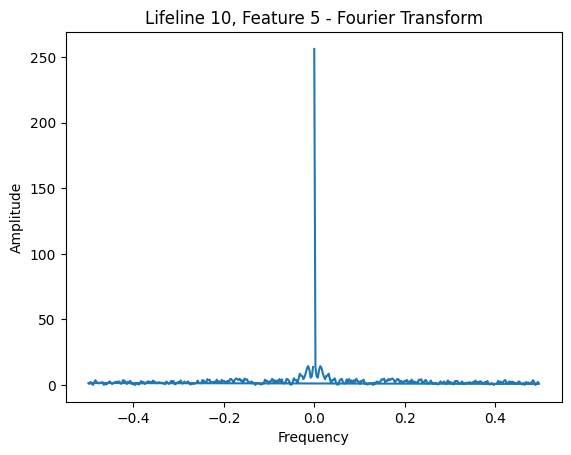

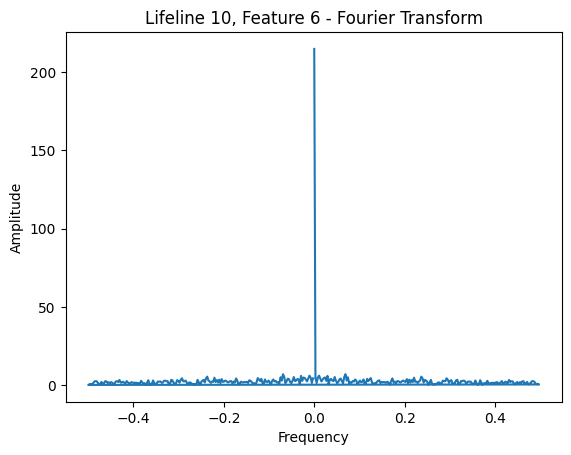

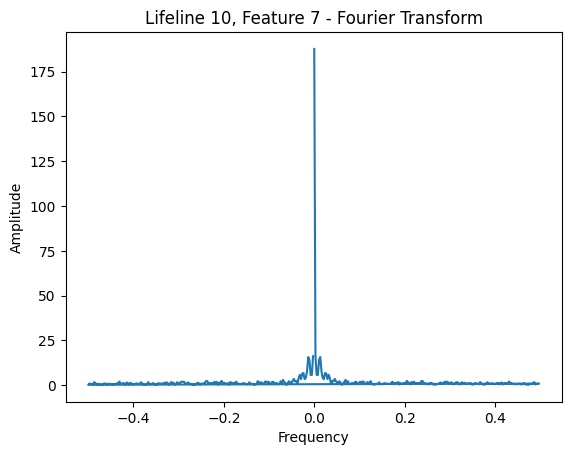

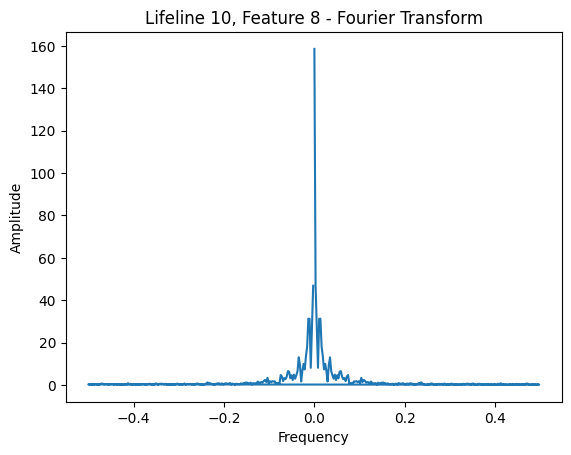

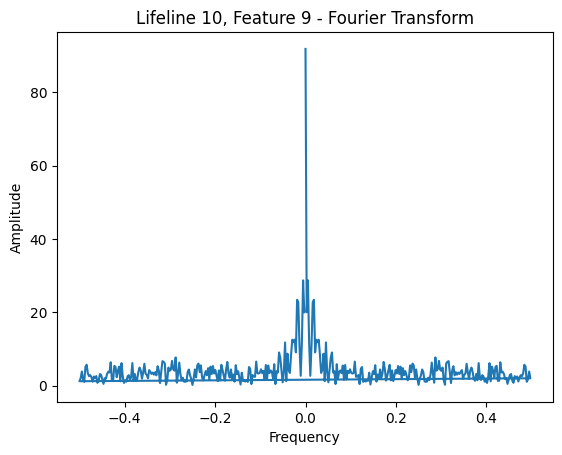

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack
from scipy.signal import correlate

def plot_fourier_transform(lifeline_data, title):
    # Fourier Transform for cycle detection
    X = fftpack.fft(lifeline_data)
    freqs = fftpack.fftfreq(len(lifeline_data))
    fig, ax = plt.subplots()
    ax.plot(freqs, np.abs(X))
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Amplitude')
    plt.title(title)
    plt.show()

def plot_cross_correlation(lifeline1, lifeline2, title):
    # Cross-correlation between two lifelines
    correlation = correlate(lifeline1, lifeline2)
    lags = correlation.argmax() - (len(lifeline1) - 1)
    plt.figure()
    plt.plot(correlation)
    plt.axvline(x=lags + len(lifeline1) - 1, color='red', linestyle='--')
    plt.title(title)
    plt.show()

# Assuming latent_representations is a numpy array with shape (101, 376, 9)
# and normalized_data is a numpy array with shape (101, 376, 48)
for i in range(10):  # Loop over the first 10 lifelines
    for feature_idx in range(9):  # Assuming 9 features in latent space
        lifeline_data = latent_representations[i, :, feature_idx]
        plot_fourier_transform(lifeline_data, f'Lifeline {i+1}, Feature {feature_idx+1} - Fourier Transform')

        if i < 9:  # We need at least two lifelines to compare
            lifeline_data_next = latent_representations[i+1, :, feature_idx]
            plot_cross_correlation(lifeline_data, lifeline_data_next, f'Lifeline {i+1} vs Lifeline {i+2}, Feature {feature_idx+1} - Cross Correlation')


# VAEs

In [3]:
import os
import pandas as pd
import numpy as np

folder_path = '100_dFBA_Lifelines'
file_names = sorted(os.listdir(folder_path))

expected_timepoints = 376 # reduced timepoints by 10 for faster runs, just temporary 

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    # Select every 10th row and ensure there are exactly 376 timepoints
    reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
    reduced_df.to_csv(file_path, sep="\t")

data_list = []
filtered_reactions = None

for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    lifeline_df = pd.read_csv(file_path, sep="\t", index_col=0)

    if filtered_reactions is None:
        non_constant_fluxes_df = lifeline_df.loc[:, (lifeline_df != lifeline_df.iloc[0]).any()]
        unique_reactions_fluxes_df = non_constant_fluxes_df.loc[:, ~non_constant_fluxes_df.columns.duplicated()]
        filtered_reactions = unique_reactions_fluxes_df.columns

    filtered_lifeline_df = lifeline_df[filtered_reactions]

    if filtered_lifeline_df.shape != (expected_timepoints, len(filtered_reactions)):
        print(f"Shape mismatch for file: {file_name}. Expected ({expected_timepoints}, {len(filtered_reactions)}) but got {filtered_lifeline_df.shape}")

    data_list.append(filtered_lifeline_df.to_numpy())

data_3d = np.stack(data_list, axis=1)
print("Shape of the Big Matrix:", data_3d.shape)


C:\Users\elysi\AppData\Local\Temp\ipykernel_34704\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_34704\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_timepoints]
C:\Users\elysi\AppData\Local\Temp\ipykernel_34704\597854438.py:15: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  reduced_df = lifeline_df.iloc[::10][:expected_t

Shape of the Big Matrix: (376, 101, 48)


In [4]:
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming data_3d is original data with shape (n_timesteps, n_samples, n_features)
# Example: n_timesteps = 376, n_samples = 14, n_features = 48

n_timesteps, n_samples, n_features = data_3d.shape

# Initialize a StandardScaler for each feature for each sample
scalers = [[StandardScaler() for _ in range(n_features)] for _ in range(n_samples)]

# Normalized data will have the same shape as data_3d initially
normalized_data = np.empty_like(data_3d, dtype=float)

# Apply the scalers to each feature for each sample across all timesteps
for sample_index in range(n_samples):
    for feature_index in range(n_features):
        # Extract the feature data for the current sample
        feature_data = data_3d[:, sample_index, feature_index].reshape(-1, 1)
        
        # Fit and transform the data using the corresponding scaler
        normalized_feature_data = scalers[sample_index][feature_index].fit_transform(feature_data)
        
        # Assign the normalized data back to its position in the normalized_data array
        normalized_data[:, sample_index, feature_index] = normalized_feature_data.flatten()

# Transpose normalized_data to have the shape (n_samples, n_timesteps, n_features)
normalized_data = np.transpose(normalized_data, (1, 0, 2))

In [6]:
normalized_data.shape

(101, 376, 48)

In [7]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, RepeatVector, TimeDistributed
from tensorflow.keras.initializers import glorot_uniform, he_normal
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam

def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

def build_vae(input_shape, latent_dim=5):
    # Encoder
    inputs = Input(shape=input_shape, name='encoder_input')
    x = LSTM(150, activation='tanh', return_sequences=True, kernel_initializer=glorot_uniform(seed=0))(inputs)
    x = LSTM(70, activation='tanh', return_sequences=False, kernel_initializer=glorot_uniform(seed=0))(x)
    z_mean = Dense(latent_dim, name='z_mean')(x)
    z_log_var = Dense(latent_dim, name='z_log_var')(x)
    z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

    # Decoder
    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
    x = RepeatVector(input_shape[0])(latent_inputs)  # Ensure the decoder's output matches encoder input shape
    x = LSTM(70, activation='tanh', return_sequences=True)(x)
    x = LSTM(150, activation='tanh', return_sequences=True)(x)
    outputs = TimeDistributed(Dense(input_shape[1]))(x)

    # Instantiate encoder, decoder, VAE models
    encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')
    decoder = Model(latent_inputs, outputs, name='decoder')
    vae_outputs = decoder(encoder(inputs)[2])
    vae = Model(inputs, vae_outputs, name='vae_lstm')

    # Define VAE loss
    reconstruction_loss = tf.reduce_mean(tf.keras.losses.mean_squared_error(K.flatten(inputs), K.flatten(vae_outputs)))
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1) * -0.5
    vae_loss = K.mean(reconstruction_loss + kl_loss)

    vae.add_loss(vae_loss)
    vae.compile(optimizer='adam')

    return encoder, decoder, vae



input_shape = (normalized_data.shape[1], normalized_data.shape[2])

encoder, decoder, vae = build_vae(input_shape, latent_dim=10)
vae.summary()



Model: "vae_lstm"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 encoder_input (InputLayer)  [(None, 376, 48)]            0         []                            
                                                                                                  
 encoder (Functional)        [(None, 10),                 182700    ['encoder_input[0][0]']       
                              (None, 10),                                                         
                              (None, 10)]                                                         
                                                                                                  
 decoder (Functional)        (None, 376, 48)              162528    ['encoder[0][2]']             
                                                                                           

In [8]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.callbacks import Callback
import tensorflow.keras.backend as K

class LRFinder(Callback):
    def __init__(self, base_lr, max_lr, steps):
        super(LRFinder, self).__init__()
        self.base_lr = base_lr
        self.max_lr = max_lr
        self.steps = steps
        self.lr_increment = (self.max_lr - self.base_lr) / self.steps
        self.lrs = []
        self.losses = []

    def on_batch_end(self, batch, logs=None):
        lr = self.base_lr + batch * self.lr_increment
        self.lrs.append(lr)
        self.losses.append(logs['loss'])
        K.set_value(self.model.optimizer.lr, lr)


def run_lr_finder(normalized_data, base_lr, max_lr, step_size):
    # Use the first sample shape as input_shape, assuming all samples have the same shape
    input_shape = (normalized_data.shape[1], normalized_data.shape[2])
    _, _, vae_model = build_vae(input_shape)  # Extract only the VAE model
    lr_finder = LRFinder(base_lr=base_lr, max_lr=max_lr, steps=step_size)
    
    # Use the normalized_data directly
    vae_model.fit(normalized_data, normalized_data, epochs=1, batch_size=32, callbacks=[lr_finder], verbose=0)
    
    return lr_finder.lrs, lr_finder.losses


# Assume normalized_data is already loaded and shaped as (samples, timesteps, features)
# Example shape, replace with your actual normalized_data shape
normalized_data_shape = (101, 38, 48)

learning_rate_ranges = [(1e-5, 1e-3), (1e-4, 1e-2), (1e-3, 1e-1), (1e-1, 8e-1)]
step_size = 100

for i, (base_lr, max_lr) in enumerate(learning_rate_ranges):
    lrs, losses = run_lr_finder(normalized_data, base_lr, max_lr, step_size)
    print(f"Learning Rate Test {i+1}: LR range {base_lr} to {max_lr}")
    print("Learning Rates:", lrs)
    print("Losses:", losses)
    print("-------")


Learning Rate Test 1: LR range 1e-05 to 0.001
Learning Rates: [1e-05, 1.9900000000000003e-05, 2.98e-05, 3.97e-05]
Losses: [1.225088357925415, 1.1400666236877441, 1.1122878789901733, 1.1017320156097412]
-------
Learning Rate Test 2: LR range 0.0001 to 0.01
Learning Rates: [0.0001, 0.000199, 0.00029800000000000003, 0.000397]
Losses: [1.19523286819458, 1.1403300762176514, 1.1228266954421997, 1.1070921421051025]
-------
Learning Rate Test 3: LR range 0.001 to 0.1
Learning Rates: [0.001, 0.00199, 0.00298, 0.00397]
Losses: [1.1403732299804688, 1.1232281923294067, 1.1081985235214233, 1.092962622642517]
-------
Learning Rate Test 4: LR range 0.1 to 0.8
Learning Rates: [0.1, 0.10700000000000001, 0.114, 0.12100000000000001]
Losses: [1.3474161624908447, 1.2278599739074707, 3.3160600662231445, 3.3555867671966553]
-------


In [9]:
import numpy as np
import tensorflow as tf

class OneCycleLRScheduler(tf.keras.callbacks.Callback):
    def __init__(self, max_lr, total_steps, div_factor=10, increase_fraction=0.3):
        super(OneCycleLRScheduler, self).__init__()
        self.max_lr = max_lr  # Maximum learning rate (upper bound)
        self.total_steps = total_steps  # Total steps in the cycle
        self.div_factor = div_factor  # Determines the lower bound of learning rate
        self.increase_fraction = increase_fraction  # Fraction of steps to increase the learning rate
        self.higher_lr = self.max_lr
        self.lower_lr = self.max_lr / self.div_factor
        self.step_size_up = self.total_steps * self.increase_fraction
        self.step_size_down = self.total_steps - self.step_size_up
        
    def on_train_batch_begin(self, batch, logs=None):
        progress = batch / self.total_steps
        if progress <= self.increase_fraction:
            # Increase phase
            lr = self.lower_lr + (self.higher_lr - self.lower_lr) * (progress / self.increase_fraction)
        else:
            # Decrease phase
            progress -= self.increase_fraction
            lr = self.higher_lr - (self.higher_lr - self.lower_lr) * (progress / (1 - self.increase_fraction))
        tf.keras.backend.set_value(self.model.optimizer.lr, lr)


In [11]:
from sklearn.model_selection import train_test_split

epochs = 1000  # Number of epochs to train
batch_size = 32  # Batch size

# Split the data while keeping the lifeline structure
train_data, test_data = train_test_split(normalized_data, test_size=0.2, random_state=42)

# Calculate the number of steps per epoch
steps_per_epoch = len(train_data) // batch_size
total_steps = epochs * steps_per_epoch

input_shape = (normalized_data.shape[1], normalized_data.shape[2])

_, _, vae = build_vae(input_shape, latent_dim=10)  

vae.compile(optimizer=Adam(), loss='mse') 

one_cycle_lr = OneCycleLRScheduler(max_lr=0.107, total_steps=total_steps, div_factor=10, increase_fraction=0.3)

# Train the model using the training data and validate on the test data
vae.fit(train_data, train_data, 
        validation_data=(test_data, test_data),
        epochs=epochs, 
        batch_size=batch_size, 
        callbacks=[one_cycle_lr])

# Evaluate the model on test data to see the test error
test_loss = vae.evaluate(test_data, test_data)
print(f'Test Loss: {test_loss}')


Epoch 1/1000
3/3 [==============================] - 40s 10s/step - loss: 3.1968 - val_loss: 2.5761
Epoch 2/1000
3/3 [==============================] - 28s 8s/step - loss: 2.3172 - val_loss: 2.0711
Epoch 3/1000
3/3 [==============================] - 28s 8s/step - loss: 2.0552 - val_loss: 2.0186
Epoch 4/1000
3/3 [==============================] - 27s 8s/step - loss: 2.0168 - val_loss: 1.9947
Epoch 5/1000
3/3 [==============================] - 27s 8s/step - loss: 2.1300 - val_loss: 2.0179
Epoch 6/1000
3/3 [==============================] - 27s 8s/step - loss: 2.0151 - val_loss: 2.0052
Epoch 7/1000
3/3 [==============================] - 28s 8s/step - loss: 2.0058 - val_loss: 2.0008
Epoch 8/1000
3/3 [==============================] - 28s 8s/step - loss: 2.0021 - val_loss: 1.9980
Epoch 9/1000
3/3 [==============================] - 28s 8s/step - loss: 2.0000 - val_loss: 1.9950
Epoch 10/1000
3/3 [==============================] - 28s 8s/step - loss: 1.9970 - val_loss: 1.9930
Epoch 11/1000
3/3 

3/3 [==============================] - 5s 869ms/step


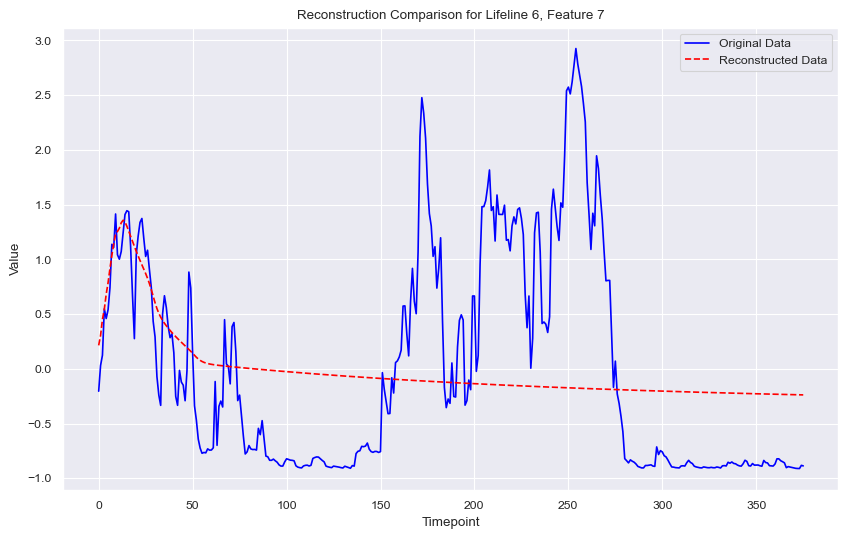

In [12]:
import matplotlib.pyplot as plt
import numpy as np

model = vae  # Use the VAE model for predictions

# Predict the reconstruction for the lifeline
reconstructed = model.predict(train_data)
lifeline_index = 5  # Assuming you want to plot the reconstruction for the 6th lifeline
feature_index = 6  # Assuming you're interested in the 7th feature

# Assuming train_data is shaped (num_samples, num_timesteps, num_features) and you want to plot specific lifeline and feature
original_series = train_data[lifeline_index, :, feature_index]
reconstructed_series = reconstructed[lifeline_index, :, feature_index]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(original_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title(f'Reconstruction Comparison for Lifeline {lifeline_index + 1}, Feature {feature_index + 1}')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


# Latent Space - One Vector for each Lifeline

In [70]:
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.initializers import glorot_uniform, he_normal
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

train_data = normalized_data
val_data = train_data  # Using the same data for validation as a placeholder

# Define the input layer with the shape (timesteps, features)
input_shape = (train_data.shape[1], train_data.shape[2])
inputs = Input(shape=input_shape)

# Encoder layers with glorot_uniform initializer
#encoded = LSTM(100, activation='tanh', return_sequences=True,
#               kernel_initializer=glorot_uniform(seed=0))(inputs)
encoded = LSTM(100, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(inputs)
encoded = LSTM(70, activation='tanh', return_sequences=False,
               kernel_initializer=glorot_uniform(seed=0))(encoded)
# Latent space with he_normal initializer
latent_space = Dense(50, activation='tanh',
                     kernel_initializer=he_normal(seed=0))(encoded)

# Decoder layers, repeat the latent space at each timestep
decoded = RepeatVector(input_shape[0])(latent_space)
decoded = LSTM(70, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
decoded = LSTM(100, activation='tanh', return_sequences=True,
               kernel_initializer=glorot_uniform(seed=0))(decoded)
#decoded = LSTM(100, activation='tanh', return_sequences=True,
#               kernel_initializer=glorot_uniform(seed=0))(decoded)

# Output layer, reconstruct the original input
outputs = TimeDistributed(Dense(input_shape[1]))(decoded)

# Create the autoencoder model
autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='mse')

# Summary of the model
autoencoder.summary()

Model: "model_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_53 (InputLayer)       [(None, 376, 48)]         0         
                                                                 
 lstm_68 (LSTM)              (None, 376, 100)          59600     
                                                                 
 lstm_69 (LSTM)              (None, 70)                47880     
                                                                 
 dense_18 (Dense)            (None, 50)                3550      
                                                                 
 repeat_vector_1 (RepeatVec  (None, 376, 50)           0         
 tor)                                                            
                                                                 
 lstm_70 (LSTM)              (None, 376, 70)           33880     
                                                          

In [74]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=20, min_lr=0.00001)
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Fit the model
history = autoencoder.fit(
    train_data,
    train_data,
    epochs = 200,
    batch_size=32,  # Adjust the batch size if necessary
    validation_data=(val_data, val_data),
    callbacks=[reduce_lr, early_stop]
)

# Predict on the validation set
val_predictions = autoencoder.predict(val_data)

# Compute mean squared error on the validation set
mean_squared_error = np.mean(np.square(val_data - val_predictions))

# Compute root mean squared error (RMSE)
reconstruction_loss = np.sqrt(mean_squared_error)
print(f"Validation RMSE: {reconstruction_loss}")


Epoch 1/200
4/4 [==============================] - 32s 8s/step - loss: 0.9076 - val_loss: 0.9077 - lr: 0.0010
Epoch 2/200
4/4 [==============================] - 30s 8s/step - loss: 0.9086 - val_loss: 0.8991 - lr: 0.0010
Epoch 3/200
4/4 [==============================] - 32s 8s/step - loss: 0.9000 - val_loss: 0.9064 - lr: 0.0010
Epoch 4/200
4/4 [==============================] - 40s 11s/step - loss: 0.9051 - val_loss: 0.8973 - lr: 0.0010
Epoch 5/200
4/4 [==============================] - 33s 8s/step - loss: 0.8958 - val_loss: 0.9000 - lr: 0.0010
Epoch 6/200
4/4 [==============================] - 34s 9s/step - loss: 0.9005 - val_loss: 0.9071 - lr: 0.0010
Epoch 7/200
4/4 [==============================] - 28s 7s/step - loss: 0.9045 - val_loss: 0.8917 - lr: 0.0010
Epoch 8/200
4/4 [==============================] - 27s 7s/step - loss: 0.8938 - val_loss: 0.8927 - lr: 0.0010
Epoch 9/200
4/4 [==============================] - 28s 7s/step - loss: 0.8902 - val_loss: 0.8836 - lr: 0.0010
Epoch 10/

4/4 [==============================] - 4s 831ms/step


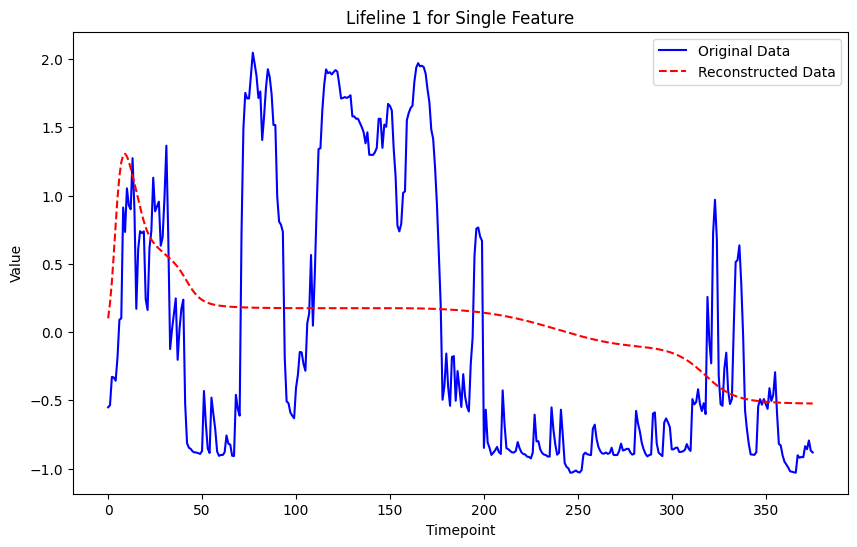

In [75]:
import matplotlib.pyplot as plt

# Assuming that one_lifeline is your data reshaped correctly for the model input
# Example: one_lifeline = np.random.rand(1, 376, 1)  # Use your actual reshaped data here

# Predict the reconstruction for the lifeline
reconstructed = autoencoder.predict(train_data)
lifeline = 5
feature = 6 

# Flatten the arrays to be able to plot them since they contain a single feature
scaled_series = train_data[lifeline,:,feature]
reconstructed_series = reconstructed[lifeline,:,feature]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(scaled_series, label='Original Data', color='blue')
plt.plot(reconstructed_series, label='Reconstructed Data', color='red', linestyle='--')
plt.title('Lifeline 1 for Single Feature')
plt.xlabel('Timepoint')
plt.ylabel('Value')
plt.legend()
plt.show()


# Building Yaml and Scripts

In [1]:
pip install pyyaml


Note: you may need to restart the kernel to use updated packages.


In [5]:
import yaml

config = {
    "model": {
        "lstm_units": [200, 300, 350, 400],
        "lstm_units_layer2": [200, 250, 275, 300],
        "dense_units": [50, 100, 150, 200],
        "learning_rate": [1e-5, 1e-2],
        "batch_size": [16, 32, 64],
        "epochs": 10,
        "patience": 10,
        "reduce_lr_patience": 5,
        "min_lr": 0.00001,
        "n_trials":10
    },
    "plotting": {
        "lifeline_index": 12,
        "reaction_index": 6
    },
    "data": {
        "folder_path": "100_dFBA_Lifelines",
        "downsample_factor": 10, 
        "expected_timepoints": 376 
    }
}

with open('config.yaml', 'w') as file:
    yaml.dump(config, file, default_flow_style=False)


In [3]:
import yaml

config = {
    "model": {
        "lstm_units": [100],
        "lstm_units_layer2": [70],
        "dense_units": [50],
        "learning_rate": {
            "min": 1e-5,
            "max": 1e-2
        },
        "batch_size": [16, 32, 64],
        "epochs": 5,
        "patience": 10,
        "reduce_lr_patience": 5,
        "min_lr": 0.00001,
        "n_trials": 1
    },
    "plotting": {
        "lifeline_index": 12,
        "reaction_index": 6
    },
    "data": {
        "folder_path": "100_dFBA_Lifelines",
        "downsample_factor": 10, 
        "expected_timepoints": 376 
    }
}

with open('config.yaml', 'w') as file:
    yaml.dump(config, file, default_flow_style=False)

